# Social Network Analysis - Amber Heard Case - YouTube

## Table of Contents
<ul>
<li><a href="#intro"><b>Introduction</b></a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction
>YouTube - Social Network Analysis on Amber Heard's Case 

In [1]:
import pandas as pd
import os
pd.set_option('display.max_columns', 500)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objects as go
import pickle
import re
import warnings
import datetime
warnings.filterwarnings('ignore')
sb.set_style("darkgrid")
%matplotlib inline

import plotly.io as pio
pio.renderers
# pio.renderers.default = "svg"
svg_renderer = pio.renderers["svg"]
svg_renderer.width = 950
svg_renderer.height = 550


import helpers

# To Apply helpers updates without resarting the kernel
import importlib
importlib.reload(helpers)

# # To keep track of any module updates
# %load_ext autoreload
# %autoreload2

%config InlineBackend.figure_format = 'retina'

https://stackoverflow.com/questions/24719368/syntaxerror-non-default-argument-follows-default-argument/39942121

In [2]:
cd ../../Filtered Data/comments_cleaned

/Users/mnagy99/jupyter/AH/YouTube_Bot_Analysis/Filtered Data/comments_cleaned


<br>

In [3]:
# df_comments[df_comments.text.str.contains('kill amber')].shape[0]

In [4]:
threat_dict = {'deserve': 26320, 
               'jail': 18937, 
               'prison': 8257, 
               'in hell': 1491,
               'to hell': 1121,
               'kill her': 586,
               "who the hell is": 142,
               'burn her': 134,
               'her burn': 107, 
               'pay for her crime': 74,
               'kill amber': 53,
               'amberfbi': 29,
               'kiss of death': 19, 
               ' go die': 17,
               'isacriminal': 14,
               'burn turd': 7,
               'tohell': 5,
               'kill heard': 4,
               'death amber': 4,
               'inhell': 4,
               'deathto': 4,
               "death to fascists": 1, 
               "death to mera": 1, 
               "death to all narcissistic": 1,
               "social death to": 1, 
               "professional death": 1, 
               "death to femnazis": 1, 
               "death to those people": 1,  
               'die cunt': 1, 
               'kys fuck you amber': 1, 
               'death to fascists': 1,
               'death to a turd': 1,
               'death to anybody not supporting johnny': 1, 
               'go kill yourselves': 1, 
               'kill all the people who disliked': 1,    
               'if she wants assault she well get it': 1}

<a id='eda'></a>
## Exploratory Data Analysis
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#eda"><b>Exploratory Data Analysis</b></a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

> <ul>
 <li><a href="#threat_comments">Threat Comments</a></li>
 <li><a href="#hate_speech">Hate-Speech Comments</a></li>
 <li><a href="#same">Same Text Same Date</a></li>
 <li><a href="#primarly">Primarly Text Investigations</a></li>
 </ul>

In [5]:
df_comments = pd.read_csv("comments_cleaned_zipped.csv", compression='zip',
                          low_memory=False, lineterminator='\n')

df_comments["p_dtime"] = pd.to_datetime(df_comments["p_dtime"])
df_comments["date"] = pd.to_datetime(df_comments["date"])
df_comments["u_dtime"] = pd.to_datetime(df_comments["u_dtime"])

df_comments = df_comments.sort_values('p_dtime')
print(df_comments.shape)
df_comments.head(1)

(2176543, 20)


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
15688,ADGD8h5Mjm0,rFc2SYR3gOPrk12bVX5oCE0L1lo,UgxarrUc8tsEzPcnUVR4AaABAg,she is almost as annoying as the asswipe inter...,dvforever,UC4tYW6Yp_DqjrI6uhtvrzvg,0.0,2008-03-26 00:56:59+00:00,2008-03-26 00:56:59+00:00,0.0,NaN,comment,none,none,none,2008,2008-03-26,Mar,26,0


In [6]:
df_comments.p_dtime.dt.date.min(), df_comments.p_dtime.dt.date.max()

(datetime.date(2008, 3, 26), datetime.date(2021, 12, 8))

In [7]:
# df_comments.info()

In [8]:
# helpers.isnull(df_comments)

In [9]:
df_comments.dropna(subset=['text'], inplace=True)

In [10]:
sum(df_comments.p_dtime != df_comments.u_dtime)

133253

In [11]:
for col in ['year', 'username', 'moderation_status', 'comment_reply']:
    print('The value counts of ' + col)
    print(df_comments[col].value_counts().head())
    print('\n')

The value counts of year
2020    893138
2021    792578
2018    192108
2019    118408
2016     54618
Name: year, dtype: int64


The value counts of username
Johnny Depp       15986
eHacker            8343
JOHNNY DEPP        3921
Stevie J Raw       3516
LaraCroftEyes1     3270
Name: username, dtype: int64


The value counts of moderation_status
likelySpam    2240
Name: moderation_status, dtype: int64


The value counts of comment_reply
comment    1692570
reply       483441
Name: comment_reply, dtype: int64




<br>

<br>

In [12]:
# Create an empty set of threat commenting users
threat_users = set()

In [13]:
pos_text = {'love amber', 'stand with amber', 'standwithamber', 'support amber', 'supportamber', 'justiceforamber', 
            'johnnydeppisawifebeater', 'boycottwomenbeaters', 'wearewithamber', 'justice for amber', 
            'istandwithamber','wearewithyouamber'}
df_pos = df_comments[df_comments.text.str.contains('|'.join(pos_text))]

In [14]:
# Those users were checked and did not find negative comments
checked_set = {'eHacker', 'Stevie J Raw', 'DarthN3ws', "Nerdette's NewsStand", 'Sunshine', 'Binge Central',
               'Abbey Sharp', 'ko 3', 'Mary Shephard', 'Madison Beer', 'Baby Bunny', 'LadyDominion',
               'Tom Harlock', 'Gus Johnson', 'Mr. Bruhhh', 'Crypto Info 2', 'demi demi', '8-Bit Tex', 'Ty Y', 
               'Incredibly Average', 'DELCARAJO TV', 'Flashback FM','Funeral bug', 'Stranger In the Alps', 
               "Nerdette's NewsStand"}

In [15]:
remove_users = checked_set | set(df_pos.username)

<br>

<br>

<a id='threat_comments'></a>
> ## Exploring Threat Comments
> <ul>
    <li><a href="#threat_comments"><b>Threat Comments</b></a></li>
 <li><a href="#hate_speech">Hate-Speech Comments</a></li>
 <li><a href="#same">Same Text Same Date</a></li>
 <li><a href="#primarly">Primarly Text Investigations</a></li>
 </ul>

<a id='all_threat'></a>
>>## All Threat 
> <ul>
 <li><a href="#all_threat"><b>All Threat</b></a></li>
 <li><a href="#kill_death">Kill & Death</a></li>
 <li><a href="#hell_burn">Hell & Burn</a></li>
 <li><a href="#threat_users">Threat Users Contributions</a></li>
 </ul>

In [16]:
# KYS is an internet acronym standing for “kill yourself
all_threat = {'deathto', "death to fascists", "death to mera", "death to all narcissistic", "social death to", 
              "professional death", "death to femnazis", "death to those people", ' go die', 'die cunt', 
              'kill heard', 'kill amber', 'kill her', 'kys fuck you amber', 'deserve', 'jail', 'prison', 
              'pay for her crimes', 'if she wants assault she well get it', 'death to a turd', 'amberfbi'
              'death to anybody not supporting johnny', 'kiss of death', 'death amber', 'go kill yourselves',
              'kill all the people who disliked', ' to hell', 'tohell', 'in hell', 'inhell',
              "who the hell is", 'burn her', 'burn turd', 'her burn', 'isacriminal'}

In [17]:
df_threat = df_comments[df_comments.text.str.contains('|'.join(all_threat))]
df_threat.shape[0]

53541

In [18]:
# exclude all the users with positive comments
df_threat = df_threat[~df_threat.username.isin(remove_users)]
print(f'{df_threat.shape[0]} contributions, on {df_threat.video_id.nunique()} Videos, made by {df_threat.username.nunique()} Users')
df_threat.head(2)


51179 contributions, on 2973 Videos, made by 35928 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
14635,_xjy6EuMPGA,K1N0GaI2K6E78Ypr67LEJjYE4qQ,UgwxSz7tqzqHrDv24Lp4AaABAg,i'm a small town girl and at my school you kne...,Zukosgirl251,UCJ4AvN0j6a6EY6cpBNJ864A,0.0,2010-01-14 03:57:49+00:00,2010-01-14 03:57:49+00:00,0.0,NaN,comment,none,none,none,2010,2010-01-14,Jan,14,3
14606,_xjy6EuMPGA,2nuxmyXSEz38jm4nHvMhHRjCRtM,UgzN6JCgUO9DPSY-g7V4AaABAg,i'm from a small town and everyone in my city ...,Zukosgirl251,UCJ4AvN0j6a6EY6cpBNJ864A,0.0,2010-04-15 03:26:22+00:00,2010-04-15 03:26:22+00:00,0.0,NaN,comment,none,none,none,2010,2010-04-15,Apr,15,3


<br>

### A Heat Map for the Threat Comments 

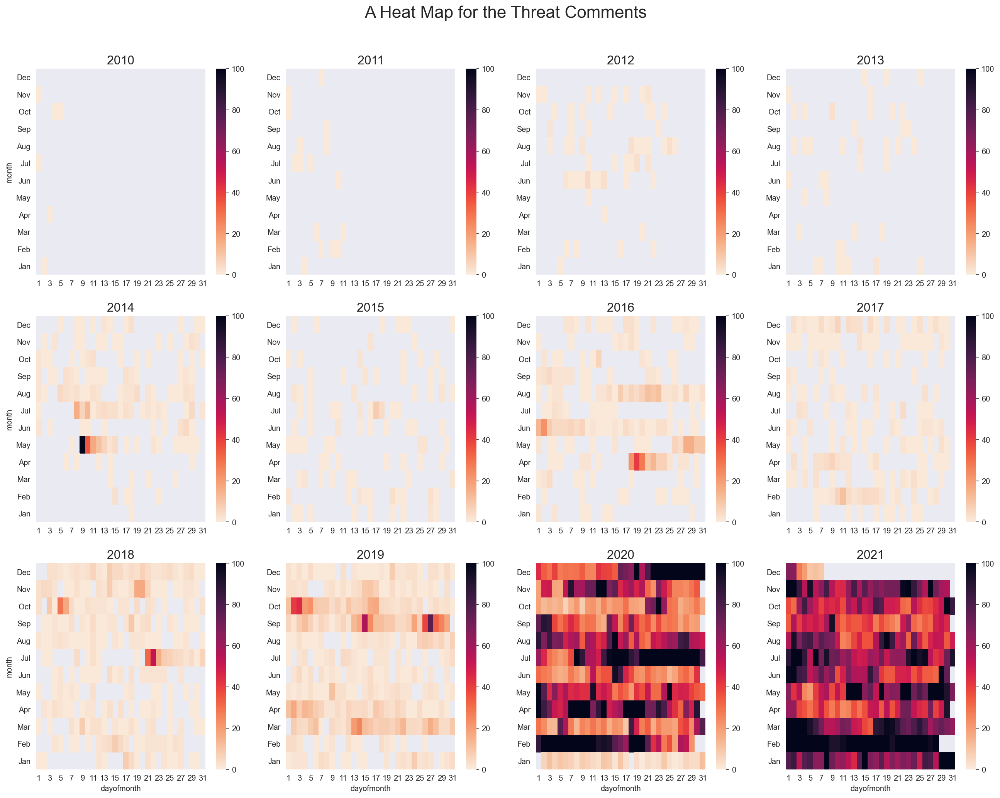

In [19]:
threat_daily = df_threat.groupby(['year', 'dayofmonth', 'month']).size().reset_index(name='ncomments')

title = 'A Heat Map for the Threat Comments'
helpers.facet_heat(threat_daily, title, n_col=4, vmax=100)

### Threat Comments Peak Dates

In [20]:
threat_dates = df_threat.groupby(['date']).agg({'text':'count', 'nlikes': 'sum', 'nreplies': 'sum'}).reset_index(
).rename(columns={'text':'ncomments'}).sort_values('ncomments', ascending=False)

threat_dates.head(15)

,date,ncomments,nlikes,nreplies
1339,2020-04-08,600,13361.0,462.0
1278,2020-02-07,499,31488.0,692.0
1597,2020-12-22,483,2660.0,34.0
1275,2020-02-04,457,16332.0,378.0
1598,2020-12-23,425,1453.0,42.0
1340,2020-04-09,377,9029.0,250.0
1599,2020-12-24,373,1119.0,41.0
1279,2020-02-08,357,10602.0,259.0
1274,2020-02-03,302,13181.0,269.0
1444,2020-07-22,298,13783.0,327.0


This comment got 478 likes
- ezra miller chockes a woman on camera twitter death amber heard clearly abused johnny depp twitter imma pretend i didn't see that

In [21]:
df_threat[(df_threat.date == '2020-04-08') & (df_threat.hour == 21)]

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
640551,c0l38akMxoM,MsfR76GGAsS2mZFRux9WD7uzqwQ,UgzIUQdML1uxPrDy9J54AaABAg,thank you murica bitch deserves it!,A Of demons,UC1XuS8SAjWqPhfqS7KXkYog,0.0,2020-04-08 21:02:55+00:00,2020-04-08 21:04:06+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
640547,c0l38akMxoM,dNzIXP4TenwLMGLjUGbr1OrlN2o,UgxlfeDQMWTPGyTgQxJ4AaABAg,if she did this?? she is a horrible excuse for...,Suzie Phillips,UCRJCmm8MpCTn1IlHjobdM7A,0.0,2020-04-08 21:08:26+00:00,2020-04-08 21:08:26+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
883708,fSc7kfihiXM,yXf8_bVkONtS2DHD6cSk06V0AkI,UgyHICCBOzGJzZ3PTtd4AaABAg,you should call for youtubers to boycott buyin...,BigRed Nebraska94,UCOPNn9heb96PkQniVWseHzQ,0.0,2020-04-08 21:08:37+00:00,2020-04-08 21:08:37+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
640546,c0l38akMxoM,-4jf2RVJpbeWjpeA1-hzRt19tMc,Ugzz8LlWcgOyZZ12zgZ4AaABAg,i feel so sad for johnny it is incredibly unfa...,floaguilar099,UCcvae396z-q8M5eIb31bkIQ,61.0,2020-04-08 21:09:24+00:00,2020-04-08 21:09:24+00:00,1.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
640542,c0l38akMxoM,I9PfBBWwiliW_GBhqUMuTc4-VLo,UgzOGl043lHORuuhUTR4AaABAg,i know a guy who spent time in jail because hi...,zane Elliot,UCZVuLcCzwtH4EVG93xqSZJA,667.0,2020-04-08 21:12:13+00:00,2020-04-08 21:12:13+00:00,33.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
640540,c0l38akMxoM,a6Qc2x5UyqNzVCZLjkvgBGRFGYI,Ugx3Iw7K-03joIQZQJN4AaABAg,good she deserves worse,Nicholas Fowler,UC8wA4tnTFbTKE_reOCHDkCA,0.0,2020-04-08 21:15:20+00:00,2020-04-08 21:15:20+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
822720,Srbp8yMRnsE,VGS72km7kGRf9ZAXd1VfZUoKBjY,Ugw3lsWI9-3TYCuZIOJ4AaABAg,3 years is not enough! she need to rot in jail...,sylvee Wk,UCxp3IAtX_VkTThquapq9P0A,0.0,2020-04-08 21:15:25+00:00,2020-04-08 21:15:25+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
438100,CRkKDLCt1iA,cdR9ZvBUeOJhEvo6LSaeh-o7sD8,UgwN1vKyTPZ-syUPg_t4AaABAg,ezra miller chockes a woman on camera twitter ...,JMWyastrop,UCh3QrNYcIrvKsdR9ZVHaYOg,478.0,2020-04-08 21:18:44+00:00,2020-04-08 21:18:57+00:00,16.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
640535,c0l38akMxoM,NS58P2oB_pyVbPYRHOuTt3G2eEY,UgwXrJU9IXNQqFYuk5t4AaABAg,she wont go to jail it will alter her career tho,Marvalis,UCu97rDvE3rnVtuzzwfz3-0w,0.0,2020-04-08 21:21:03+00:00,2020-04-08 21:21:03+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21
886929,0MSd9SsGLNs,iVExgtaToIHoU7lytkrhYuEfjQQ,UgxkjLiQfmFAz5Ooskx4AaABAg,how about harvey's weinstein? cosby? they got ...,192119241960,UC7k2iVS3SwGeAojQg6jJjBw,0.0,2020-04-08 21:24:36+00:00,2020-04-08 21:24:36+00:00,0.0,NaN,comment,none,none,none,2020,2020-04-08,Apr,8,21


In [22]:
df_threat[(df_threat.date == '2020-04-08') & (df_threat.hour == 21)].text.value_counts()

thank you murica bitch deserves it!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

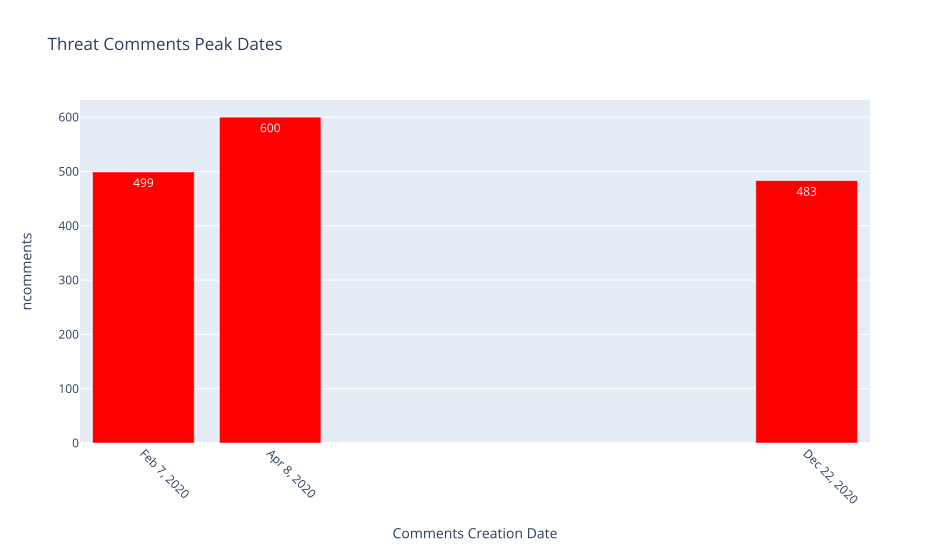

In [23]:
helpers.bar_peaks(threat_dates[['date', 'ncomments']].head(3), 
                  'Threat Comments Peak Dates')

# Most Repeated Threat Comments

In [24]:
df_threat.text.value_counts().head(60)

she should be in jail                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [25]:
df_threat.text.value_counts()[60:].head(60)

johnny depp deserves justice                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

### Text == "go to hell" --> 27

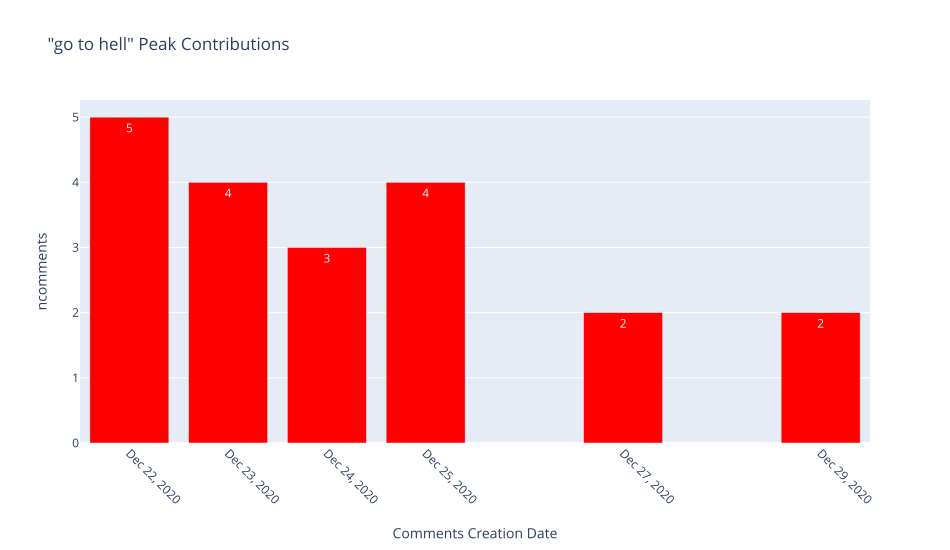

In [26]:
helpers.text_peaks(df_threat, 'go to hell', n=6, threshold=0)


Note: The same comment repeated 27 times by different users



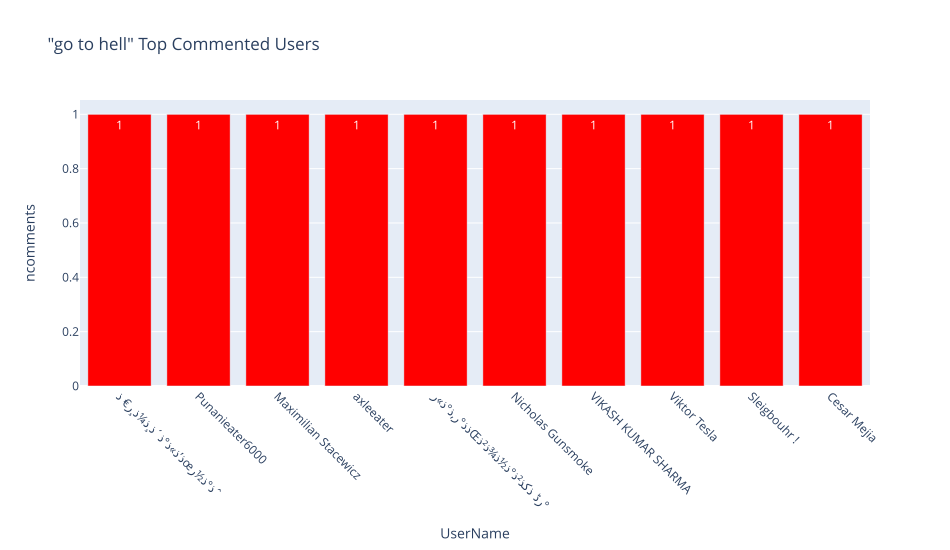

In [27]:
importlib.reload(helpers)
print('\nNote: The same comment repeated 27 times by different users\n')
helpers.users_peaks(df_threat, 'go to hell', n=10, threshold=0)

### All text containing "go to hell"

In [28]:
df_all_hell = df_threat[df_threat.text.str.contains('go to hell')]
print(f'{df_all_hell.shape[0]} contributions, on {df_all_hell.video_id.nunique()} Videos, made by {df_all_hell.username.nunique()} Users')
df_all_hell.head()


474 contributions, on 248 Videos, made by 430 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
13952,jouaan70m4c,eS-3ng3MzVlted4qG-iwcknAxfs,UgwwHInnhi42jZa74qp4AaABAg,i wanna see dat !!! i wanna see day !!gives n...,mintgumdropz1,UCqwPbHag14nV33OiZwUJJrw,1.0,2011-02-21 16:00:32+00:00,2011-02-21 16:00:32+00:00,0.0,NaN,comment,none,none,none,2011,2011-02-21,Feb,21,16
14366,ZCbTICNAwxM,P3U5YIUbPtRjcHTeOwOcqxZUUaU,UgzTxpfl932bj11xreF4AaABAg,@x14screamersis context context context 1 cor ...,shoeman26,UCGzMM0XZOfSBRhEaoEpAK0w,0.0,2011-03-08 05:05:10+00:00,2011-03-08 05:05:10+00:00,0.0,NaN,comment,none,none,none,2011,2011-03-08,Mar,8,5
12085,iGS8Vhe2kn4,n0GeDLzgNfeOWZedKmw-bchQrGU,UgyrNYQQnFQBj6STEO54AaABAg,@guitargal595 then why do they waste time with...,Justin Robles,UCSCToR7YMfBNLjnmGVRTn5w,0.0,2011-10-01 03:11:36+00:00,2011-10-01 03:11:36+00:00,0.0,NaN,comment,none,none,none,2011,2011-10-01,Oct,1,3
9524,ytIfSuy_mOA,PDk63Tm6v57jAulpPnhX8JlZntc,UgwRKqlxzLHyQIWEEVl4AaABAg,you can still do something very useful with fo...,concious caution,UCoQhes_Ug46prpzHwE4otdA,0.0,2012-10-26 07:43:14+00:00,2012-10-26 07:43:14+00:00,0.0,NaN,comment,none,none,none,2012,2012-10-26,Oct,26,7
10582,rB7ONnfIjaI,5K52zqa4lUhpwKDJsCxSKqItlrY,UgwntPyFh7gvfN5A3pN4AaABAg,fucking douchbag she is beautiful the way she ...,Rhiannon Rose Malfroid,UCiH8h2QPerstoDWsVD0-OVg,0.0,2012-11-25 04:20:32+00:00,2012-11-25 04:20:32+00:00,0.0,NaN,comment,none,none,none,2012,2012-11-25,Nov,25,4


In [29]:
df_all_hell.text.value_counts().head(60)

go to hell                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

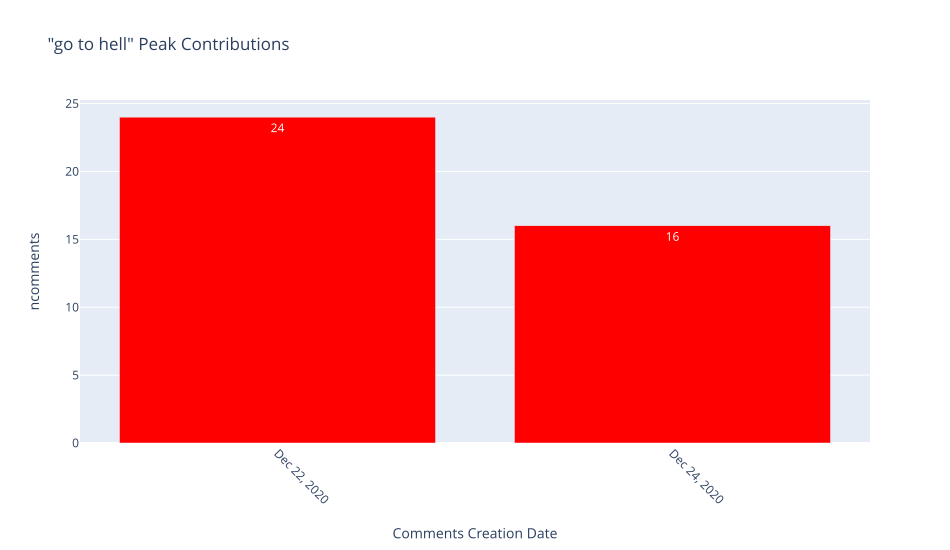

In [30]:
helpers.text_all_peaks(df_threat, 'go to hell', n=2, threshold=0)

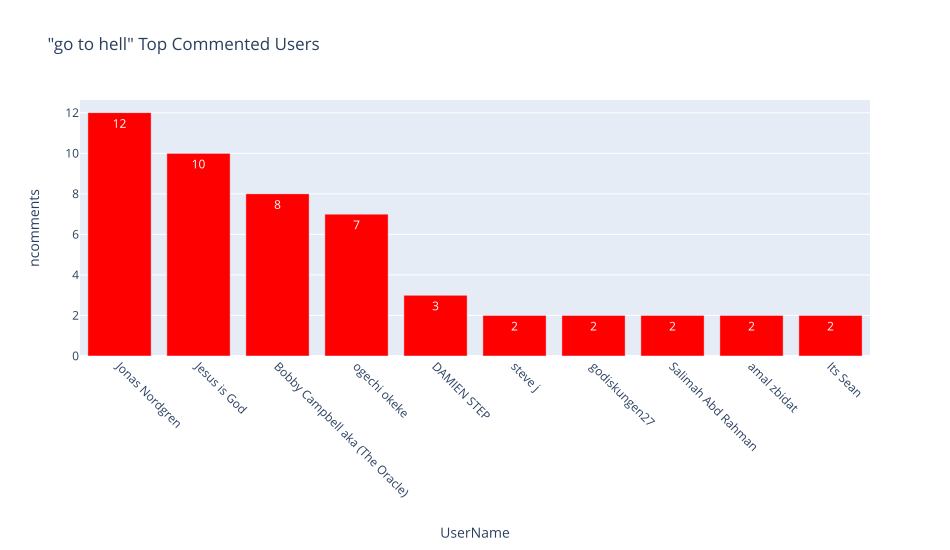

In [31]:
helpers.users_all_peaks(df_threat, 'go to hell', n=10, threshold=0)

<b>

### Text == "burn in hell" --> 19

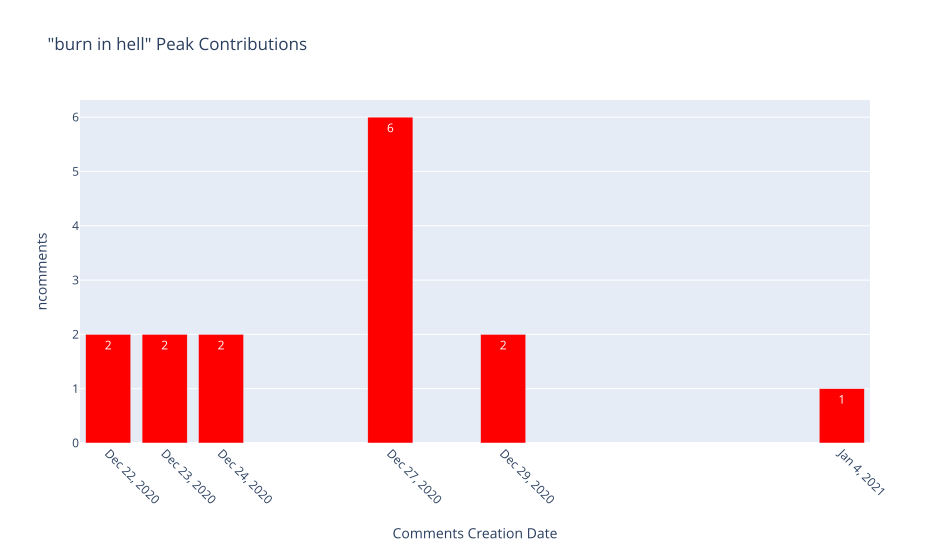

In [32]:
helpers.text_peaks(df_threat, 'burn in hell', n=6, threshold=0)


Note: The same comment repeated 19 times by different users



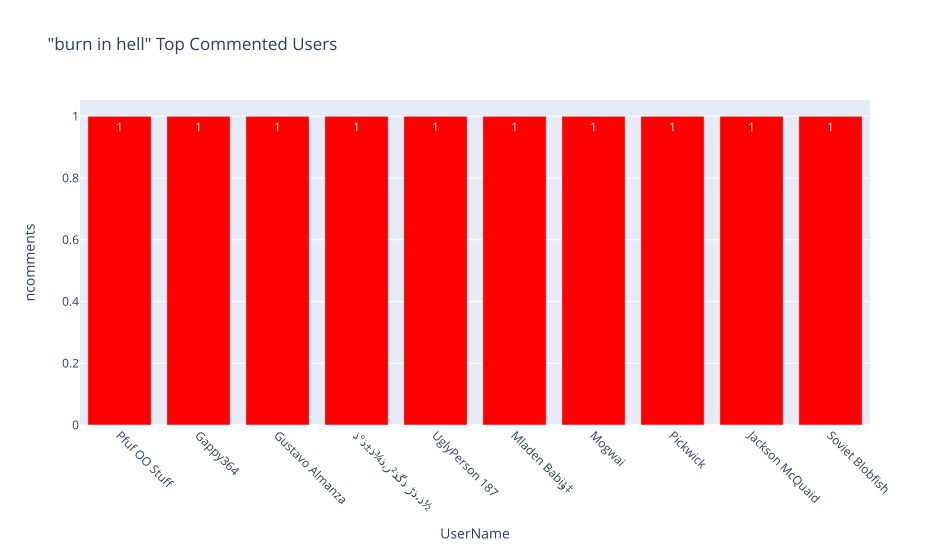

In [33]:
print('\nNote: The same comment repeated 19 times by different users\n')
helpers.users_peaks(df_threat, 'burn in hell', n=10, threshold=0)

### All text containing "burn in hell"

In [34]:
df_all_burn = df_threat[df_threat.text.str.contains('burn in hell')]
print(f'{df_all_burn.shape[0]} contributions, on {df_all_burn.video_id.nunique()} Videos, made by {df_all_burn.username.nunique()} Users')
df_all_burn.head()


274 contributions, on 128 Videos, made by 253 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
63582,rB7ONnfIjaI,4C9TwzSj-qEzEKzIj-DnaBaGOxs,UgiDWpU8RhEPjHgCoAEC,aha! burn in hell! the lazyliarbadever,Erlynie Labitad,UCKyjMVE6jxzqfOAUkb8OiMg,0.0,2015-09-27 19:37:12+00:00,2015-09-27 19:37:12+00:00,0.0,NaN,comment,none,none,none,2015,2015-09-27,Sep,27,19
1706258,9m_XLykY6fE,3nKetexyTAzH8-XBw5q4T9UY_5U,Ugh1AryGucEEKHgCoAEC.8EdJ7W4KMel8EdeFqg1eeC,the man is automatically wrong in these cases ...,Derek Shelby,UCwtk135UNctusS1GuAjhKwQ,1.0,2016-06-03 01:38:17+00:00,2016-06-03 01:38:17+00:00,0.0,NaN,reply,Ugh1AryGucEEKHgCoAEC,http://www.youtube.com/channel/UCwtk135UNctusS...,https://yt3.ggpht.com/ytc/AKedOLTjvuczilkYru5G...,2016,2016-06-03,Jun,3,1
100333,wT3RhIJZu4k,wIEWTCsgJqgOTOE6CpQ4pZo9YqI,UgjMENNv1UMx53gCoAEC,it's amazing kidos those 30k muthafukers who d...,Pintu Hunter,UCe2AgMSqMkTB1pVFQB25IfA,11.0,2016-12-06 19:33:33+00:00,2016-12-06 19:33:33+00:00,0.0,NaN,comment,none,none,none,2016,2016-12-06,Dec,6,19
100270,wT3RhIJZu4k,LwCzITmPXaTLR4ibTN3VTMIzakU,Ugjdw6Yu8tgflXgCoAEC,the 30k burn in hell you,Shakira Daniels,UCGWZsPFS84cEL3l6MppmDbg,0.0,2016-12-07 20:45:44+00:00,2016-12-07 20:45:44+00:00,0.0,NaN,comment,none,none,none,2016,2016-12-07,Dec,7,20
99277,wT3RhIJZu4k,kGwqPr8Zqw4nvonCarn30wjmV0s,UggnMuOjpQ0JcXgCoAEC,those 30k dislikes should burn in hell,Vegard ekornrأ¸d,UCORVc8PLQBcGz67hSuOLMRg,2.0,2016-12-27 02:20:33+00:00,2016-12-27 02:20:33+00:00,1.0,NaN,comment,none,none,none,2016,2016-12-27,Dec,27,2


In [35]:
df_all_burn.text.value_counts().head(60)

burn in hell                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

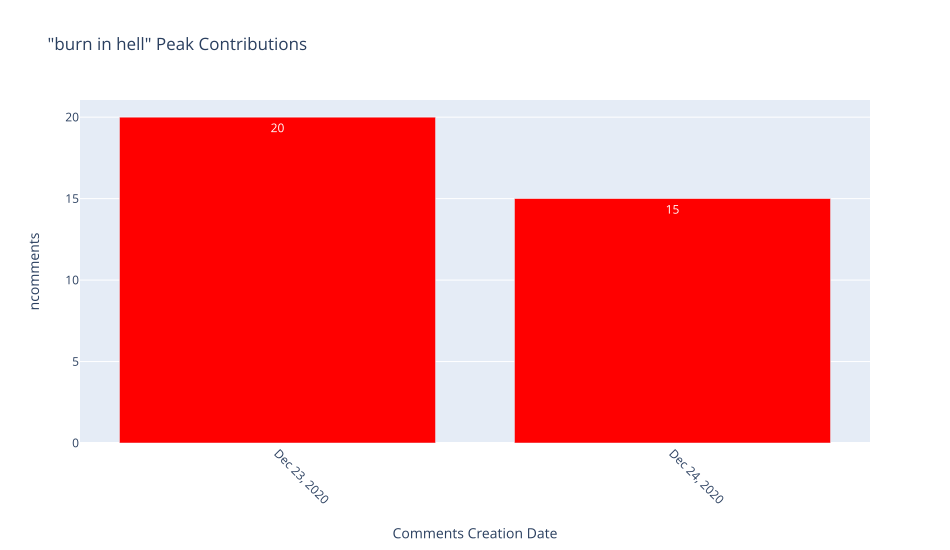

In [36]:
helpers.text_all_peaks(df_threat, 'burn in hell', n=2, threshold=0)

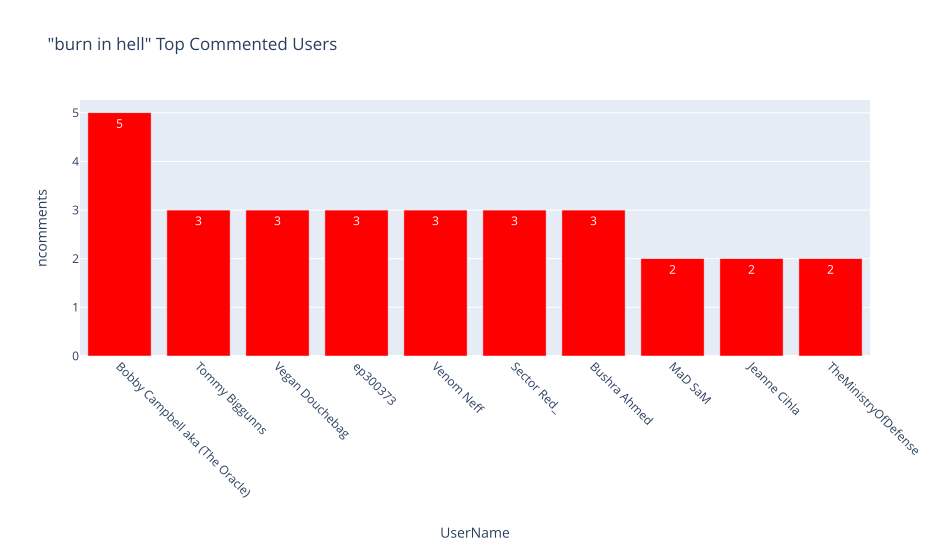

In [37]:
helpers.users_all_peaks(df_threat, 'burn in hell', n=10, threshold=0)

# Top Users Commented with Threat keywords

In [38]:
df_threat.username.value_counts().head(10)

Megan O'Shea                       117
Bobby Campbell aka (The Oracle)    106
Drage_jdeppsupporter20              98
Joni Kaltenbach                     95
Lindsey Depp                        82
Galit Weissman                      81
Rob's Rules                         78
Julie Lea                           72
Elizabeth Carter                    69
Rocio Pazos Martinez                66
Name: username, dtype: int64

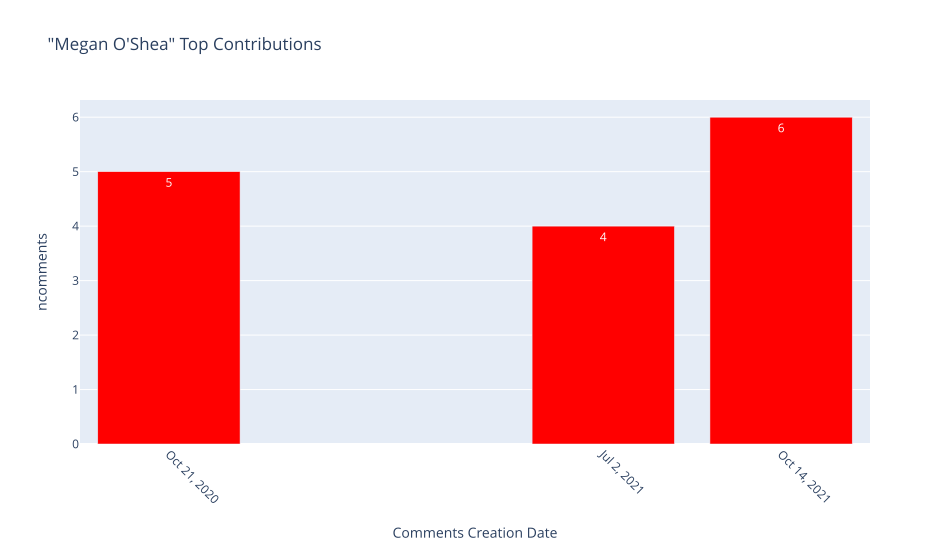

In [39]:
helpers.contr_peaks(df_comments, "Megan O'Shea", n=3, threshold=0)

In [40]:
user = "Megan O'Shea"
df_threat.query(" username == @user ").text.value_counts().head()

i really hope they get her for perjury she deserves to go to jail                                                                         3
i really hope they get ah for perjury she deserves to go to jail                                                                          2
i really hope johnnydepp gets his appeal so he can get his justice that he deserves                                                       1
i'm so glad to hear this news about ah because she deserves to go to jail for all of this johnny depp never delivered any of this ever    1
i'm so glad to hear this news about amber heard i hope she gets prison time for this she deserves it                                      1
Name: text, dtype: int64

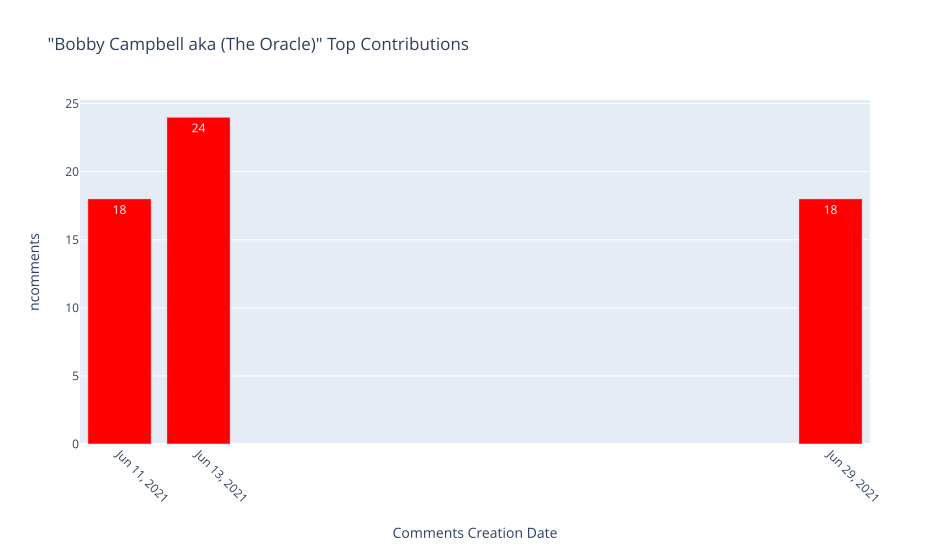

In [41]:
helpers.contr_peaks(df_comments, "Bobby Campbell aka (The Oracle)", n=3, threshold=0)

In [42]:
df_threat.query(" username == 'Bobby Campbell aka (The Oracle)' ").text.value_counts().head()

i think ah will have a very good time in jailًںکپًں“©ًں“¤                                                                                                                   1
go to hell amber heard seriously just go to hellًںک                                                                                                                         1
i think it's time for amber heard & her cell mate evan rachel wood to really call it quits & do time in jail without parole & seeing the light of day ever againًںک ًں“©    1
well she is going to get 14 years in prison if she could just the truth for onceًں¤¦چâ™‚ï¸ڈًں“©ًں“¤                                                                         1
no way in hell i'm gonna see this embarrassing tv show with that walking cancer is on thereًںک ًں“©                                                                         1
Name: text, dtype: int64

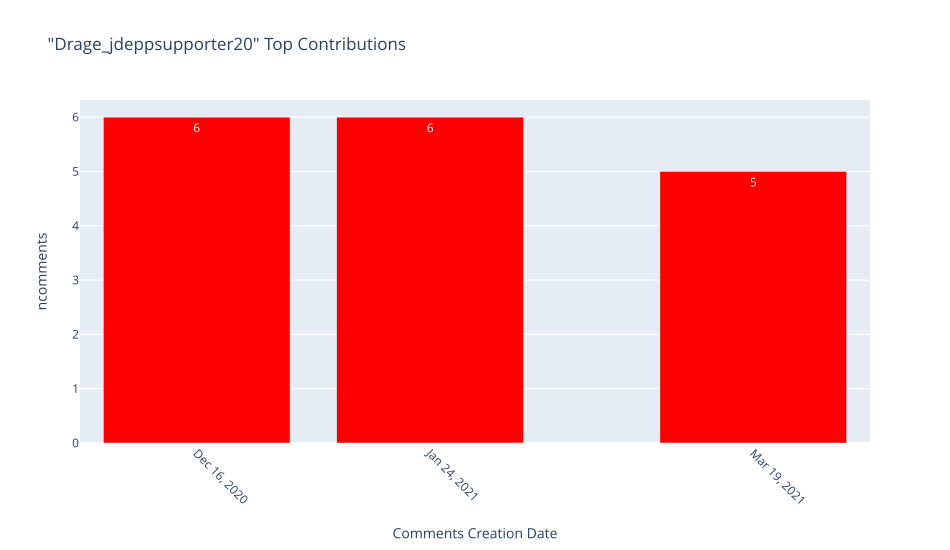

In [43]:
helpers.contr_peaks(df_comments, "Drage_jdeppsupporter20", n=3, threshold=0)

In [44]:
df_threat.query(" username == 'Drage_jdeppsupporter20' ").text.value_counts().head()

johnny never deserved this crap he deserves justice l support him tug hope your family is safeshe deserves jail                        1
she needs to come back to australia and stay in our jails l support johnny                                                             1
johnny deserves justice it needs to be overah needs jail                                                                               1
i standby and support johnny if others are smart they wont hire her at all she dosent deserve anything but johnny deserves the best    1
johnny never deserved this                                                                                                             1
Name: text, dtype: int64

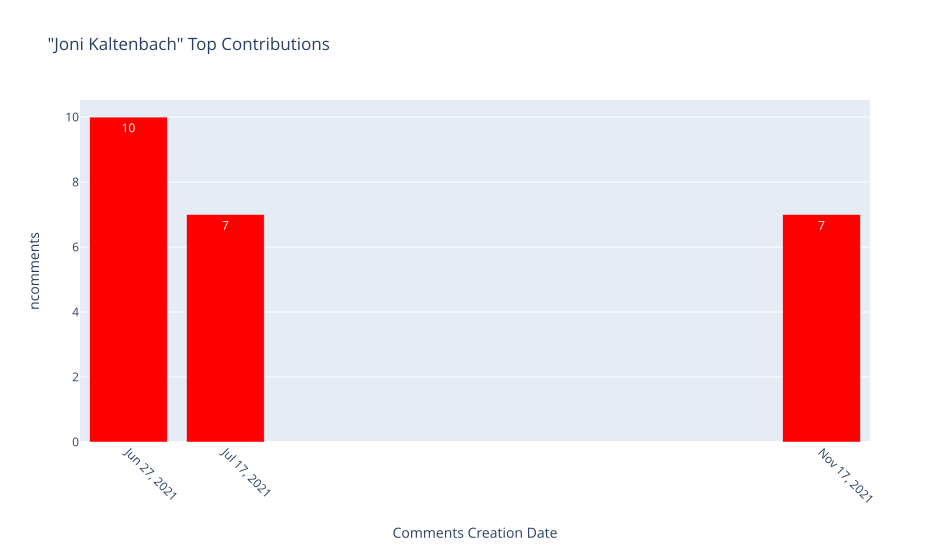

In [45]:
helpers.contr_peaks(df_comments, "Joni Kaltenbach", n=3, threshold=0)

In [46]:
df_threat.query(" username == 'Joni Kaltenbach' ").text.value_counts().head()

#justice for johnny prison for heard                                                                                                                                                                                                                                                                                                                                                       16
yeah of course she is with elon musk he's the richest man in the world here it says she is not a gold digger yeah right also it makes her sound like a high price companion also she is needing money for all this court dealings guess he is simp enough yo give it to her he should go home to his wife and new baby spend money on them they deserve it not this worthless lying hag     1
hey jon i'm pissed to sick to death of idiots like that giving praise and kissing amber's rotten ass they are just stupid and totally brainless anyway better stop cause they my delete this still it's just my opinion thanks jon for video

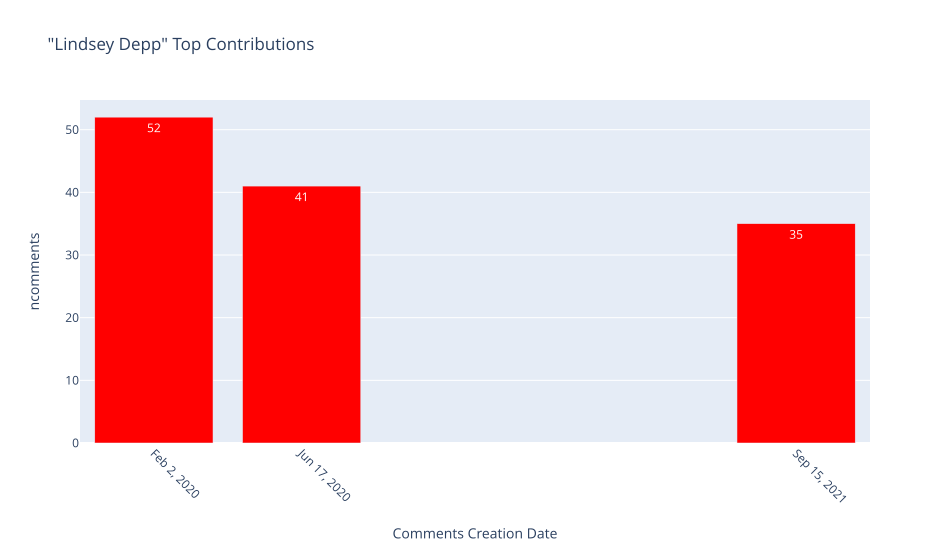

In [47]:
helpers.contr_peaks(df_comments, "Lindsey Depp", n=3, threshold=0)

In [48]:
df_threat.query(" username == 'Lindsey Depp' ").text.value_counts().head()

@snow18112000 my darling husband to be johnny depp's future wife to be rocky roxy totally agrees both ًں’© face her mentally hill father and her freeloading hoaxers all need jailing for life    1
my darling husband johnny should have had her for adultry that way he wouldn't have to had give her the settlement she didn't deserve                                                             1
tough ًں’© my darling husband to be johnny depp deserves that award and he's never done anything wrong                                                                                            1
he and his evil twisted pyschotic narcissistic abusive daughter should join her father in jail                                                                                                    1
i totally agree my gorgeous husband johnny did not deserve any of this at all and your scamber fuckin heard should be banished from hollywood                                                     1
Name: text, dtype: i

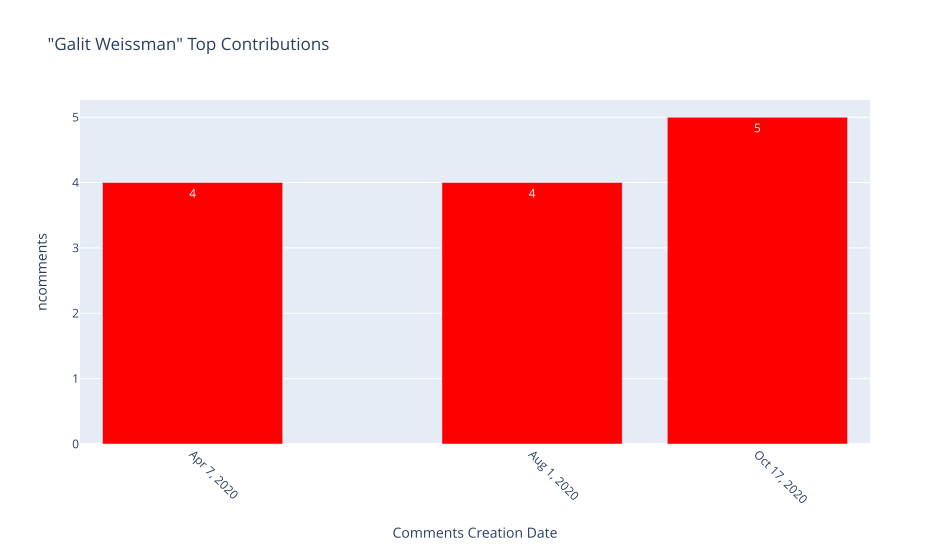

In [49]:
helpers.contr_peaks(df_comments, "Galit Weissman", n=3, threshold=0)

In [50]:
df_threat.query(" username == 'Galit Weissman' ").text.value_counts().head()

amber is a peace of trash johnny will get his justice that he deserves!!                                                                                                                                                                                            2
i hope that amber and her friends goes to jail they needs to understand consequences of what they did i feel bad for johnny that he had to go through all of this amber and her friends used johnny johnny you just keep fighting and staying up for the truth!!    1
amber is gross and selfish person she lose her lawyer she needs to be band from hollywood johnny will get his justice that he deserves!!!                                                                                                                           1
amber has sone f#$% nerve do that to kate amber needs to go jail johnny will get his justice!!                                                                                                                        

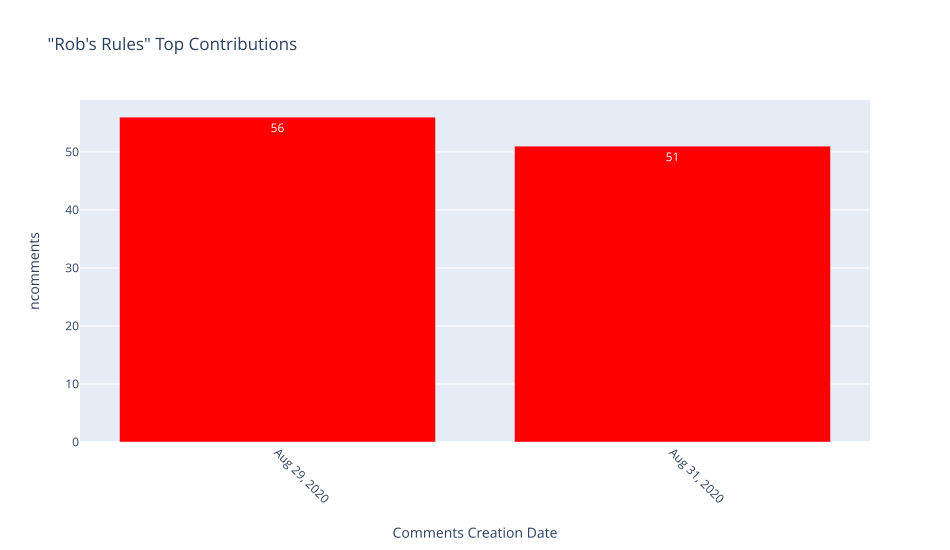

In [51]:
helpers.contr_peaks(df_comments, "Rob's Rules", n=2, threshold=0)

In [52]:
user = "Rob's Rules"
df_threat.query(" username == @user ").text.value_counts().head()

amanda negretأ¨ if i helped you in any way then that makes me feel great it is not your fault at all they were the ones with the problem they need help and i can only hope they don't hurt their next partner like they did to you you deserve better because you are important and special i am very sorry you went through a bad time but you did the right thing you are stronger than you give yourself credit for and i am happy and proud of you i myself had a similar experience so i understand be safe be well justice for johnny he deserves it and thank you ًں™ڈ so much for your support feel free to write anytime    1
he deserves it he is wrongfully accused she is the abuser                                                                                                                                                                                                                                                                                                                                       

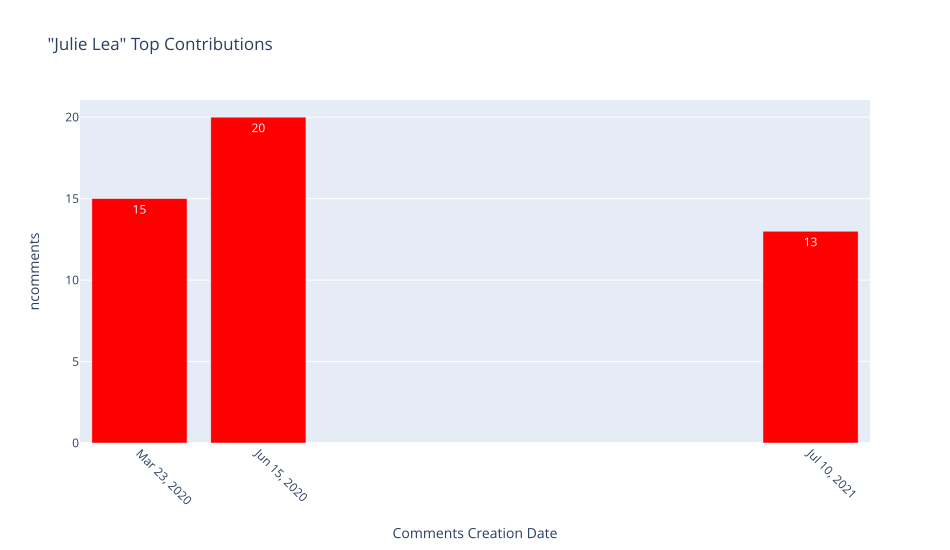

In [53]:
helpers.contr_peaks(df_comments, "Julie Lea", n=3, threshold=0)

In [54]:
df_threat.query(" username == 'Julie Lea' ").text.value_counts().head()

since ah destroyed women's credibility on a widespread basis & made a joke of 500 plus gymnasts by opening for them (jokingly) at the un abused by drnassar ( currently in jail) who incidentally was protected by usgf ( paid off a olympic gymnast $1 mill to keep quiet) the olympic's ( team dr) causing 2 suicides in the process much like ah being protected by the un aclu & l'oreal the only good that can come out of this nightmare is jd's great personal sacrifice for truth much loveâ™¥ï¸ڈâ™¥ï¸ڈًںœژًںœژ                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

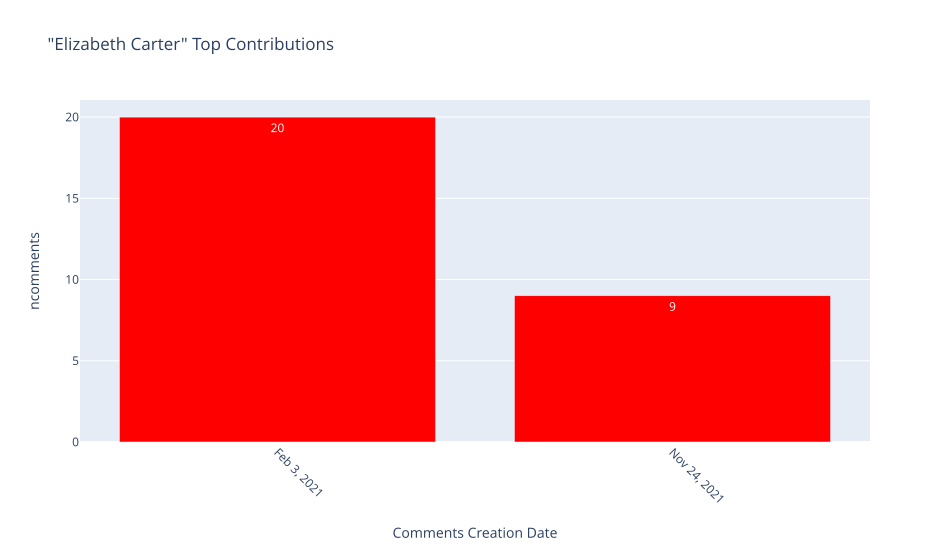

In [55]:
helpers.contr_peaks(df_comments, "Elizabeth Carter", n=2, threshold=0)

In [56]:
df_threat.query(" username == 'Elizabeth Carter' ").text.value_counts().head()

she should already be in jail ًں™‚                                                                                                                                                                                         2
put her in jail with daddy                                                                                                                                                                                                 1
aren't you thru with her yet why is she not in jail why do you let her walk around still someone will get hurt and it's on your head's we lost faith in wb and disney do we stop having faith in the justice system too    1
that's not going to keep you out of jail you are a horrible person and you need to pay for your crimes the baby can not save you so stop trying to use the baby                                                            1
she deserves jail she doesn't know how to tell the truth ًں™„ًںکڈًںک‚ًں¤£ karma ًں¤— justice for johnny depp ًں’•   

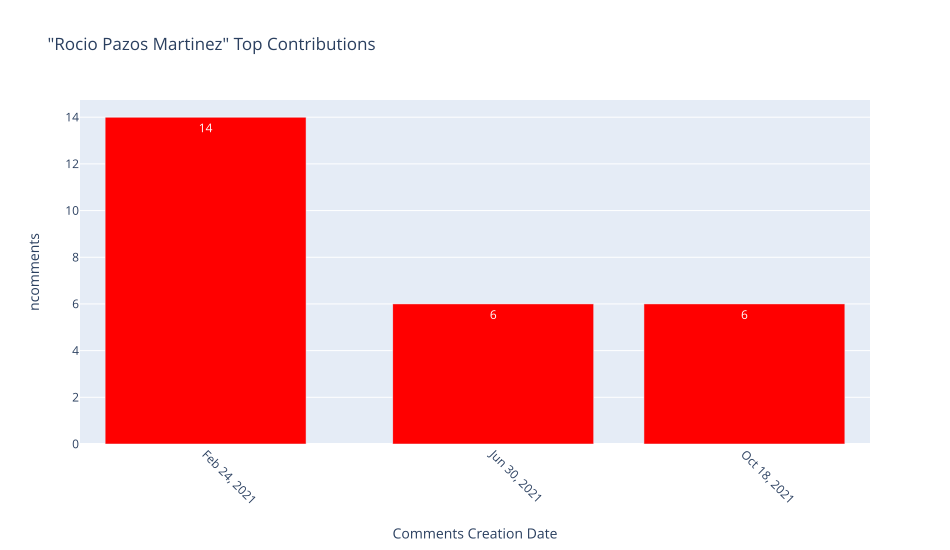

In [57]:
helpers.contr_peaks(df_comments, "Rocio Pazos Martinez", n=3, threshold=0)

In [58]:
df_threat.query(" username == 'Rocio Pazos Martinez' ").text.value_counts().head()

i want to see her where she belongs in jail                                                                                           2
ًںک‚ًںک‚ًںک‚ so happy karma is coming for her she deserves it                                                                         1
we hope not she will go to jail before they will start to record ًںکپًںکپًںکپ                                                         1
it's time she has the nightmares and no jd she deserves all the poo is coming in her way it's what she threw before ًںک‚ ًںک‚ ًںک‚    1
she needs to finish in jail for all she did and is doing                                                                              1
Name: text, dtype: int64

<br>

<a id='kill_death'></a>
>>## KYS (kill yourself)
> <ul>
 <li><a href="#all_threat">All Threat</a></li>
 <li><a href="#kill_death"><b>Kill & Death</b></a></li>
 <li><a href="#hell_burn">Hell & Burn</a></li>
 <li><a href="#threat_users">Threat Users Contributions</a></li>
 </ul>

In [59]:
threat_list = ['terrible person she should just kill her self', 'kys fuck you amber']
df_kys = df_comments[df_comments.text.str.contains('|'.join(threat_list))]
df_kys.text.value_counts().head()

@bella mel no he yelled kys fuck you amber       1
terrible person she should just kill her self    1
Name: text, dtype: int64

In [60]:
df_kys[['username', 'date']]

,username,date
553915,"Aiko M,",2020-07-17
1794259,x,2020-08-15


In [61]:
df_kys

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
553915,5vRd21X3K-k,MsNpD3ArqSqaUcgrZ2oidomagVc,Ugwq0EEuyIAHBkU8O2l4AaABAg,terrible person she should just kill her self,"Aiko M,",UCuZZ3du0v6u0Ltm3Qv9v3DQ,0.0,2020-07-17 18:13:24+00:00,2020-07-17 18:13:24+00:00,0.0,NaN,comment,none,none,none,2020,2020-07-17,Jul,17,18
1794259,HXSgBFYg1lc,mfApez1_x1uQ5QMkYLcNE2yizRU,UgxsXoRbmE_5tIWm1W14AaABAg.9BSdDos-Z8T9CNUDigVTd4,@bella mel no he yelled kys fuck you amber,x,UCnG-_6XnytOnIRn7C-OoyxQ,0.0,2020-08-15 10:01:14+00:00,2020-08-15 10:01:14+00:00,0.0,NaN,reply,UgxsXoRbmE_5tIWm1W14AaABAg,http://www.youtube.com/channel/UCnG-_6XnytOnIR...,https://yt3.ggpht.com/ytc/AKedOLTjRjvBUIFd5kyM...,2020,2020-08-15,Aug,15,10


In [62]:
threat_users = threat_users | set(df_kys.username)

# Kill Heard

In [63]:
df_comments[df_comments.text.str.contains('kill heard')].text.value_counts().head()

did you notice his hand when he is holding his ًں”ھ if jason mamoa is really hurt his wife is going to kill heardًں¦‰                                                     1
kill heard off in aquaman her death would certainly be a popular gif on twitter                                                                                           1
i dont want emilia to replace ambers character(i dont like when actors change) they could just somehow kill heards character so emilia clarke could be a new character    1
the best thing would be to kill heard's mera character in the most humiliating way possible in the film zucker bros style                                                 1
Name: text, dtype: int64

In [64]:
df_comments[df_comments.text.str.contains('kill heard')][['text', 'username', 'date']]

,text,username,date
576667,the best thing would be to kill heard's mera c...,NeDeS,2020-04-01
464769,kill heard off in aquaman her death would cert...,mk Hernandez,2020-11-07
1169645,i dont want emilia to replace ambers character...,Lauris,2021-02-07
1511579,did you notice his hand when he is holding his...,Owlseyes Sees,2021-10-08


In [65]:
df_comments[df_comments.text.str.contains('kill heard')]

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
576667,TJK8q0N5kA4,eAKTy11OF_J4FexjuCHwDotoDpo,UgzRJvSIQ-LvEBoQtWl4AaABAg,the best thing would be to kill heard's mera c...,NeDeS,UCT7fF_8k7MbQLOlVI8bhfPw,4.0,2020-04-01 01:31:20+00:00,2020-04-01 01:31:20+00:00,1.0,NaN,comment,none,none,none,2020,2020-04-01,Apr,1,1
464769,m-FpnDJgJjk,2tP6rNruAiygA2RMOU2u6WqAYHg,UgzhdaZAPF1dyE-XGYF4AaABAg,kill heard off in aquaman her death would cert...,mk Hernandez,UCnOXRXFsMKMGEPebTzhIYgQ,0.0,2020-11-07 18:56:49+00:00,2020-11-07 18:56:49+00:00,0.0,NaN,comment,none,none,none,2020,2020-11-07,Nov,7,18
1169645,1GphbMhDbeo,g60tXyD5Ees9zfysPNhymTKrVMY,Ugwyrd5eGUomOo9t-uJ4AaABAg,i dont want emilia to replace ambers character...,Lauris,UCNVbX165l5CMcOWrMfdzywA,1.0,2021-02-07 21:49:10+00:00,2021-02-07 21:49:57+00:00,0.0,NaN,comment,none,none,none,2021,2021-02-07,Feb,7,21
1511579,Apn1xu_3Nl0,qAEh85s71Bka5meIHlyz0rURAvI,Ugw0lpCc2uSJiH3fpjR4AaABAg,did you notice his hand when he is holding his...,Owlseyes Sees,UCXgRDyHhBPWFxWBEnVNUdZg,1.0,2021-10-08 18:45:51+00:00,2021-10-08 18:45:51+00:00,0.0,NaN,comment,none,none,none,2021,2021-10-08,Oct,8,18


In [66]:
threat_users = threat_users | set(df_comments[df_comments.text.str.contains('kill heard')].username)

# Kill Amber

In [67]:
df_kill_amber = df_comments[df_comments.text.str.contains('kill amber')]
df_kill_amber.text.value_counts().head(60)

wonder woman should kill amber heard's mera #justiceforjohnnydepp                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [68]:
df_kill_amber.username.value_counts().head(15)

Vladimir Manosalvas IG: TheVladMan    2
Heavy Rain                            2
×”×™×œ×” ×‘×ں ×©×™×‍×•×œ              1
Giga Ton                              1
Annabelle W                           1
Sabela Salud Legados                  1
Mahlki                                1
The Blox Conductor                    1
YED                                   1
Poki Wong                             1
JoAnn Carter                          1
Marcelo Silveira                      1
Kimberly Haines                       1
Rizza Alexa Dequito                   1
Illumi Kitty                          1
Name: username, dtype: int64

In [69]:
# df_kill_amber[['text', 'username', 'date']]

In [70]:
print(df_kill_amber.shape)
df_kill_amber

(53, 20)


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
396264,kdWsqv7mVj0,oj0pu24pExEM-F2tr7D3ljQe860,UgwspSpAWLaRzFr6kZl4AaABAg,so tmz is still trying to kill amber these mor...,Sas Fee,UCv8-1ar4WyAiXOMAnzZZy9Q,1.0,2019-01-24 16:08:16+00:00,2019-01-24 16:08:16+00:00,3.0,NaN,comment,none,none,none,2019,2019-01-24,Jan,24,16
1769777,RK_rqMKSyz4,bXR2LMnCywgViVOpzAlFrfrUxlU,UgzMKy4_yEQyrdDHoZV4AaABAg.8s5amo2B6bk8s5vXEK0SBR,no about johnny depp who tried to kill amber w...,Think Twice,UCbvorLMjVPORMIEFUQiUnUw,0.0,2019-03-05 15:22:57+00:00,2019-03-05 15:22:57+00:00,0.0,NaN,reply,UgzMKy4_yEQyrdDHoZV4AaABAg,http://www.youtube.com/channel/UCbvorLMjVPORMI...,https://yt3.ggpht.com/ytc/AKedOLSHNaCypmWi72iy...,2019,2019-03-05,Mar,5,15
1769775,RK_rqMKSyz4,D45ERVjCZ5Qn-x1LxBCg8_zgLDs,UgzMKy4_yEQyrdDHoZV4AaABAg.8s5amo2B6bk8s6v1O-Fb5b,miss s depp tried to kill amber with a pillow ...,Live Fast,UCvrwLx3pGWAUIx_ocAPUWKg,0.0,2019-03-06 00:37:51+00:00,2019-03-06 00:37:51+00:00,0.0,NaN,reply,UgzMKy4_yEQyrdDHoZV4AaABAg,http://www.youtube.com/channel/UCvrwLx3pGWAUIx...,https://yt3.ggpht.com/ytc/AKedOLTAgMmoGn4QWxu0...,2019,2019-03-06,Mar,6,0
1769843,RK_rqMKSyz4,BBNjFssBBYhcadFISAYLFlj9YoQ,Ugy_BdKWudaAZXki6jh4AaABAg.8s4TBqisUAJ8s8CvFh4I1z,think twice yup youre right he tried to kill a...,Red Roses,UCm2sRh40MUNGKKrUUbkeHDA,1.0,2019-03-06 12:42:08+00:00,2019-03-06 12:42:08+00:00,0.0,NaN,reply,Ugy_BdKWudaAZXki6jh4AaABAg,http://www.youtube.com/channel/UCm2sRh40MUNGKK...,https://yt3.ggpht.com/ytc/AKedOLRgfg-4IY_DuvX6...,2019,2019-03-06,Mar,6,12
324920,RK_rqMKSyz4,iRvp29B0gFH1LwC5s75P9j21DAE,UgztZWcVgtczjaTVejZ4AaABAg,very good finally we go to court depp must be ...,Blitzkrieg Bob,UCh6c_A4LURAJWGPMMoc5vaw,0.0,2019-03-06 12:50:27+00:00,2019-03-06 12:50:27+00:00,0.0,NaN,comment,none,none,none,2019,2019-03-06,Mar,6,12
1791258,hHWS-c0jHOo,ABqoUth_I1Qtjy4RdEUfOHy5Dtc,Ugwx7f_uKMCMoB2hUhl4AaABAg.8sSriNNccoH8sXq6On896k,depp tried to kill amber with a pillow depp mu...,Ras Tafari,UCFnx0H26AAF_9rFBU1KQRTQ,0.0,2019-03-16 11:34:20+00:00,2019-03-16 11:34:20+00:00,0.0,NaN,reply,Ugwx7f_uKMCMoB2hUhl4AaABAg,http://www.youtube.com/channel/UCFnx0H26AAF_9r...,https://yt3.ggpht.com/ytc/AKedOLRqimo9gYqSJfm9...,2019,2019-03-16,Mar,16,11
1775059,UMQM4UFnDSw,mwwMk5o4SCMolIt8hroQN87jzH0,Ugzt53B0QEuztQ9e4tV4AaABAg.8sPokoIq33G8srT7LYmbSF,thats why it took 91 women to come forward to ...,Quiet Please,UCRsL_TcaDxjQ_9bmNZ-ecyw,1.0,2019-03-24 11:48:48+00:00,2019-03-24 11:48:48+00:00,0.0,NaN,reply,Ugzt53B0QEuztQ9e4tV4AaABAg,http://www.youtube.com/channel/UCRsL_TcaDxjQ_9...,https://yt3.ggpht.com/ytc/AKedOLRC0AHGgIFQo09M...,2019,2019-03-24,Mar,24,11
1775008,UMQM4UFnDSw,5j1nRgh-8fpcHcb1IWmj87iQO40,Ugy5X4JmhAIOZU72zG54AaABAg.8sRO-I18SO08ssdTl1SEOP,and i accuse depp of several things the worst ...,Heavy Rain,UCduhHK0fuJ392o8BHqCaeYQ,0.0,2019-03-24 22:47:13+00:00,2019-03-24 22:47:13+00:00,0.0,NaN,reply,Ugy5X4JmhAIOZU72zG54AaABAg,http://www.youtube.com/channel/UCduhHK0fuJ392o...,https://yt3.ggpht.com/ytc/AKedOLSo0dCCpiYh5-0L...,2019,2019-03-24,Mar,24,22
1774998,UMQM4UFnDSw,PJYZxcbWqF5yyZLuCAA0KWgLDRQ,UgwVZHajc55Ec1Q6oFJ4AaABAg.8sVdqemqXF48ssf9SXbau_,then depp is a wife beater of the worst kind w...,Heavy Rain,UCduhHK0fuJ392o8BHqCaeYQ,0.0,2019-03-24 23:01:55+00:00,2019-03-24 23:01:55+00:00,0.0,NaN,reply,UgwVZHajc55Ec1Q6oFJ4AaABAg,http://www.youtube.com/channel/UCduhHK0fuJ392o...,https://yt3.ggpht.com/ytc/AKedOLSo0dCCpiYh5-0L...,2019,2019-03-24,Mar,24,23
1766944,SPQfyxpywps,rClFrqfHKbPhIQ4_OH4aEM1pkp0,UgysrmoCHNKDzkCMe7l4AaABAg.8t-_0-nI65T8t6xz5TvKuZ,thelittlethings she grabbed the arm of her the...,Hate the ruling class,UCif5nVlZv5prkJo0Qfm1qBA,0.0,2019-03-30 21:35:00+00:00,2019-03-30 21:35:00+00:00,0.0,NaN,reply,UgysrmoCHNKDzkCMe7l4AaABAg,http://www.youtube.com/channel/UCif5nVlZv5prkJ...,https://yt3.ggpht.com/ytc/AKedOLS8BPe5gr5HgkRq...,2019,2019-03-3

In [71]:
threat_users = threat_users | set(df_kill_amber.username)

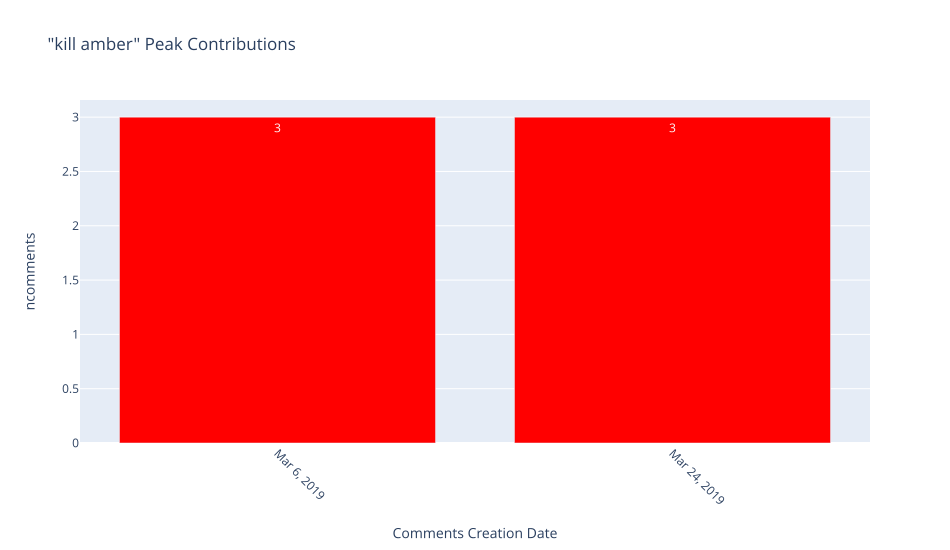

In [72]:
helpers.text_all_peaks(df_kill_amber, 'kill amber', n=2, threshold=0)

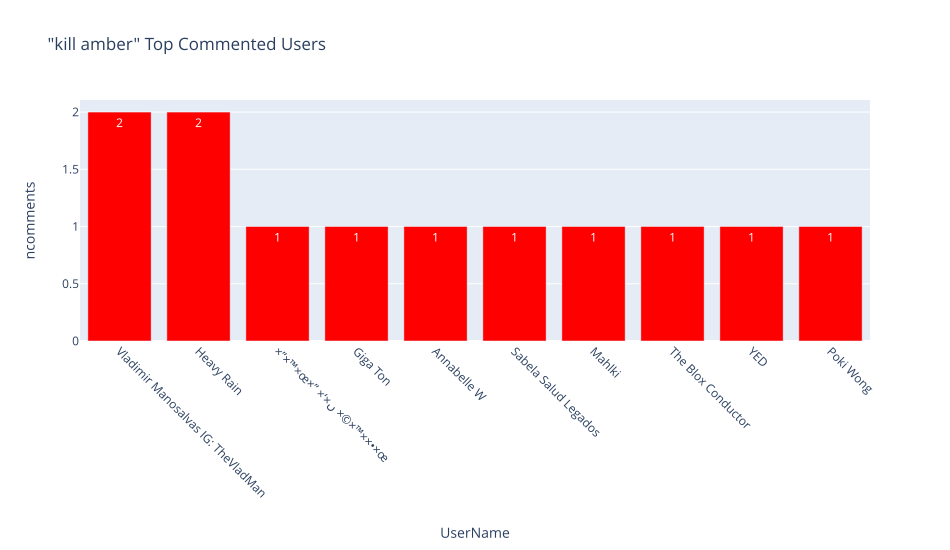

In [73]:
helpers.users_all_peaks(df_kill_amber, 'kill amber', n=10, threshold=0)

# Kill Her

In [74]:
df_kill_her = df_comments[df_comments.text.str.contains('kill her')]
df_kill_her.text.value_counts().head(60)

one lie how totally change his life mental torturephysical violencecost lot of moneyloose prestige that earned from years struggleloose his best movie jacks sparrownearly loose finger etc if someone kill her still it is not provide real justice to him #boycuttamber #justiceforjohnnydeep                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [75]:
df_kill_her.username.value_counts().head(15)

dbreiden83080                          5
Flor Delgado                           4
Monique H                              4
prakash acharya                        4
Charissa                               3
Ernest Gonzalez                        3
The Beast                              3
serrrty cual                           2
Tim Marshall                           2
Sarah Roberts                          2
KB                                     2
Families Supporting Trauma Recovery    2
Sarah Wells                            2
Kevin Beach                            2
Julie Lea                              2
Name: username, dtype: int64

In [76]:
# df_kill_her[['text', 'username', 'date']]

In [77]:
print(df_kill_her.shape)
df_kill_her

(586, 20)


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
8922,MZGyGk0xBlw,lXysbyqsWkPvD2cZMmYOM6QR9I8,Ugx95lHEBtqcoVjzXNx4AaABAg,that bitch didn't really try to kill herself s...,FkYouAndYourOpinion,UCdcnEJ6IXmpoauEnJ3xCoPg,0.0,2012-07-23 02:12:02+00:00,2012-07-23 02:12:02+00:00,0.0,NaN,comment,none,none,none,2012,2012-07-23,Jul,23,2
3526,ytIfSuy_mOA,ZjzDgL8Uts3pY_6HY6qIvZWjojU,Ugym3ukIftWP94raIgp4AaABAg,why is she screaming ? :)) it's like someone t...,crisacrisa93,UC6Y7gbqZXARYb99GPEMSSeg,0.0,2013-08-07 10:57:23+00:00,2013-08-07 10:57:23+00:00,0.0,NaN,comment,none,none,none,2013,2013-08-07,Aug,7,10
75973,wT3RhIJZu4k,WaUD8PDCXLOf2ahAybYJAWXiaYE,UgiXtEK7Kj0H-3gCoAEC,this song made me feel like i was not alone my...,Shae Lacktin,UCoC4cz8Q4z2Bl5UTcZmCzFA,0.0,2015-01-27 04:28:55+00:00,2015-01-27 04:28:55+00:00,0.0,NaN,comment,none,none,none,2015,2015-01-27,Jan,27,4
1698781,bixGpiXuYOM,TgBGekbUuEbjKRJUawjCYudiEzY,UghSbCbXefF7KHgCoAEC.7zILWe3W0Uo7-MK7gJq6Wm,so if i kill her i cured cancer?,Sangram Bhalerao,UCS4f6t0WM2ToPpVAfAK8bNw,0.0,2015-04-25 18:47:27+00:00,2015-04-25 18:47:27+00:00,0.0,NaN,reply,UghSbCbXefF7KHgCoAEC,http://www.youtube.com/channel/UCS4f6t0WM2ToPp...,https://yt3.ggpht.com/ytc/AKedOLQTAeM6C5-lefbX...,2015,2015-04-25,Apr,25,18
55176,VPUUrdgxIa8,EZVtCUND1obg7OJT9Cl0wkohgZc,Ugi1TBYWP9AVPHgCoAEC,conor mcgregor would kill her,Conor McGoat,UCk2VpL06MYPzo7DyI3LqO3w,0.0,2015-08-29 19:21:28+00:00,2015-08-29 19:21:28+00:00,0.0,NaN,comment,none,none,none,2015,2015-08-29,Aug,29,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2096001,v81TKZ3V4S8,PHaGapIwlUIn5RK0-pZNQJ-95Ns,UgwqnBUrdoj_Ex41PyN4AaABAg.9U0bX-MTToQ9USnx6z9h6k,typical psycho behavior surprised she did not ...,lina nicolia,UCLjMuTMCZ1WRVwH-oMXW0qQ,1.0,2021-11-07 21:03:37+00:00,2021-11-07 21:03:37+00:00,0.0,NaN,reply,UgwqnBUrdoj_Ex41PyN4AaABAg,http://www.youtube.com/channel/UCLjMuTMCZ1WRVw...,https://yt3.ggpht.com/ytc/AKedOLRogMzuyF_H_8Ny...,2021,2021-11-07,Nov,7,21
2095974,v81TKZ3V4S8,l0xLgaPozu0w-SS8mmbPDik6iZ4,UgzSQaSoGL04oAi4bIF4AaABAg.9U0cL0Az9_79USp1nRli4J,playing the guilt card has many reasons and no...,lina nicolia,UCLjMuTMCZ1WRVwH-oMXW0qQ,0.0,2021-11-07 21:13:08+00:00,2021-11-07 21:13:08+00:00,0.0,NaN,reply,UgzSQaSoGL04oAi4bIF4AaABAg,http://www.youtube.com/channel/UCLjMuTMCZ1WRVw...,https://yt3.ggpht.com/ytc/AKedOLRogMzuyF_H_8Ny...,2021,2021-11-07,Nov,7,21
2097338,6b_t8Qps13o,adJtRIaQMAQSp6C8DHL5mPac5ig,UgxvM6uFR4ypBcH31JB4AaABAg.9UwRAnugcCp9V0WHAH5dGr,​ @dbreiden83080 first offshow me where that i...,ar47yrr4p,UCHayzSOIoz-Ik7HLQK79bZg,0.0,2021-11-21 17:53:08+00:00,2021-11-21 17:53:08+00:00,0.0,NaN,reply,UgxvM6uFR4ypBcH31JB4AaABAg,http://www.youtube.com/channel/UCHayzSOIoz-Ik7...,https://yt3.ggpht.com/ytc/AKedOLQ7tYRH0MdJMIcR...,2021,2021-11-21,Nov,21,17
1558126,6gK8_FVOhkw,hXOfy22jyTv9MdvpAmU2smh4how,UgwRVYCbwufyhSny_Jl4AaABAg,i don't think they will kill her off but i cou...,Lauren Rhoads,UCGxfloEi_xoFFpv88FcJtaA,2.0,2021-11-27 19:06:13+00:00,2021-11-27 19:06:13+00:00,0.0,NaN,comment,none,none,none,2021,2021-11-27,Nov,27,19


In [78]:
threat_users = threat_users | set(df_kill_her.username)

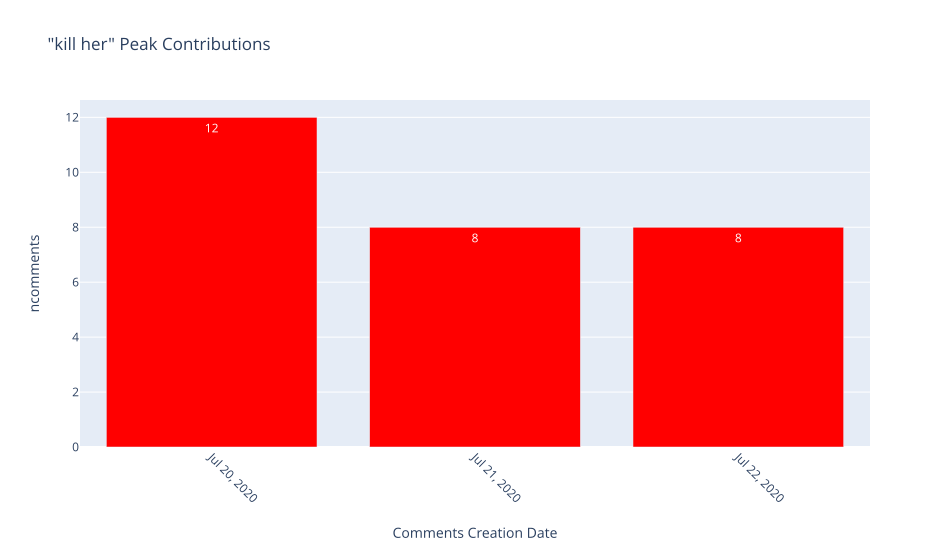

In [79]:
helpers.text_all_peaks(df_kill_her, 'kill her', n=3, threshold=0)

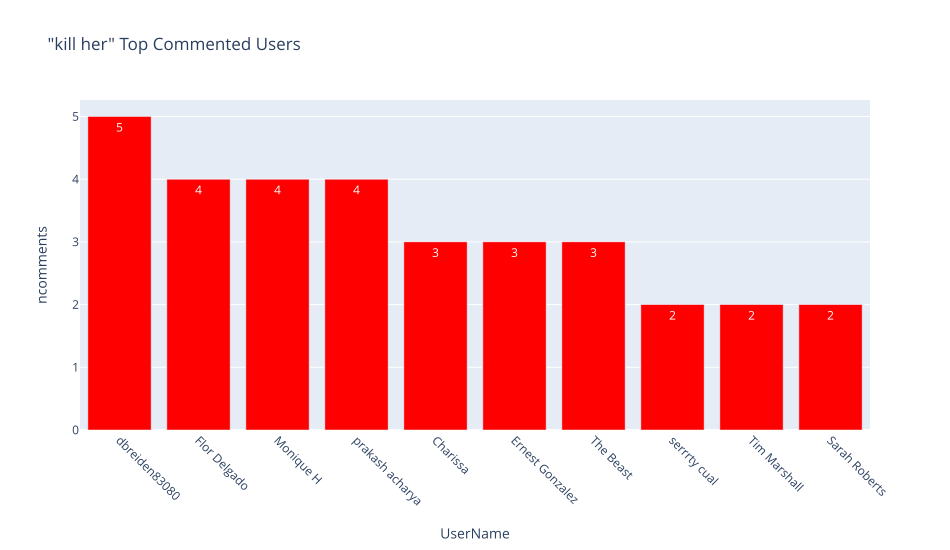

In [80]:
helpers.users_all_peaks(df_kill_her, 'kill her', n=10, threshold=0)

## NOTE: "These areas are extracted from the text to help in extracting the keywords to be used in the analysis"

- Deathto
- #deathtoamber
- has anyone seen that black mirror episode where there are the robot bees and the ##deathto yeah well i would gladly say #deathto amber heard even if it means i would die the same way   
- death to fascists (amber heard included)
- death to mera!!!
- death to all narcissistic psychopaths she is a real psycho just take a look at her empty sight god bless johnny depp
- yes! social death to anybody not supporting johnny
- professional death to a turd
- death to femnazis
- i know im not the only that wishes death to those people on those amber alerts man f that baby! stop sending me messages!

In [81]:
threat_list = ['deathto', "death to fascists", "death to mera", "death to all narcissistic", "social death to", 
               "professional death", "death to femnazis", "death to those people"]
df_deathto = df_comments[df_comments.text.str.contains('|'.join(threat_list))]
df_deathto.text.value_counts().head(60)

#deathto                                                                                                                                                                                 1
death to mera!!!                                                                                                                                                                         1
she earned every terrible thing that happens to her yes a bit of justice justice for johnny! professional death to a turd                                                                1
yes! social death to anybody not supporting johnny                                                                                                                                       1
death to all narcissistic psychopaths she is a real psycho just take a look at her empty sight god bless johnny depp                                                                     1
death to femnazis                                                

In [82]:
df_deathto[['username', 'date']]

,username,date
374947,I type the truth no BS here,2019-10-03
782031,Weak Supremacy,2020-07-09
641864,satchsatch33,2020-07-18
1030463,Mark Jones,2020-08-07
973166,Alexander Kastrun,2020-11-09
802118,Nicole Besser,2020-12-04
742756,R Cross Racing,2020-12-23
451795,lumpyporridge,2020-12-29
1118628,Annurissimo 10,2021-06-01
1540990,Vicki Grier,2021-08-19


In [83]:
df_deathto

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
374947,Q_Ek1nWndTg,U0clMrht7i14hqWi2yRcLnHf8Hg,UgzLWVCwxYBSdEd2yuF4AaABAg,i know im not the only that wishes death to th...,I type the truth no BS here,UCOhcXozj22K12KggXsL1dQA,1.0,2019-10-03 16:16:18+00:00,2019-10-03 16:16:18+00:00,0.0,NaN,comment,none,none,none,2019,2019-10-03,Oct,3,16
782031,c7jyPPWTYZc,5J7y7b-eHEvEDMCd6YeYR8n1eE4,Ugw4wgdgumTajB5S2y14AaABAg,death to femnazis,Weak Supremacy,UC40FAN_ZJ7O1NWGi20_sjaA,0.0,2020-07-09 01:04:19+00:00,2020-07-09 01:04:19+00:00,0.0,NaN,comment,none,none,none,2020,2020-07-09,Jul,9,1
641864,4o4HDfaNNnM,5f_yXM-8XvuDX7fBVU2weUckAvc,Ugzgb59Wh7sa4p6BTLR4AaABAg,death to all narcissistic psychopaths she is a...,satchsatch33,UCjpZrhzC0Ww0ZZez0ASiVWw,0.0,2020-07-18 21:58:37+00:00,2020-07-18 21:58:37+00:00,0.0,NaN,comment,none,none,none,2020,2020-07-18,Jul,18,21
1030463,Q_Ek1nWndTg,avzOGSRkOI5w-oWrALrDxCjmaLs,Ugwf1_kLeBBBYzWTJQN4AaABAg,#deathtopedos,Mark Jones,UCTNJD8wFpApEjSadqWSvmEw,0.0,2020-08-07 12:04:07+00:00,2020-08-07 12:04:07+00:00,0.0,NaN,comment,none,none,none,2020,2020-08-07,Aug,7,12
973166,OFO6sMJGjHc,2iEMw2XSjNsSJw1wDJ9WI3EXWXk,UgzA-ndo7_pU8dXe8VZ4AaABAg,#deathtoamber,Alexander Kastrun,UCGMBqNfEzMTgoZWyzYVV9kA,0.0,2020-11-09 08:46:52+00:00,2020-11-09 08:46:52+00:00,0.0,NaN,comment,none,none,none,2020,2020-11-09,Nov,9,8
802118,T8V3M8Y-1gA,Eql8FO4ofl3iG7dnWr-sgo0MOeU,UgwqHyjveDphALnNI4l4AaABAg,yes! social death to anybody not supporting jo...,Nicole Besser,UCWhKRppEpEXOtBITlrXvjDQ,0.0,2020-12-04 21:35:24+00:00,2020-12-04 21:35:24+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-04,Dec,4,21
742756,uretrfMA-Io,9ZIa7Da2A9Vq3V_Sct56Sxzcm5o,UgzW68tHQqyAkZwkr914AaABAg,#deathto,R Cross Racing,UCwqr0vUQxZCqbEgwRXKpuZg,0.0,2020-12-23 05:00:22+00:00,2020-12-23 05:00:22+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-23,Dec,23,5
451795,4r8UJv97GjM,sqGFh_B1ibAUM2t8oQ-MyHplHwY,UgyDr8m_grRKo22Ofzp4AaABAg,has anyone seen that black mirror episode wher...,lumpyporridge,UCJpKwlz6BrecSGCqa9UV4rQ,1.0,2020-12-29 02:00:14+00:00,2020-12-29 02:00:14+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-29,Dec,29,2
1118628,2XtaTEAt9N4,oB01__fxFhfZZaGqatPdTD-zA0Y,Ugw_xqaQCS4fdqlNcRd4AaABAg,death to fascists (amber heard included),Annurissimo 10,UCYIzzSsDREMyOAiqRpg-fBw,1.0,2021-06-01 13:32:37+00:00,2021-06-01 13:32:37+00:00,0.0,NaN,comment,none,none,none,2021,2021-06-01,Jun,1,13
1540990,w3r24srMoeM,a7Dwu1j063CSTTEAMN7NRsWs-eg,UgxibCfzLiC1pAzICoJ4AaABAg,she earned every terrible thing that happens t...,Vicki Grier,UCKUPAhK89GOuAgvbfDHg3ww,0.0,2021-08-19 12:59:54+00:00,2021-08-19 12:59:54+00:00,0.0,NaN,comment,none,none,none,2021,2021-08-19,Aug,19,12


In [84]:
threat_users = threat_users | set(df_deathto.username)

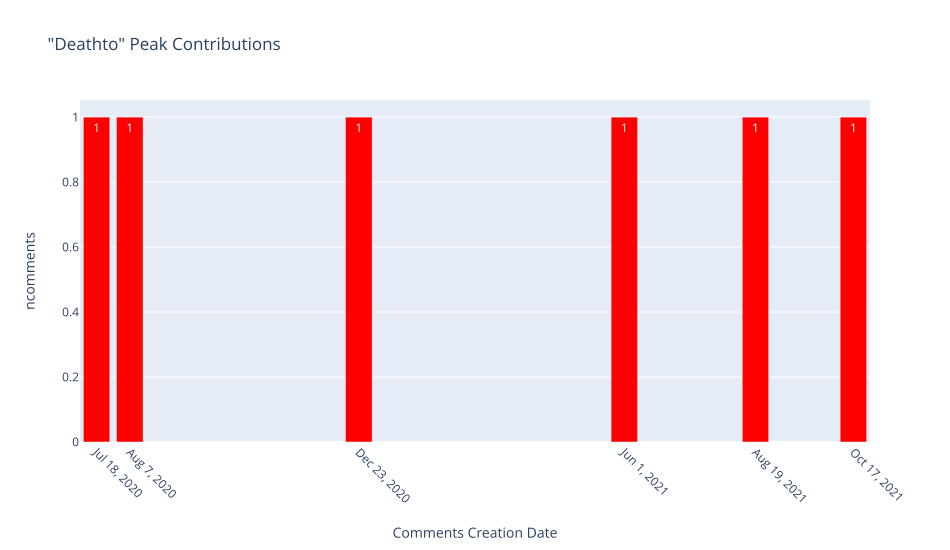

In [85]:
deathto_dates = df_deathto.date.value_counts().to_frame().reset_index().rename(columns={'index':'date',
                                                                                  'date':'ncomments'})
helpers.bar_peaks(deathto_dates.head(6), '"Deathto" Peak Contributions',
                  threshold=0, xlabel='Comments Creation Date')

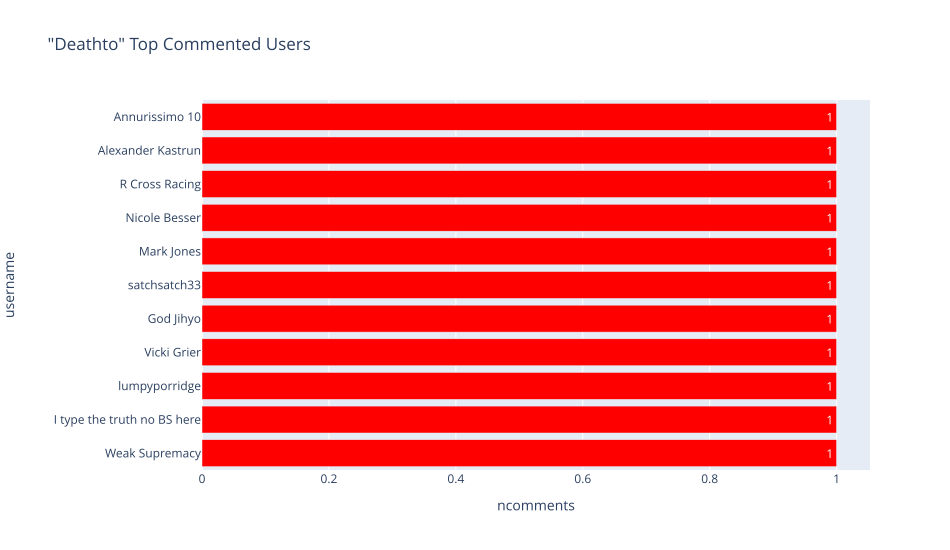

In [86]:
deathto_users = df_deathto.username.value_counts().to_frame().reset_index().rename(columns={'index':'username',
                                                                                  'username':'ncomments'})
helpers.barh(deathto_users.head(15), '"Deathto" Top Commented Users', threshold=0, c=0)

# pay for her crime

In [87]:
df_comments[df_comments.text.str.contains('pay for her crime')].shape[0]

74

In [88]:
df_pay = df_comments[df_comments.text.str.contains('pay for her crime')]
df_pay.text.value_counts().head(60)

we got to be patient in time amber will have to pay for her crime                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [89]:
df_pay.username.value_counts().head(15)

Elizabeth Carter           5
Rune905                    3
Maureen Kinross            2
Froggy77100                1
Fox Wonderland             1
Normally Izzy              1
Sabrina Beharry            1
Crippling Depression CD    1
joأ£o soares               1
NIBS                       1
Me A                       1
chucknorris202             1
Sandi G                    1
Sandy LaFerriere           1
Sidney haha                1
Name: username, dtype: int64

In [90]:
# df_pay[['text', 'username', 'date']]

In [91]:
print(df_pay.shape)
df_pay

(74, 20)


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
400422,KGsRr4lNkRI,8FxfxVDG5FTAsOgXM6NigNs05B0,Ugw5bC6AWLg2AxiO6Zd4AaABAg,the bottom line is that she kill the guy on hi...,cc boss,UCSa51A6DaKBUUzAzcwWNEEA,0.0,2019-09-26 12:51:36+00:00,2019-09-26 12:51:36+00:00,0.0,NaN,comment,none,none,none,2019,2019-09-26,Sep,26,12
371911,G6s0uoe8OR0,w7MbOhnFUbVXqVZNfnz1vc2dJkU,UgwoLer8uwuTbKFK1ud4AaABAg,i believe her tbh but it isn't matter of truth...,Outlaw Harris,UCDDKvG8jdVf-edQJ0dDIEZg,1.0,2019-10-02 05:32:48+00:00,2019-10-02 05:32:48+00:00,0.0,NaN,comment,none,none,none,2019,2019-10-02,Oct,2,5
410160,8Mu7Dl4lwWk,Tr7OQ4OglkGwOMoXaObbbz_yXHo,Ugzw9Pm1glXoNR4STJt4AaABAg,i really like johnny depp to the bottom of my ...,BRUTALSHANZ1988,UCB2QQbgvtN5FZPCZocc2lhA,1.0,2020-02-02 18:29:05+00:00,2020-02-02 18:29:05+00:00,0.0,NaN,comment,none,none,none,2020,2020-02-02,Feb,2,18
1096503,jubgNDZhWZ8,1vQK-c_D36uBmWlmuvTub7x3qMU,UgxAglbC5lHdcz1b_2F4AaABAg,she needs to pay for her crime defamations and...,mike hopkins,UCDVWBWR8Ndj0ueAMZqedsJA,1.0,2020-02-04 17:31:54+00:00,2020-02-04 17:31:54+00:00,0.0,NaN,comment,none,none,none,2020,2020-02-04,Feb,4,17
1801364,Cg9SvQSMnoE,wU3AIyqIxKBrqtg-i5140qEavGI,UgwRkK2tv808a7eanyB4AaABAg.94jcmOK8R4894lCnOLGmEk,no one is really a saint if you ask me i hope ...,Victor Guaracho,UCPtWINL4HKnw52afi6juO3A,3.0,2020-02-08 04:18:48+00:00,2020-02-08 04:18:48+00:00,0.0,NaN,reply,UgwRkK2tv808a7eanyB4AaABAg,http://www.youtube.com/channel/UCPtWINL4HKnw52...,https://yt3.ggpht.com/ytc/AKedOLTi5Hn5ODZzGBOH...,2020,2020-02-08,Feb,8,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1542944,FtLqhPJAhp8,IHimdablvKDJXStYs1onx-YVZNs,Ugxdeo6nZBFHuz7otWN4AaABAg,amber turd is evil she needs to pay for her cr...,Marquita Marina,UCKvZ2XZidr6zoVa6b9iGoMw,0.0,2021-10-27 01:32:56+00:00,2021-10-27 01:32:56+00:00,0.0,NaN,comment,none,none,none,2021,2021-10-27,Oct,27,1
1403472,1Z28T2Hci20,zKOZ7EYV5Vf0fM-XQN_Ml-dGsCA,Ugwjm-wXpugVnhzP6ex4AaABAg,i can't wait to see her pay for her crimes as ...,Kaepora Gaebora,UC0Sav9DaUSEjMDYJ2TxRAxA,0.0,2021-11-10 14:31:53+00:00,2021-11-10 14:31:53+00:00,0.0,NaN,comment,none,none,none,2021,2021-11-10,Nov,10,14
1453319,wi9eQP8XPTw,dwyrLTeY4fjCxb21NWVFoLrQCPc,UgxyA4UFrwJ5ZjCO7jJ4AaABAg,amber heard needs to pay for her crimes johnny...,Sharon Duval,UCFT0eDNwmuZHEOzxbyskb6g,16.0,2021-11-14 17:28:16+00:00,2021-11-14 17:28:16+00:00,0.0,NaN,comment,none,none,none,2021,2021-11-14,Nov,14,17
1563516,4Jc6bhF4sqw,XJGigb-z_e23WP-GyiFpQHrobGc,UgyXP73pWf3Qr2raVwZ4AaABAg,ah needs to pay for her crime! she is tried to...,Sandy LaFerriere,UCwSRqBZcg0l18vj0LbbRifw,0.0,2021-11-18 02:37:51+00:00,2021-11-18 02:37:51+00:00,0.0,NaN,comment,none,none,none,2021,2021-11-18,Nov,18,2


In [92]:
threat_users = threat_users | set(df_pay.username)

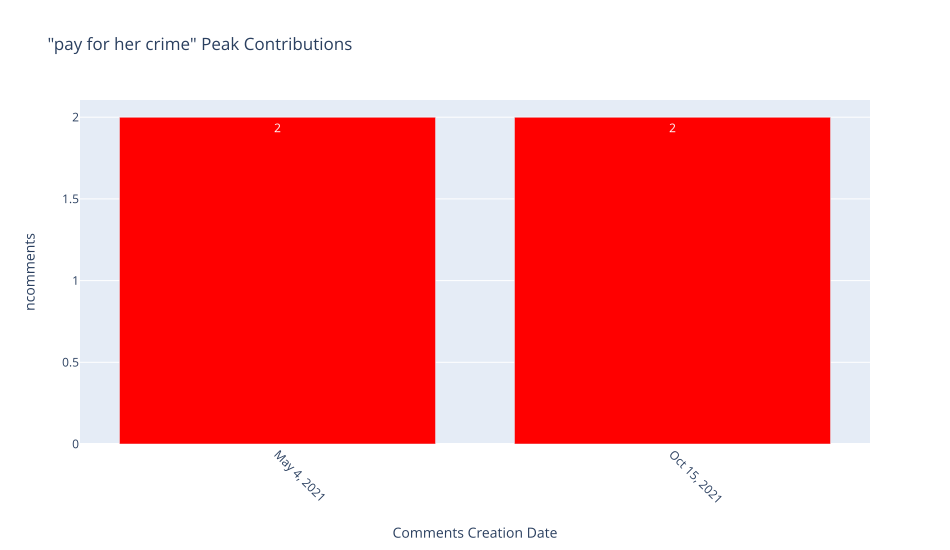

In [93]:
helpers.text_all_peaks(df_pay, 'pay for her crime', n=2, threshold=0)

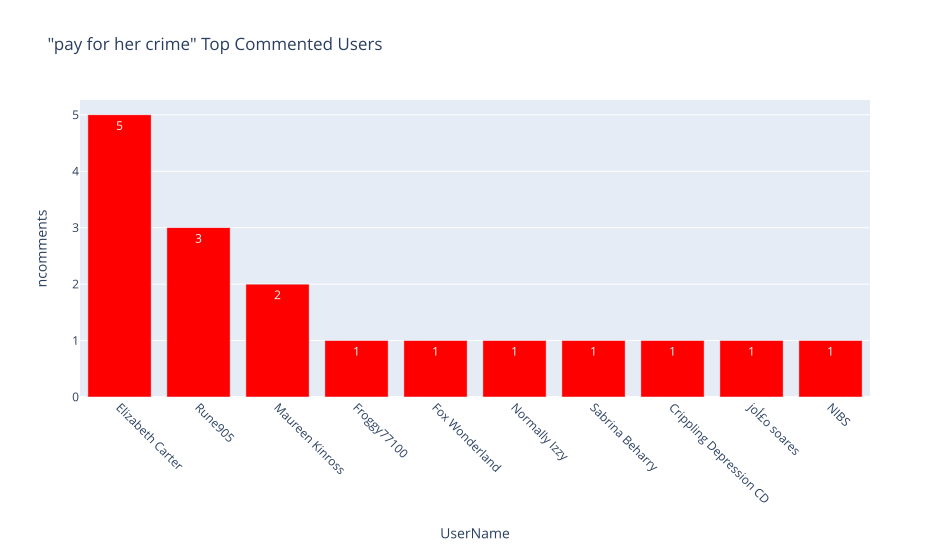

In [94]:
helpers.users_all_peaks(df_pay, 'pay for her crime', n=10, threshold=0)

# if she wants assault she well get it

In [95]:
df_comments[df_comments.text.str.contains('if she wants assault she well get it')].text.value_counts().head()

amber heard well pay for her crimes if she wants assault she well get it    1
Name: text, dtype: int64

In [96]:
df_comments[df_comments.text.str.contains('if she wants assault she well get it')][['username', 'date']]

,username,date
569878,Matthew joly-rice,2020-12-07


In [97]:
df_comments[df_comments.text.str.contains('if she wants assault she well get it')]

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
569878,Gn-kEWSgX8w,gMyN7WvlYuiSDrcCXjtnlzdgD-M,UgwyKGB36mOo_VFpcPd4AaABAg,amber heard well pay for her crimes if she wan...,Matthew joly-rice,UCLl2mtCJzfvWPoOCuCEjqAQ,0.0,2020-12-07 06:22:54+00:00,2020-12-07 06:22:54+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-07,Dec,7,6


In [98]:
threat_users = threat_users | {'Matthew joly-rice'}

# amber should never been born that witch thinks she can take johnny down then she is really insane that dirty witch needs to just go die somewhere!!!

In [99]:
threat_txt = "amber should never been born that witch thinks she can take johnny down then she is really insane that dirty witch needs to just go die somewhere!!!"
df_comments[df_comments.text == threat_txt].text.value_counts().head(60)

amber should never been born that witch thinks she can take johnny down then she is really insane that dirty witch needs to just go die somewhere!!!    1
Name: text, dtype: int64

In [100]:
df_comments[df_comments.text == threat_txt][['username', 'date']]

,username,date
120428,Holly Bischoff,2017-06-29


In [101]:
df_comments[df_comments.text == threat_txt]

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
120428,jCU18BbfAhY,VwEzoD-qVF5qCMzHuCRcwyt3oI8,UgiFFBcR904J2HgCoAEC,amber should never been born that witch thinks...,Holly Bischoff,UCVPk_k6JC1w2pq_RIlCSv8Q,18.0,2017-06-29 03:29:16+00:00,2017-06-29 03:29:16+00:00,0.0,NaN,comment,none,none,none,2017,2017-06-29,Jun,29,3


In [102]:
threat_users = threat_users | {'Holly Bischoff'}

# the 27k who liked can literally go die in a fire with heard

In [103]:
threat_txt = "the 27k who liked can literally go die in a fire with heard"
df_comments[df_comments.text == threat_txt].text.value_counts().head(60)

the 27k who liked can literally go die in a fire with heard    1
Name: text, dtype: int64

In [104]:
df_comments[df_comments.text == threat_txt][['username', 'date']]

,username,date
664093,Trent Gonzales,2020-12-29


In [105]:
df_comments[df_comments.text == threat_txt]

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
664093,uretrfMA-Io,cXc8AJPXUKf4TYr6693xE8JO0UY,UgxwaWcApy7lnSglzAR4AaABAg,the 27k who liked can literally go die in a fi...,Trent Gonzales,UCn91R-moPQc_xPnGMoO2S2Q,0.0,2020-12-29 17:21:09+00:00,2020-12-29 17:21:09+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-29,Dec,29,17


In [106]:
threat_users = threat_users | {'Trent Gonzales'}

# she was the reason i wanted to kill the half population of world like her don't blame me

In [107]:
threat_txt = "she was the reason i wanted to kill the half population of world like her don't blame me"
df_comments[df_comments.text == threat_txt].text.value_counts().head(60)

she was the reason i wanted to kill the half population of world like her don't blame me    3
Name: text, dtype: int64

In [108]:
df_comments[df_comments.text == threat_txt][['username', 'date']]

,username,date
510534,Mr Thanos,2020-12-14
527515,Mr Thanos,2020-12-14
408510,Mr Thanos,2020-12-14


In [109]:
df_comments[df_comments.text == threat_txt]

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
510534,33N6LS4DLT0,mA0YdHEozg0AX0RAAiw79TxRbFY,UgzeRDyiUD4qAG2koNl4AaABAg,she was the reason i wanted to kill the half p...,Mr Thanos,UCDTnkI2JBF15F_RWTYyF8Dw,1.0,2020-12-14 19:07:34+00:00,2020-12-14 19:16:44+00:00,4.0,NaN,comment,none,none,none,2020,2020-12-14,Dec,14,19
527515,mpJLRodyNTs,SYiesmF0eyHFWy8hvxfAPEzFyuk,UgzmohmmfkHFUyDOrWJ4AaABAg,she was the reason i wanted to kill the half p...,Mr Thanos,UCDTnkI2JBF15F_RWTYyF8Dw,0.0,2020-12-14 19:16:59+00:00,2020-12-14 19:16:59+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-14,Dec,14,19
408510,w9D6x3VAdBw,7giZkWXicSN8LFJuY9U1byd_UmM,UgytTaU7DlvEObVhZd14AaABAg,she was the reason i wanted to kill the half p...,Mr Thanos,UCDTnkI2JBF15F_RWTYyF8Dw,1.0,2020-12-14 19:17:11+00:00,2020-12-14 19:17:11+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-14,Dec,14,19


In [110]:
threat_users = threat_users | {'Mr Thanos'}

# Kiss Of Death

In [111]:
df_comments[df_comments.text.str.contains('kiss of death')].text.value_counts().head(60)

there is no potc without johnny depp as jack sparrow if they hire ah that will be the kiss of deathno one wants to see her plus she can't act her way out of a paper bag                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       1
wb just gave aquaman 2 the kiss of death fans will make themselves heard once again by not watching the film                                                           

In [112]:
# df_comments[df_comments.text.str.contains('kiss of death')][['text', 'username', 'date']]

In [113]:
print(df_comments[df_comments.text.str.contains('kiss of death')].shape)
df_comments[df_comments.text.str.contains('kiss of death')]

(19, 20)


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
1791887,1T_VK3mtIMc,0A5Jog89VkFUeagkfeyVC9bF6PA,Ugw1yDhOos936LeS0914AaABAg.8td71WsHiQN8tdcEkaWiNN,if you dont understand what this video means t...,Blue Blues,UCfMKYyjLS_KZOqoVw5-Vx0w,0.0,2019-04-12 23:19:13+00:00,2019-04-12 23:19:13+00:00,0.0,NaN,reply,Ugw1yDhOos936LeS0914AaABAg,http://www.youtube.com/channel/UCfMKYyjLS_KZOq...,https://yt3.ggpht.com/ytc/AKedOLT9G6fDjGJSz6V0...,2019,2019-04-12,Apr,12,23
864607,aca0KWoHtqQ,0nEMZQlE8OLlPQkBXMW47v22bLs,UgwsFmNzN8LjzLCfTpx4AaABAg,spoilt little brat throwing her toys out the p...,BumbleBee,UC9fVrolL8Dl3HrKig8r4vgQ,0.0,2020-07-16 22:29:45+00:00,2020-07-16 22:29:45+00:00,1.0,NaN,comment,none,none,none,2020,2020-07-16,Jul,16,22
479053,iV3V0wwhVhI,r80v6tcNsbj9PirPmcn389s-ntQ,UgydgCi1yoc4LHsJkPR4AaABAg,those people who support ah in aquaman ii r in...,mary bodnar,UC9j0s18lK1tMaSCV1FaufXw,1.0,2020-07-27 19:13:37+00:00,2020-07-27 19:13:37+00:00,0.0,NaN,comment,none,none,none,2020,2020-07-27,Jul,27,19
1988786,EqDA483Ki7c,2Xv4mRj8kQbXAOZ_yO021N1hlAY,UgyvKWr9vpS2mdfBa854AaABAg.9ELJSDDbP7C9EMPPNKWuh7,@vanessa sanders darth is outta control and sp...,Scott Cook,UC4o92be-4wfU40jVJdRqKVA,4.0,2020-10-03 17:02:41+00:00,2020-10-03 17:02:41+00:00,0.0,NaN,reply,UgyvKWr9vpS2mdfBa854AaABAg,http://www.youtube.com/channel/UC4o92be-4wfU40...,https://yt3.ggpht.com/ytc/AKedOLTopCmFqjqkifPC...,2020,2020-10-03,Oct,3,17
581603,fTIscrsKog4,bVjy9dHivRpleFSfZMsQubIiF5I,UgztN7RCtci5EKK_Lzx4AaABAg,there is no potc without johnny depp as jack s...,Amy Ferguson,UCENR0qtrXveBFqRFim3H5ag,0.0,2020-11-30 04:47:31+00:00,2020-11-30 04:47:31+00:00,0.0,NaN,comment,none,none,none,2020,2020-11-30,Nov,30,4
486642,1khEVKpz6Qw,AIztt5ZUg7CwabZaKv_tnoxB1TI,UgyeT71riqiVo_2KTOF4AaABAg,amber heard is laughing at victims of domestic...,SheDevil,UCJL8QAG4QLbpaupCQb549rQ,9.0,2020-12-23 18:01:28+00:00,2020-12-23 18:01:28+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-23,Dec,23,18
851940,o9w1klOHg4Y,B1qJ36HGx3p2ETDkPWDaGgnAkTk,UgxPaTf5ddzN-mRy6hR4AaABAg,amber heard is an abuser! i do not support abu...,Jeannette Summers,UCJUjGmCy6fdwzNVKfcf_Wqg,21.0,2020-12-25 06:58:01+00:00,2020-12-25 06:58:01+00:00,0.0,NaN,comment,none,none,none,2020,2020-12-25,Dec,25,6
1251029,wlHulL6vToE,KUv13cU27pHMyrdLiUOVAkd-UYE,UgwkLg3_GRz80Ln7rQd4AaABAg,i think that it's time for the hollywood big s...,SheDevil,UCJL8QAG4QLbpaupCQb549rQ,0.0,2021-01-02 21:10:10+00:00,2021-01-02 21:10:10+00:00,0.0,NaN,comment,none,none,none,2021,2021-01-02,Jan,2,21
1630504,PAK7tlGFRgU,LKxfUV2LN15bdOwremg7tW_5M6k,Ugzt6LngDRPKcm8sJdV4AaABAg,the only thing that makes sense is ah gets thr...,Sandra Stone,UCHsBHkKs0rHOf7OkLev6kOg,6.0,2021-01-07 20:12:58+00:00,2021-01-07 20:12:58+00:00,0.0,NaN,comment,none,none,none,2021,2021-01-07,Jan,7,20
1348623,YwTRIGLWxVc,w0xOSpSioFyEeY4QwNOsnbICT_g,UgwKEPZsm2RAr3mU_BJ4AaABAg,there has been no movie with former cast membe...,jeffrey spinner,UCDk2VBxAevpQ-abyRYPsr4w,0.0,2021-03-03 00:20:40+00:00,2021-03-03 00:21:56+00:00,0.0,NaN,comment,none,none,none,2021,2021-03-03,Mar,3,0


In [114]:
# threat_users = threat_users | set(df_comments[df_comments.text.str.contains('kiss of death')].username)

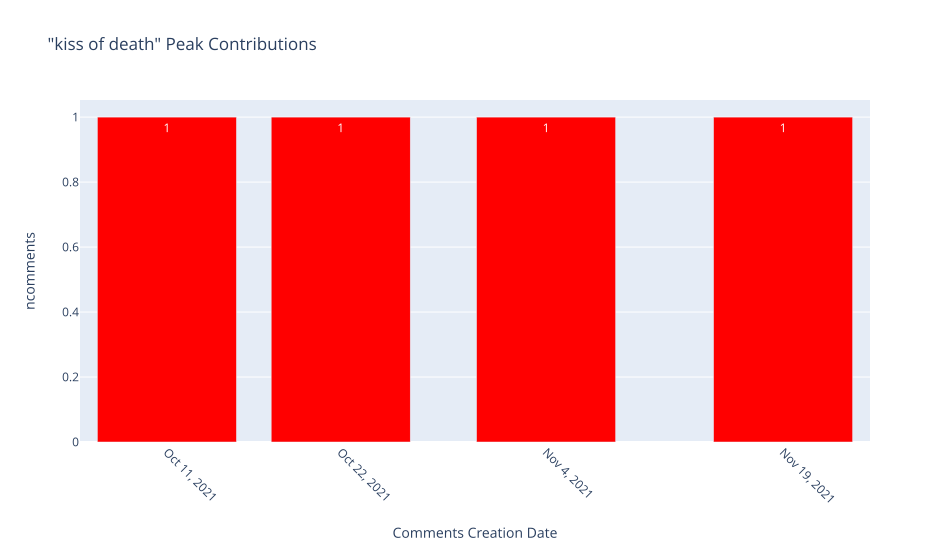

In [115]:
helpers.text_all_peaks(df_comments, 'kiss of death', n=4, threshold=0)

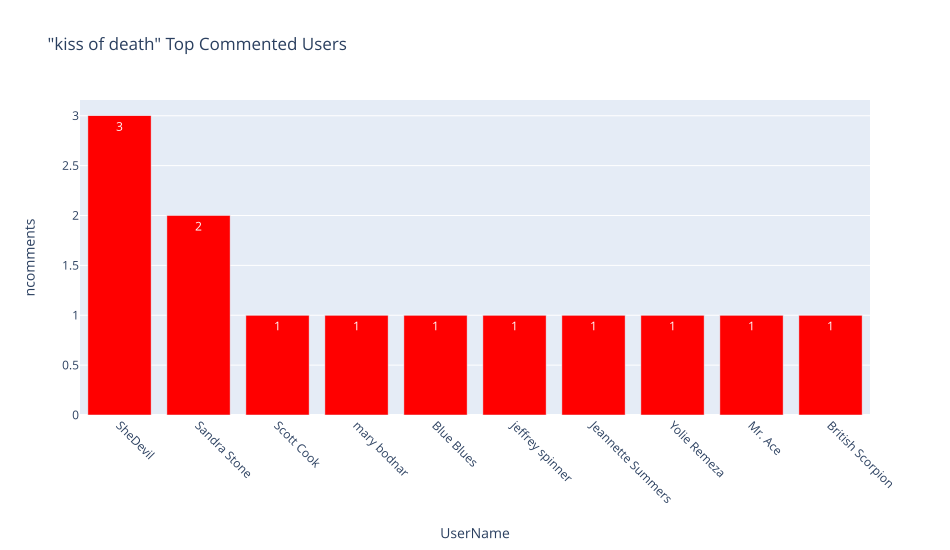

In [116]:
helpers.users_all_peaks(df_comments, 'kiss of death', n=10, threshold=0)

<a id='hell_burn'></a>
>>## Hell & Burn
> <ul>
 <li><a href="#all_threat">All Threat</a></li>
 <li><a href="#kill_death">Kill & Death</a></li>
 <li><a href="#hell_burn"><b>Hell & Burn</b></a></li>
 <li><a href="#threat_users">Threat Users Contributions</a></li>
 </ul>

In [117]:
df_comments[df_comments.text.str.contains('inhell')].text.value_counts()

#justiceforjohnny #justicefordepp #amberburninhell                                                                                                                                                                                                                                                  1
i stand with johnny you are a pathetic excuse of a woman the lies you have told are an insult to those who have actually suffered domestic abuse if anyone was abused its johnny by you rot in hell amber! #justiceforjohnny #johnnydeppisinnocent #downwithamberheardslies #rotinhellamberheard    1
do a amber heard dvd burning all across the country #amberheardburninhell make a video of burning one of her videos also boycott the feminist group she is a so called advocate for #justiceforcaptainsparrow                                                                                       1
as long as she gone if not will see #burninhellamber                                                                  

In [118]:
df_comments[df_comments.text.str.contains('tohell')].text.value_counts()

gotohellaaron well in this case we know she is a lier                                                                                                                                                                                                                                                     1
gotohellaaron i've read online that he's 5'10 and she is 5'7 so she is like three inches shorter than him still relatively tall compared to the average woman who's 5'4 nonetheless abuse is not about size a pint sized woman can be just as capable of physically and/or sexually abusing a huge man    1
on that note #gotohellsoonabuserturd                                                                                                                                                                                                                                                                      1
16k dislikes and getting strongerًں¤کًں¤کًں¤کًں¤ک #justice4johnny #ambercangostraighttohell         

In [119]:
threat_list = [' to hell', 'tohell', 'in hell', 'inhell', "who the hell is", 
               'burn her', 'burn turd', 'her burn']
df_hell =df_comments[df_comments.text.str.contains('|'.join(threat_list))]
df_hell.text.value_counts().head(60)

go to hell                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [120]:
df_hell.username.value_counts().head(10)

Jake Chapman                       71
The Amber Heard Playlist!!         26
Bobby Campbell aka (The Oracle)    25
Jonas Nordgren                     12
Jesus is God                       10
Ian Klingensmith                    8
ogechi okeke                        7
Roberto Chisum                      7
Venom Neff                          7
LaraCroftEyes1                      7
Name: username, dtype: int64

In [121]:
print(df_hell.shape)
df_hell.head()

(2866, 20)


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
15035,rB7ONnfIjaI,eNAkXivun5Fv-PfEwtGaO7f16nM,UgxwjROmunTJrO7SE-N4AaABAg,men who cheat should rot in hell! cheating sho...,Sarah Stroschein,UCscz3MbxX-TyBKTUncwSYWA,0.0,2010-07-04 19:24:06+00:00,2010-07-04 19:24:06+00:00,0.0,NaN,comment,none,none,none,2010,2010-07-04,Jul,4,19
13952,jouaan70m4c,eS-3ng3MzVlted4qG-iwcknAxfs,UgwwHInnhi42jZa74qp4AaABAg,i wanna see dat !!! i wanna see day !!gives n...,mintgumdropz1,UCqwPbHag14nV33OiZwUJJrw,1.0,2011-02-21 16:00:32+00:00,2011-02-21 16:00:32+00:00,0.0,NaN,comment,none,none,none,2011,2011-02-21,Feb,21,16
14366,ZCbTICNAwxM,P3U5YIUbPtRjcHTeOwOcqxZUUaU,UgzTxpfl932bj11xreF4AaABAg,@x14screamersis context context context 1 cor ...,shoeman26,UCGzMM0XZOfSBRhEaoEpAK0w,0.0,2011-03-08 05:05:10+00:00,2011-03-08 05:05:10+00:00,0.0,NaN,comment,none,none,none,2011,2011-03-08,Mar,8,5
13484,rB7ONnfIjaI,6gaFbmQBR9Mgu6u_OfYuYnz_-zw,UgydOcncVNcT-b3VdB94AaABAg,dam is it me or she one of the most atractive ...,Krystal Cornell,UCNVZJwzFvUY8dq9AMqsavSg,0.0,2011-06-26 17:40:51+00:00,2011-06-26 17:40:51+00:00,0.0,NaN,comment,none,none,none,2011,2011-06-26,Jun,26,17
13940,jouaan70m4c,5wgHpNODfXaNL5hjI2e0j3LHVog,UgwlccsEn8MY8gCm52B4AaABAg,thumbs up if you think highway to hell is a pe...,azjp9305,UC1sJmAV9sVtsPjhQ9jmCO-w,6.0,2011-07-02 13:21:28+00:00,2011-07-02 13:21:28+00:00,0.0,NaN,comment,none,none,none,2011,2011-07-02,Jul,2,13


In [122]:
threat_users = threat_users | set(df_hell.username)

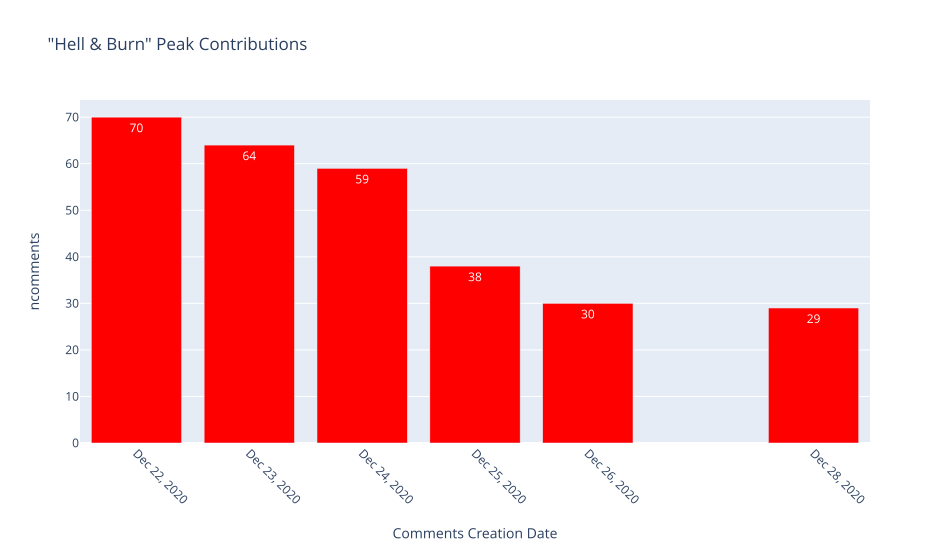

In [123]:
hell_dates = df_hell.date.value_counts().to_frame().reset_index().rename(columns={'index':'date',
                                                                                  'date':'ncomments'})
helpers.bar_peaks(hell_dates.head(6), '"Hell & Burn" Peak Contributions',
                  threshold=0, xlabel='Comments Creation Date')

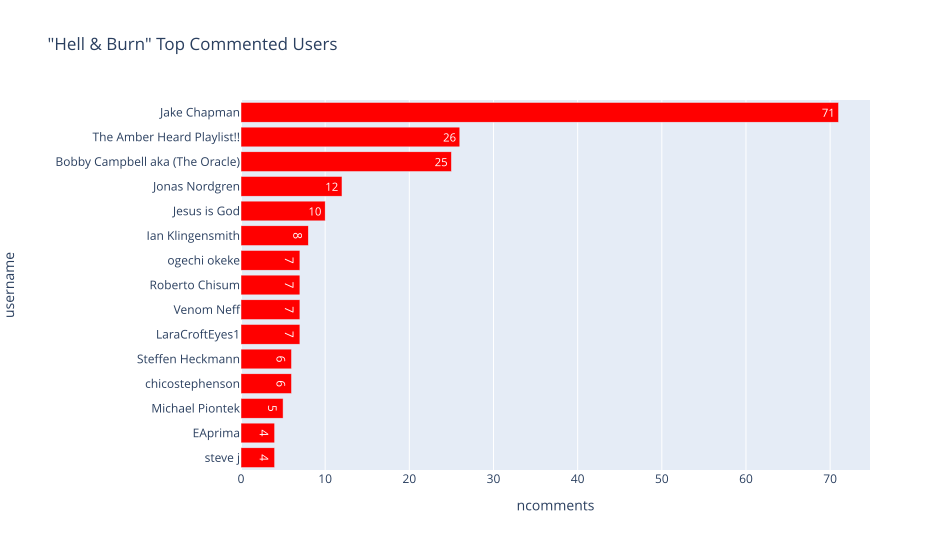

In [124]:
hell_users = df_hell.username.value_counts().to_frame().reset_index().rename(columns={'index':'username',
                                                                                  'username':'ncomments'})
helpers.barh(hell_users.head(15), '"Hell & Burn" Top Commented Users', threshold=0, c=0)

<br>

<br>

<a id='threat_users'></a>
>>## Threat Users Contributions (All Contributions)
> <ul>
 <li><a href="#all_threat">All Threat</a></li>
 <li><a href="#kill_death">Kill & Death</a></li>
 <li><a href="#hell_burn">Hell & Burn</a></li>
 <li><a href="#threat_users"><b>Threat Users Contributions</b></a></li>
 </ul>

In [253]:
len(set(df_threat.username))

35929

In [126]:
threat_users = list(df_threat.username)
df_threat_users = df_comments.query(' username == @threat_users ')
print(f'{df_threat_users.shape[0]} contributions, on {df_threat_users.video_id.nunique()} Videos, made by {df_threat_users.username.nunique()} Users')
df_threat_users.head(2)


417042 contributions, on 4446 Videos, made by 35928 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
15665,Ki5GyO0tRWc,hilZZNiEk1Phk1CnvwxktpZOEPU,UgxhsGwOYhnfDWEfhTV4AaABAg,im ki nda tired of penn badgely but it looks k...,J Lee,UCLkwn2ldFGYuboHP-_KzClw,0.0,2009-06-26 03:54:33+00:00,2009-06-26 03:54:33+00:00,0.0,NaN,comment,none,none,none,2009,2009-06-26,Jun,26,3
15641,Ki5GyO0tRWc,Cf8obtbluuXqSF6btQrnxmPeyb4,UgwYWpVW56zM6PfNmVJ4AaABAg,how predictable,Ashley,UCR5XLi9Z5SI93idvJ4-ivnQ,0.0,2009-07-04 21:49:29+00:00,2009-07-04 21:49:29+00:00,0.0,NaN,comment,none,none,none,2009,2009-07-04,Jul,4,21


In [127]:
df = df_threat_users.groupby('username').agg({'text':'count', 'nreplies': 'sum', 'nlikes': 'sum'}).reset_index(
).rename(columns={'text':'ncomments'})

print(df.shape)
df.sort_values('ncomments', ascending=False).head(15)

(35928, 4)


,username,ncomments,nreplies,nlikes
13579,Johnny Depp,15986,16.0,2572.0
16450,Lindsey Depp,2432,232.0,2626.0
23445,Rob's Rules,2023,60.0,2908.0
16820,Lorri Holder,1380,308.0,8743.0
17897,Marianne Erni,977,206.0,6108.0
3768,Bobby Campbell aka (The Oracle),940,491.0,10010.0
14021,Julie Lea,889,261.0,4840.0
4645,Carmen Castro,846,236.0,5335.0
26984,Tania Haeussler,793,269.0,4584.0
11950,J Lee,759,335.0,4030.0


### A Heat Map for the Threat Users Comments 

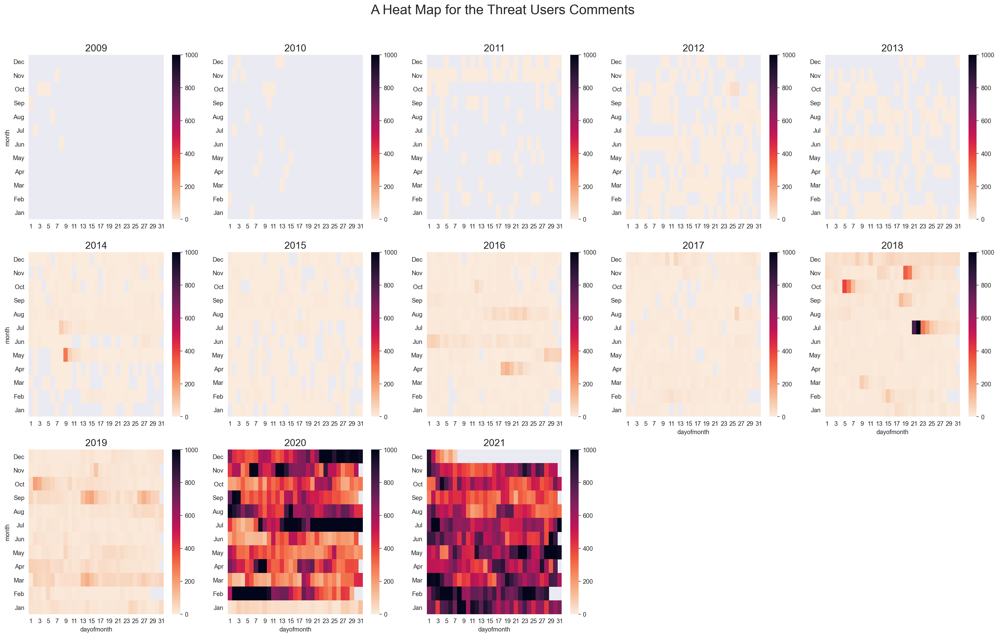

In [128]:
threat_users_daily = df_threat_users.groupby(['year', 'dayofmonth', 'month']).size().reset_index(name='ncomments')

title = 'A Heat Map for the Threat Users Comments'
helpers.facet_heat(threat_users_daily, title, n_col=5, vmax=1000)

### Threat Users Comments Peak Dates

In [129]:
threat_users_dates = df_threat_users.groupby(['date']).agg({'text':'count', 'nlikes': 'sum', 'nreplies': 'sum'}).reset_index(
).rename(columns={'text':'ncomments'}).sort_values('ncomments', ascending=False)

threat_users_dates.head(15)


,date,ncomments,nlikes,nreplies
2692,2020-07-22,2739,46564.0,1524.0
2526,2020-02-07,2488,97112.0,2559.0
2523,2020-02-04,2359,54336.0,1344.0
2693,2020-07-23,2195,56608.0,1514.0
2527,2020-02-08,2106,57169.0,1086.0
2694,2020-07-24,1929,35528.0,1023.0
2691,2020-07-21,1882,42434.0,1212.0
2699,2020-07-29,1875,23876.0,859.0
2846,2020-12-23,1869,14689.0,423.0
2698,2020-07-28,1789,52882.0,1009.0


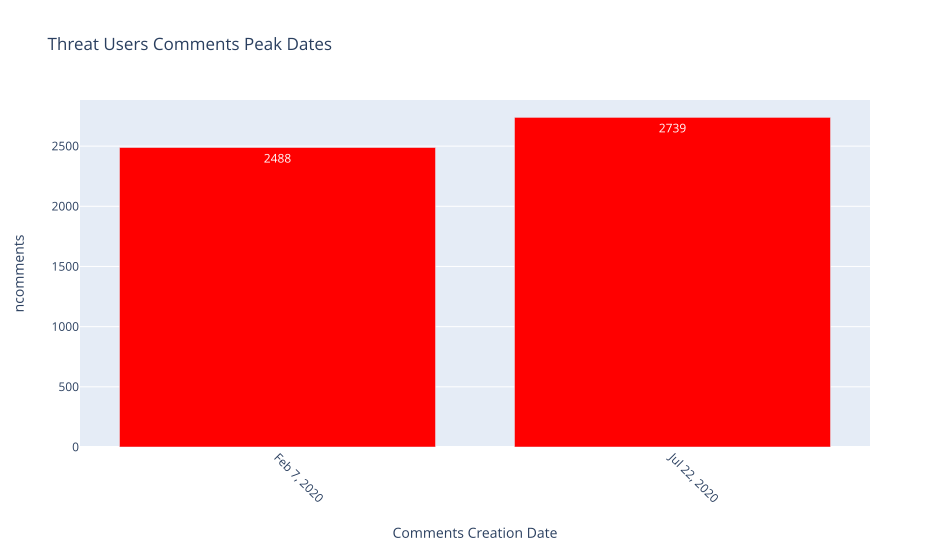

In [130]:
helpers.bar_peaks(threat_users_dates[['date', 'ncomments']].head(2), 
                  'Threat Users Comments Peak Dates')

# Most Repeated Threat Users Comments

In [131]:
df_threat_users.text.value_counts().head(60)

they won't believe you because you are a man she is not a victim                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                1452
#justiceforjohnnydepp                                                                                                                                                                                                                                                              

In [132]:
df_threat_users.text.value_counts()[60:].head(60)

â‌¤ï¸ڈthanks for your utmost love and support you have constantly shown me in such difficult moment i'm forever grateful i really appreciate your unconditional love to me and every effort exerted by you to cause a change¦where are you watching from?                                                                                                                                                                                                                                                                                                                                                                                                                                                                          72
ًںک‚                                                                                                                                                                                                                                                                                              

### Text Contains "not a victim" --> 62570

In [133]:
df_no_pos = df_comments[~df_comments.username.isin(remove_users)]

In [134]:
df_victim = df_no_pos[df_no_pos.text.str.contains('not a victim')]
df_victim.shape

(62209, 20)

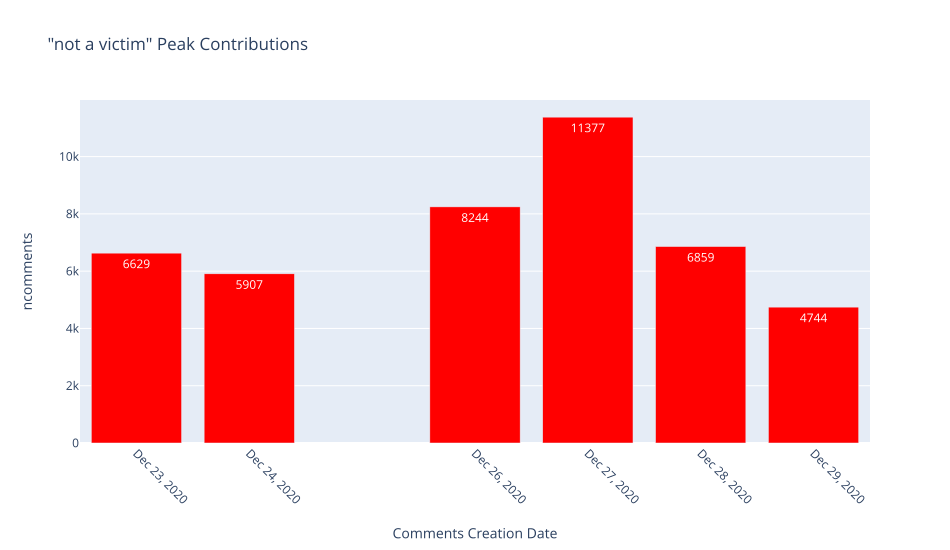

In [135]:
helpers.text_all_peaks(df_no_pos, "not a victim", n=6, threshold=0)

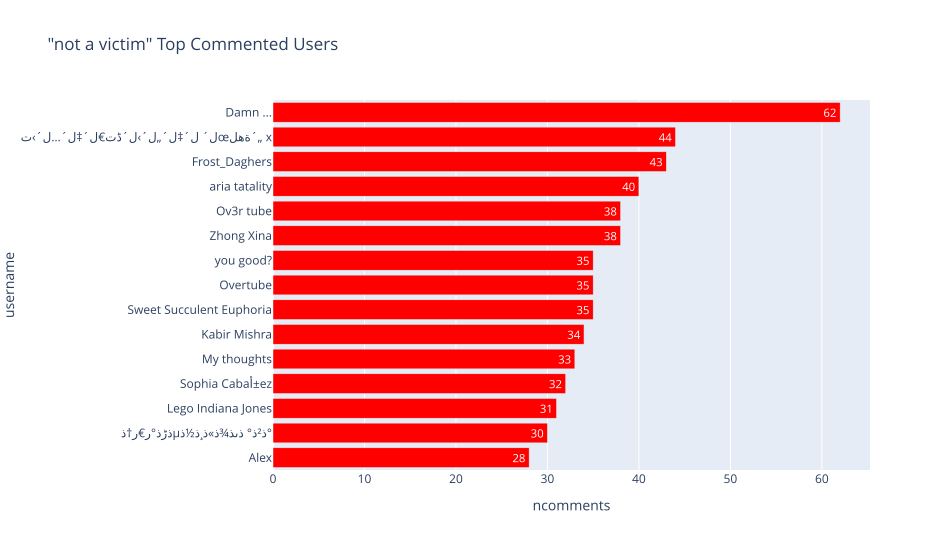

In [136]:
victim_users = df_victim.username.value_counts().to_frame().reset_index().rename(columns={'index':'username',
                                                                                  'username':'ncomments'})
helpers.barh(victim_users.head(15), '"not a victim" Top Commented Users', threshold=0, c=0)

**NOTE:** Most of these users only commented with "not a victim" comments!!!

<br>

# Top Users Commented with "not a victim" 

In [137]:
df_victim.username.value_counts().head(10)

Damn ...                               62
ل´ ل´‡ل´„ل´›ل´ڈت€ل´‡ل´…ل´›تœةھل´„ x    44
Frost_Daghers                          43
aria tatality                          40
Ov3r tube                              38
Zhong Xina                             38
you good?                              35
Overtube                               35
Sweet Succulent Euphoria               35
Kabir Mishra                           34
Name: username, dtype: int64

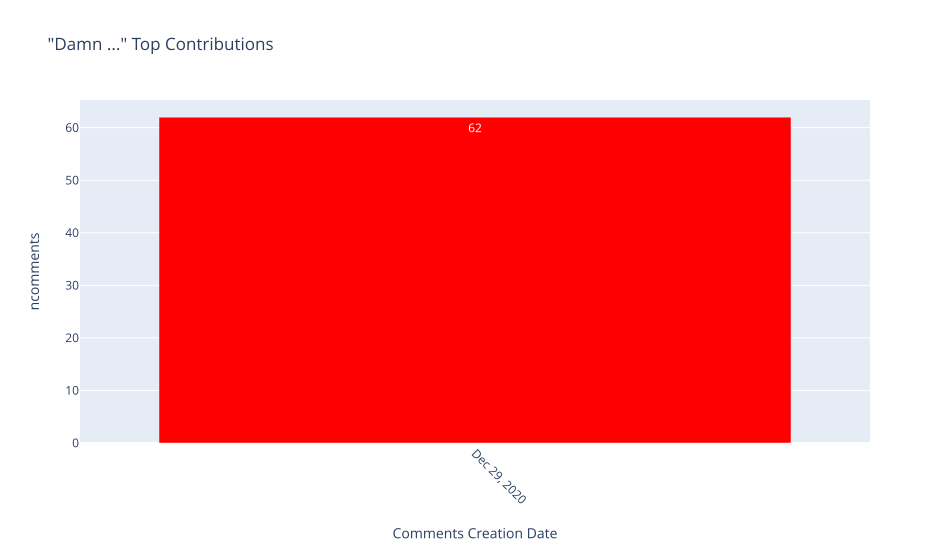

In [138]:
helpers.contr_peaks(df_comments, "Damn ...", n=3, threshold=0)

In [139]:
df_comments.query(" username == 'Damn ...' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    62
Name: text, dtype: int64

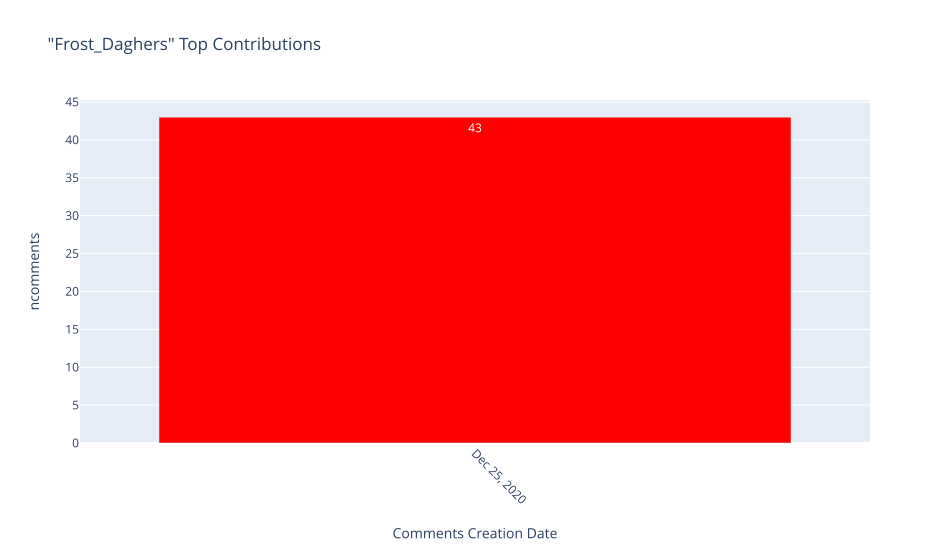

In [140]:
helpers.contr_peaks(df_comments, "Frost_Daghers", n=3, threshold=0)

In [141]:
df_comments.query(" username == 'Frost_Daghers' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    43
Name: text, dtype: int64

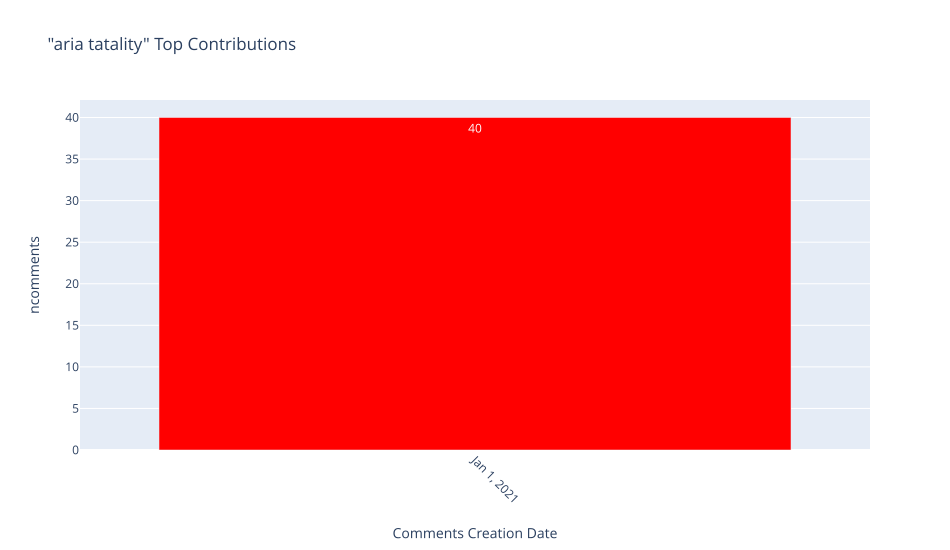

In [142]:
helpers.contr_peaks(df_comments, "aria tatality", n=3, threshold=0)

In [143]:
df_victim.query(" username == 'aria tatality' ").text.value_counts().head()

your lies have been revealed to us you are not a victim you are just a traitor and a scoundrel who made our dear johnny depp sick    40
Name: text, dtype: int64

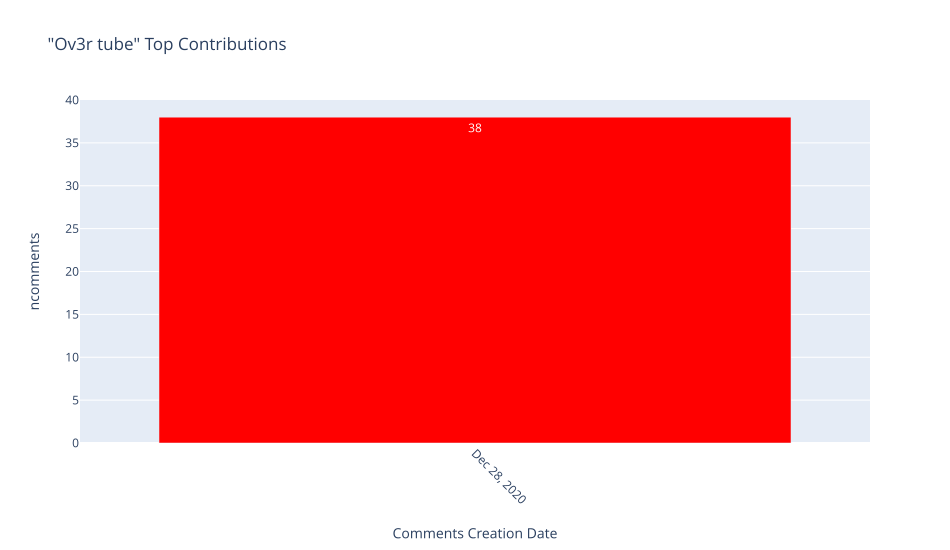

In [144]:
helpers.contr_peaks(df_comments, "Ov3r tube", n=3, threshold=0)

In [145]:
df_comments.query(" username == 'Ov3r tube' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    38
Name: text, dtype: int64

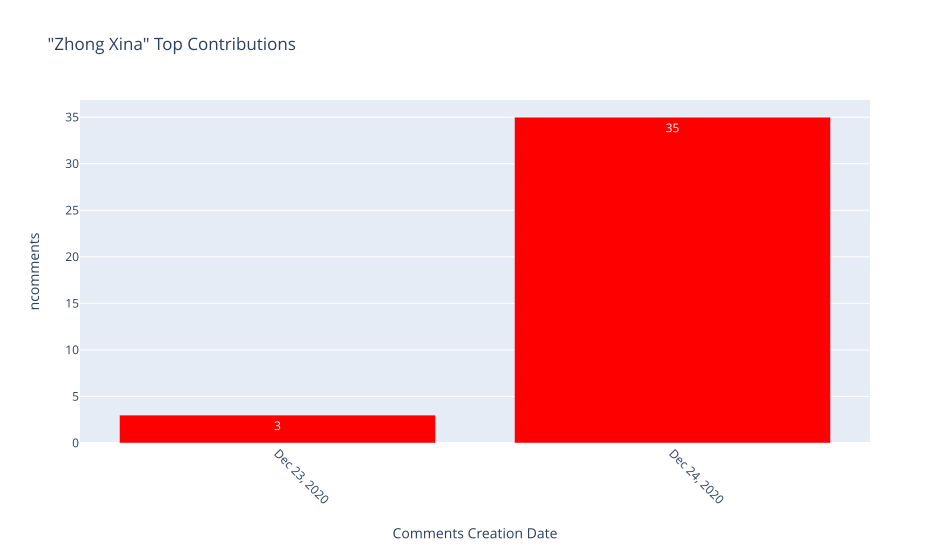

In [146]:
helpers.contr_peaks(df_comments, "Zhong Xina", n=2, threshold=0)

In [147]:
df_comments.query(" username == 'Zhong Xina' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    38
ok but why                                                           1
principal* i'm sorry                                                 1
Name: text, dtype: int64

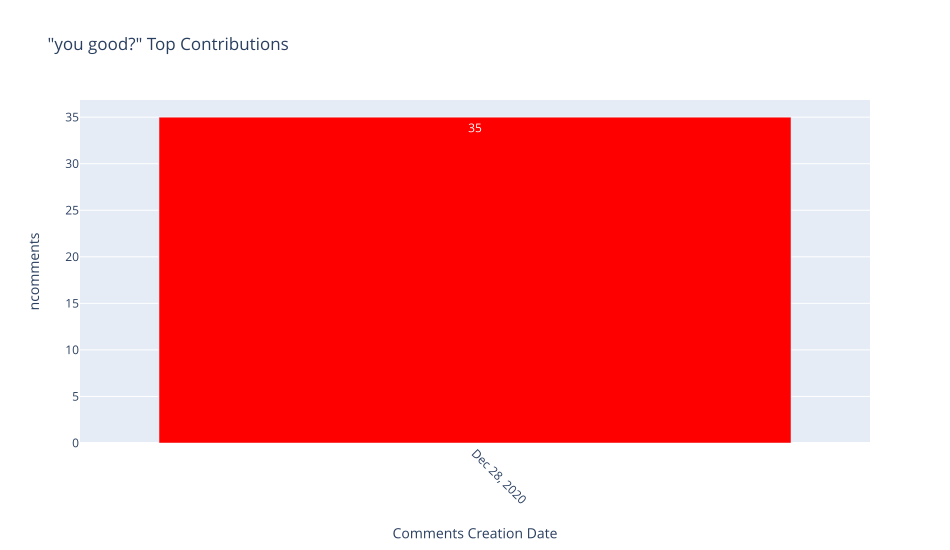

In [148]:
helpers.contr_peaks(df_comments, "you good?", n=3, threshold=0)

In [149]:
df_comments.query(" username == 'you good?' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    35
Name: text, dtype: int64

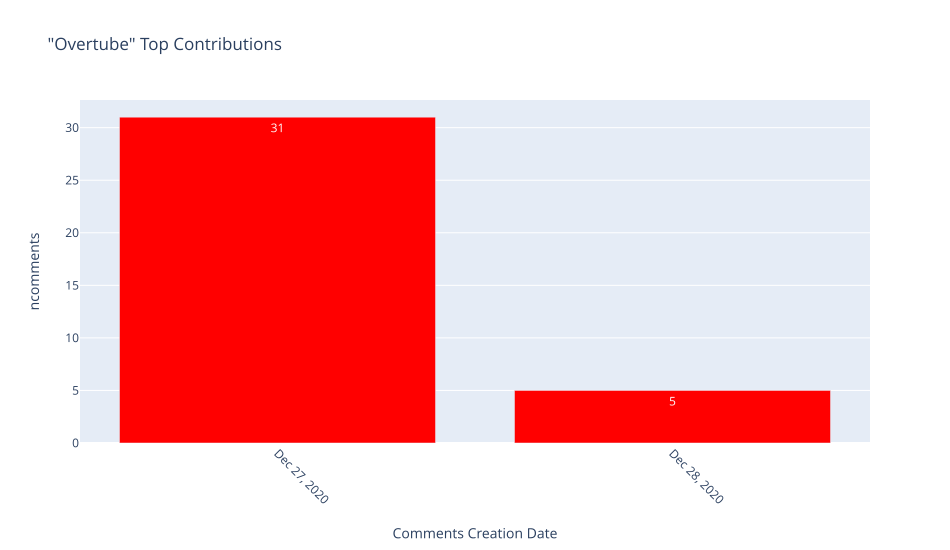

In [150]:
helpers.contr_peaks(df_comments, "Overtube", n=3, threshold=0)

In [151]:
df_comments.query(" username == 'Overtube' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    35
@mionfel trying my best to do 100 replies fuck errors                1
Name: text, dtype: int64

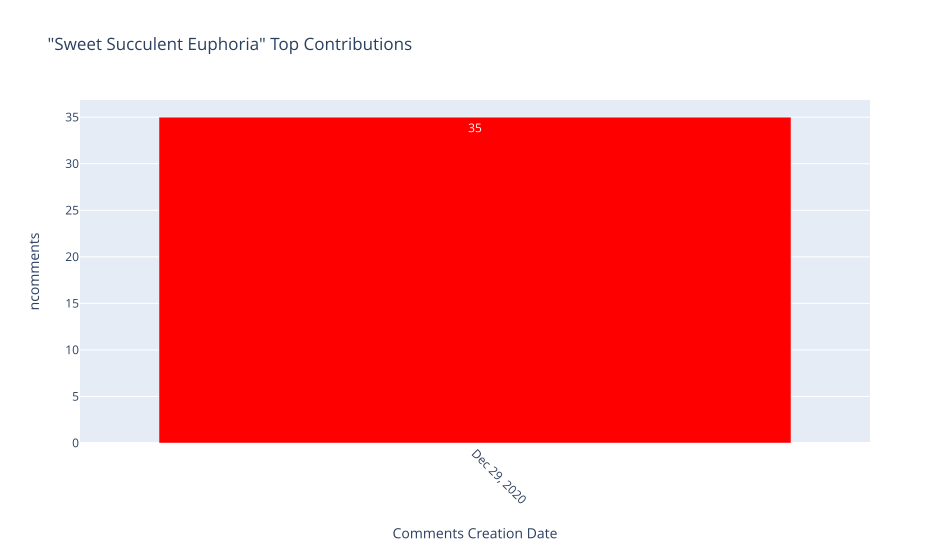

In [152]:
helpers.contr_peaks(df_comments, "Sweet Succulent Euphoria", n=3, threshold=0)

In [153]:
df_comments.query(" username == 'Sweet Succulent Euphoria' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    35
Name: text, dtype: int64

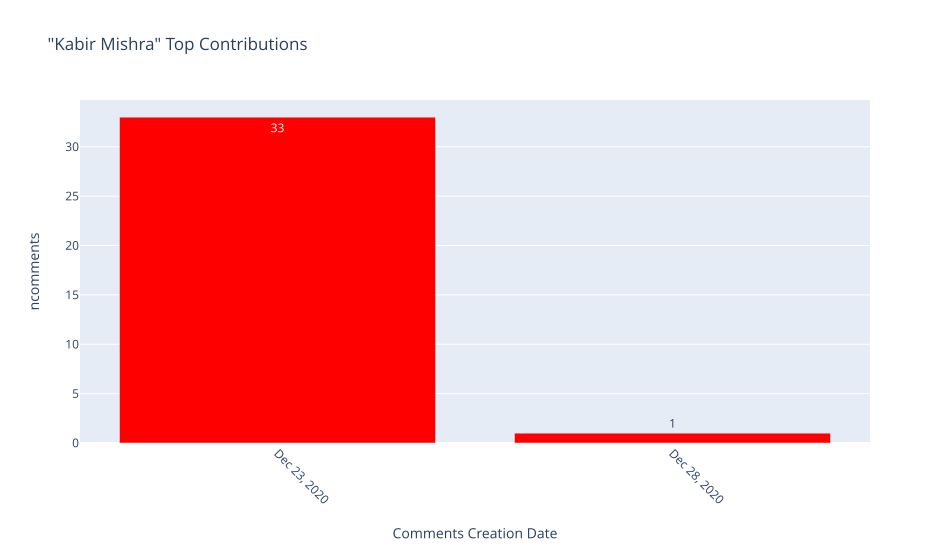

In [154]:
helpers.contr_peaks(df_comments, "Kabir Mishra", n=2, threshold=0)

In [155]:
df_comments.query(" username == 'Kabir Mishra' ").text.value_counts().head()

they won't believe you because you are a man she is not a victim    34
#justiceforjohnnydepp                                                1
Name: text, dtype: int64

<br>

<a id='hate_speech'></a>
>## Hate-Speech Comments
> <ul>
 <li><a href="#threat_comments">Threat Comments</a></li>
 <li><a href="#hate_speech"><b>Hate-Speech Comments</b></a></li>
 <li><a href="#same">Same Text Same Date</a></li>
 <li><a href="#primarly">Primarly Text Investigations</a></li>
 </ul>

In [156]:
# To Load the dictionary of negative text    
with open('negative_text.pkl', 'rb') as f:
    neg_dict = pickle.load(f) 
    neg_text = set(neg_dict.keys())

In [157]:
neg_text = neg_text | {'narcissist', 'cancelamber', 'cancel amber', 'amber sucks', 'hate amber heard', 'scamber', 
                       'boycott amber', 'amber heard sucks', "i remind that amber heard craped on jonny depp's bed",
                       'amber heard is trash', 'deleteamber', 'delete amber', 'amber heard is a monster'}

In [158]:
# all_threat = {'deathto', "death to fascists", "death to mera", "death to all narcissistic", "social death to", 
#               "professional death", "death to femnazis", "death to those people", ' go die', 'die cunt', 
#               'kill heard', 'kill amber', 'kill her', 'kys fuck you amber', 
#               'death to fascists', 'death to a turd', 'death to mera', 'death to all narcissistic',
#               'death to anybody not supporting johnny', 'death to femnazis', 'kiss of death', 
#               'death amber', 'go kill yourselves', 'kill all the people who disliked', ' to hell', 
#               'tohell', 'in hell', 'inhell', "who the hell is", 'burn her', 'burn turd', 'her burn'}

In [159]:
hate_speech = {'victim', 'fuck', 'ambich', 'abuser', 'liar', 'jail', 'prison', 'deserve', 'digger',
               'bullies', 'bitch', 'crazy', 'psycho', 'not a victim', 'lies'}

In [160]:
neg_text = neg_text | all_threat | hate_speech

In [161]:
len(neg_text)

171

In [162]:
neg_text

{' death',
 ' death ',
 ' go die',
 ' raped',
 ' to hell',
 '#fuckamberheard',
 '50 million',
 '7 million',
 '@amberheard fuck you',
 'abus',
 'abuse',
 'abuser',
 'abusing',
 'aggressive',
 'aggressively pull',
 'alcoholic',
 'amber abus',
 'amber heard abus',
 'amber heard is a monster',
 'amber heard is trash',
 'amber heard sucks',
 'amber lunge',
 'amber sucks',
 'amber turd',
 'amber-heard-abus',
 'amberfbideath to anybody not supporting johnny',
 'amberheardisaliar',
 'amberheardisanabuser',
 'amberheardisanabuserandliar',
 'amberisanabuser',
 'ambertheabuser',
 'amberturd',
 'ambich',
 'assault',
 'assaulted johnny',
 'beaten',
 'beaten up',
 'because she is a woman',
 'because she’s a woman',
 'bitch',
 'boycott amber',
 'boycottamber',
 'boycottamberheard',
 'bullies',
 'bullshit',
 'burn',
 'burn her',
 'burn in hell',
 'burn turd',
 'burninhell',
 'cancel amber',
 'cancelamber',
 'change.org',
 'clawing',
 'clown',
 'crazy',
 'cunt',
 'death',
 'death amber',
 'death to a t

In [163]:
df_hate = df_comments[df_comments.text.str.contains('|'.join(neg_text))]

In [164]:
# exclude all the users with positive comments
df_hate = df_hate[~df_hate.username.isin(remove_users)]
print(f'{df_hate.shape[0]} contributions, on {df_hate.video_id.nunique()} Videos, made by {df_hate.username.nunique()} Users')
df_hate.head(2)

453793 contributions, on 4322 Videos, made by 267682 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
15685,ADGD8h5Mjm0,MBvGROiaJCaXfNfxiUyN9cE8X_s,UgzjKwf-eWusDWRQVaN4AaABAg,wow again proven that there's a huge differenc...,Chillsaurus,UC8jpGCOPC4S7BJyXbUKq4EA,0.0,2008-07-13 21:29:03+00:00,2008-07-13 21:29:03+00:00,0.0,NaN,comment,none,none,none,2008,2008-07-13,Jul,13,21
15684,ADGD8h5Mjm0,azD_AGAmnXc0llUlFsPrIWLI2CE,UgwPLG1awIxVuNYyTDF4AaABAg,she was a bitch in the movie too,SoxMan76,UC8-zfKnwB9VVaUEtOnIxEjA,0.0,2008-07-17 03:56:32+00:00,2008-07-17 03:56:32+00:00,0.0,NaN,comment,none,none,none,2008,2008-07-17,Jul,17,3


### A Heat Map for the Hate-Speech Comments 


Note: The Peaks on Feb, July, Dec 2020



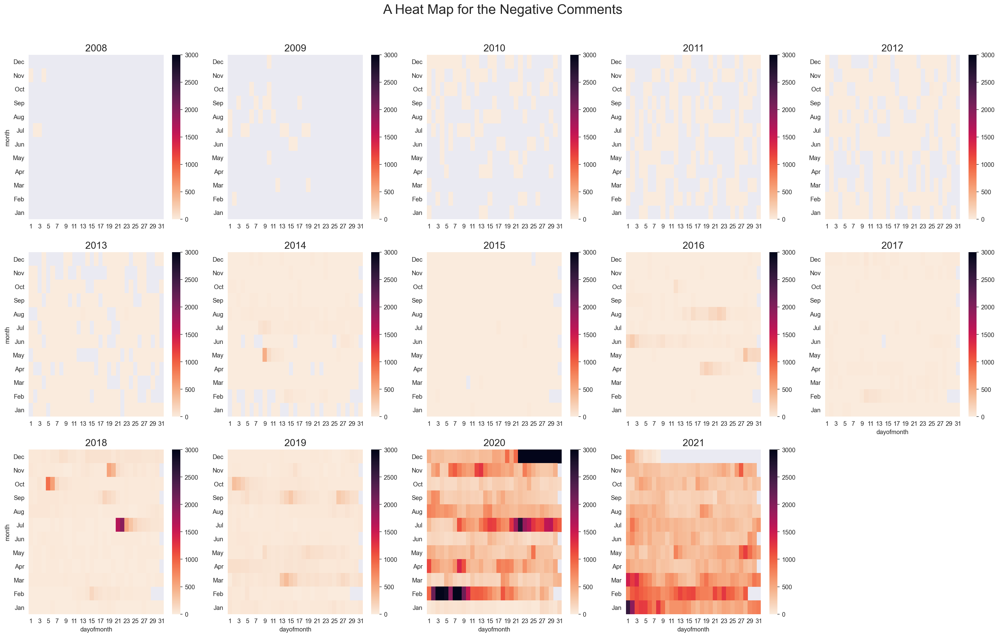

In [165]:
hate_daily = df_hate.groupby(['year', 'dayofmonth', 'month']).size().reset_index(name='ncomments')

print('\nNote: The Peaks on Feb, July, Dec 2020\n')
title = 'A Heat Map for the Negative Comments'
helpers.facet_heat(hate_daily, title, n_col=5, vmax=3000)

### Hate-Speech Comments Peak Dates

In [166]:
hate_dates = df_hate.groupby(['date']).agg({'text':'count', 'nlikes': 'sum', 'nreplies': 'sum'}).reset_index(
).rename(columns={'text':'ncomments'}).sort_values('ncomments', ascending=False)

hate_dates.head(15)

,date,ncomments,nlikes,nreplies
3320,2020-12-27,13061,175904.0,810.0
3316,2020-12-23,9885,240642.0,1409.0
3319,2020-12-26,9858,169395.0,569.0
3317,2020-12-24,8740,235942.0,970.0
3321,2020-12-28,8114,95178.0,646.0
3322,2020-12-29,6353,92417.0,731.0
2993,2020-02-04,5189,133405.0,3583.0
3323,2020-12-30,5002,81393.0,469.0
3318,2020-12-25,4607,91040.0,471.0
3315,2020-12-22,4014,119566.0,819.0


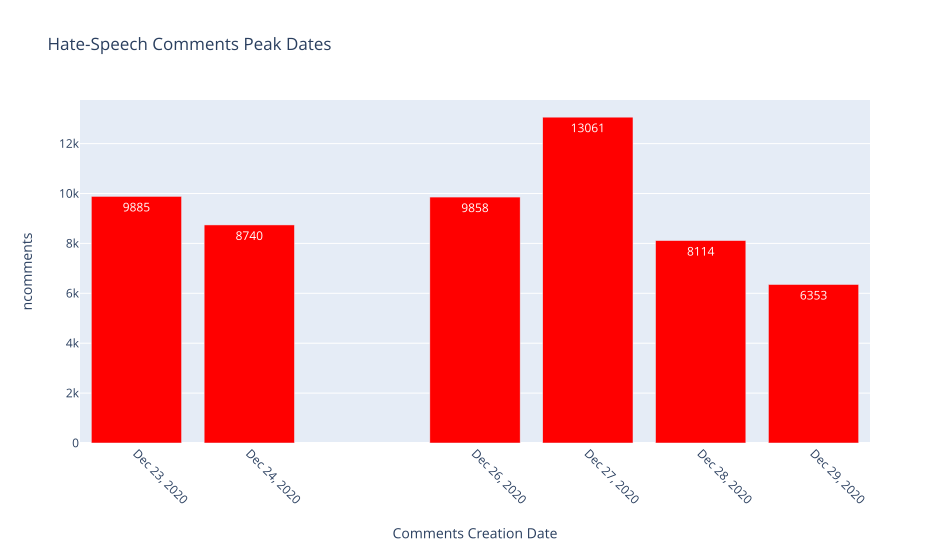

In [167]:
helpers.bar_peaks(hate_dates[['date', 'ncomments']].head(6), 
                  'Hate-Speech Comments Peak Dates')

# Most Repeated Hate-Speech Comments

In [168]:
df_hate.text.value_counts().head(60)

they won't believe you because you are a man she is not a victim                                                                               43276
that's crazy                                                                                                                                    5950
they won't believe you because you are a man amber heard she is not a victim                                                                    1595
they won't believe you because you are a man she is not the victim                                                                              1331
she is not a victim                                                                                                                             1109
they wont believe you because you are a man she is not a victim                                                                                 1019
they won't believe you because your a man she is not a victim                                             

In [169]:
df_hate.text.value_counts()[60:].head(60)

holy shit                                                                                   68
shit                                                                                        67
#fuckamberheard                                                                             64
that's crazy!!!                                                                             64
they won't believe you because you are a man amber heard is not a victim                    63
she is not the victim                                                                       63
they won't believe because you are a man she is not a victim                                60
she is a liar                                                                               59
they won't believe you because you are a man she is not the victim!                         58
amber sucks                                                                                 57
that's crazy                                      

# Top Users Commented with Hate-Speech keywords

In [170]:
df_hate.username.value_counts().head(15)

Lindsey Depp                            618
Julie Lea                               483
Bobby Campbell aka (The Oracle)         327
Rob's Rules                             325
Lorri Holder                            299
Crispy Co                               297
Christine Lloyd                         281
Well, well, well, how the turntables    245
Tania Haeussler                         238
k. _nf                                  226
Carmen Castro                           223
Wild Heart's Can't Be Tamed             219
The Amber Heard Playlist!!              213
The Killing Joke                        212
Jay A Errington                         211
Name: username, dtype: int64

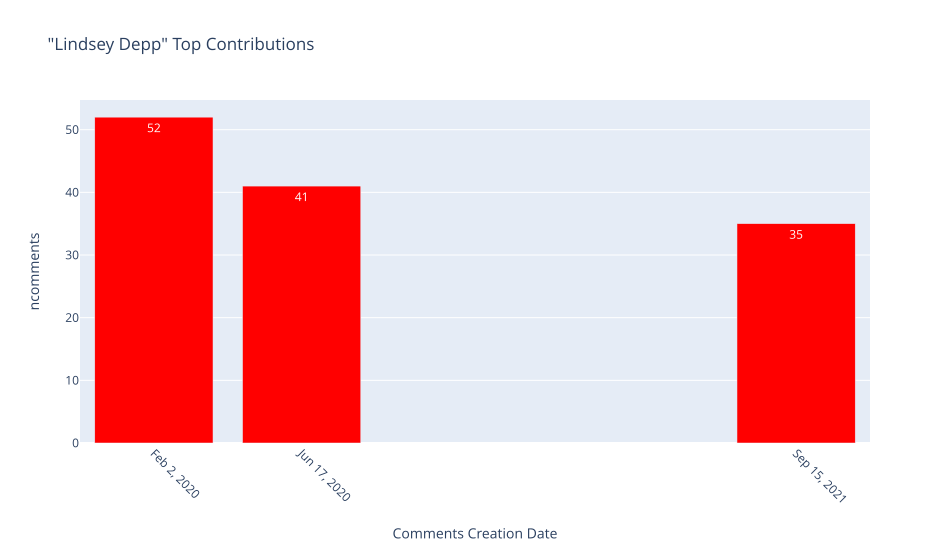

In [171]:
helpers.contr_peaks(df_comments, "Lindsey Depp", n=3, threshold=0)

In [172]:
df_hate.query(" username == 'Lindsey Depp' ").text.value_counts().head()

that's crazy                                                                                                                                                                                      7
that's crazy ًںکœ                                                                                                                                                                                 3
scamber ًں’©should never work in hollywood ever again                                                                                                                                             2
@snow18112000 my darling husband to be johnny depp's future wife to be rocky roxy totally agrees both ًں’© face her mentally hill father and her freeloading hoaxers all need jailing for life    1
perjury is a serious offence and can carry a hefty prison sentence                                                                                                                                1
Name: text, dtype: i

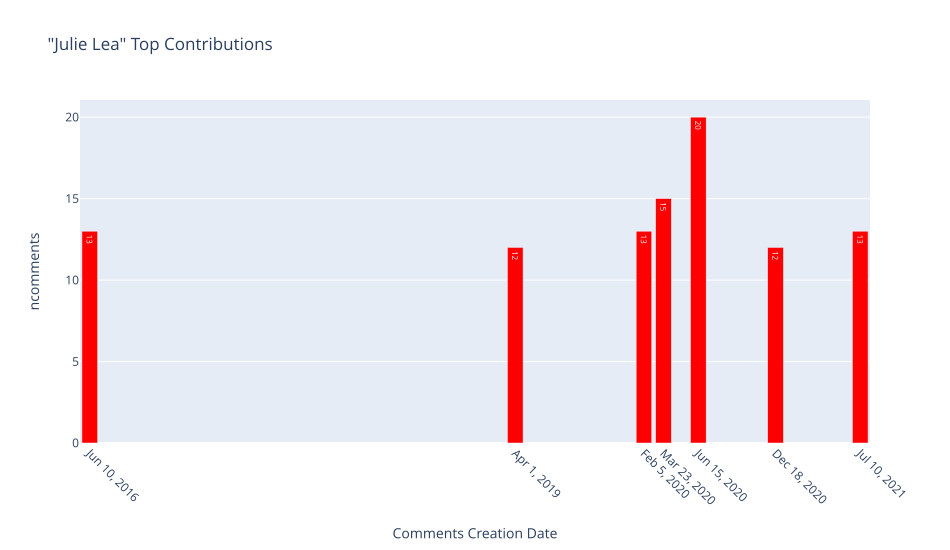

In [173]:
helpers.contr_peaks(df_comments, "Julie Lea", n=7, threshold=0)

In [174]:
df_hate.query(" username == 'Julie Lea' ").text.value_counts().head()

@been there nichol has ruled against rupert murdoch in the past nichol's son worked for dan wooten ( back to murdoch) & could have been fired & possibly blackballed out of the industry most parents want to protect their children i'd say that's a strong motivation for nichol to rule in favor of ngn forget amber heardshe has no power except what other's give her forget nichol people thought he sounded sick of ah during her testimony he was frustratedbecause she & her friends made him look more of a idiot josh drew is a outstanding witnessnichol i saw when nichol was ruling what evidence to toss & keep that musk was unimportant as a witnessbeing there the night before court 2016 (magic bruises) where the trial was going & why! rupert murdoch's son works formusk power trickles downnot up follow the rabbit hole & history & it's blatantly obvious murdoch has hated jd for years probably because his multi billion's & power can't buy him youth (he's 81 & looks 100) fame followers crazy fans etc

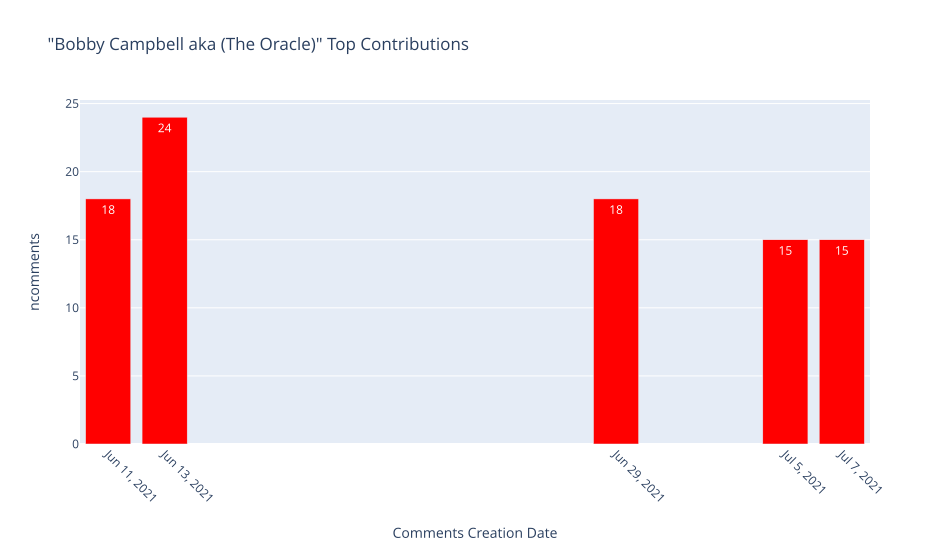

In [175]:
helpers.contr_peaks(df_comments, "Bobby Campbell aka (The Oracle)", n=5, threshold=0)

In [176]:
df_hate.query(" username == 'Bobby Campbell aka (The Oracle)' ").text.value_counts().head()

the world does not revolve around that malicious psychopathًںک                 2
see the world does not revolve around that malicious psychopathًںک ًں“©ًں“¤    2
i super hate amber heard with a burning passionًںک،ًں“©ًں“¤                    2
i ultra hate ah with a burning passionًںک،                                     2
this is bullshit ًں¤¦ًںڈ¾چâ™‚ï¸ڈ                                               2
Name: text, dtype: int64

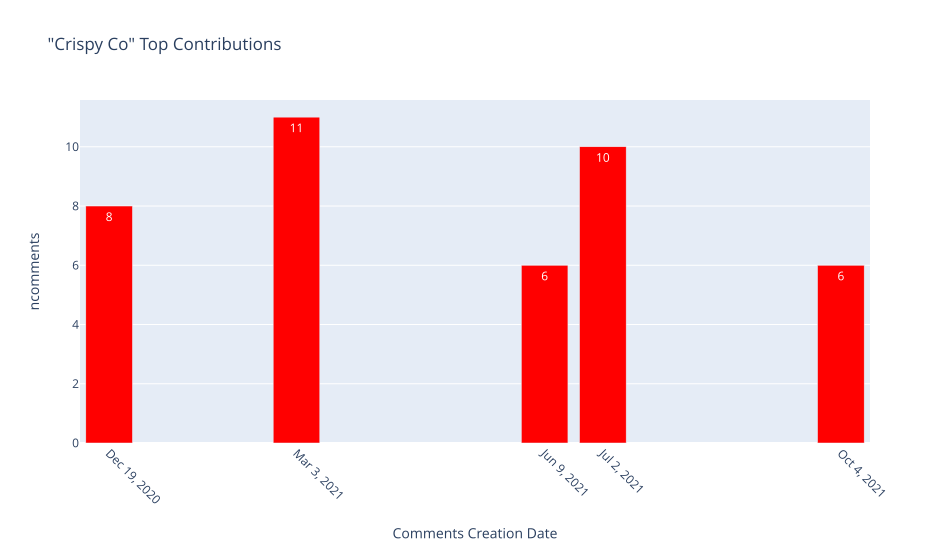

In [177]:
helpers.contr_peaks(df_comments, "Crispy Co", n=5, threshold=0)

In [178]:
df_hate.query(" username == 'Crispy Co' ").text.value_counts().head()

biggest liar in the world                                                                                                                                                                                                                                                                                                                                          2
abuser of the century                                                                                                                                                                                                                                                                                                                                              1
scamber turd is the one who ruined her career by lying about everything lying about the donations and lying about the abused when she was proven to be the abuser if she shut her mouth she would had get away with the 7 millions and no one will know her arrested record for abused her ex 

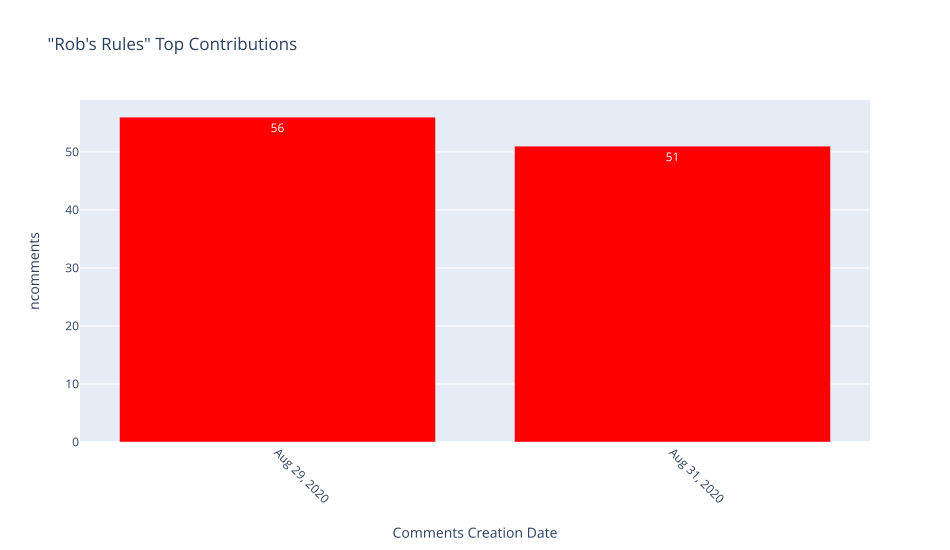

In [179]:
helpers.contr_peaks(df_comments, "Rob's Rules", n=2, threshold=0)

In [180]:
user = "Rob's Rules"
df_hate.query(" username == @user ").text.value_counts().head()

liza c not at all she didn't really think this through she should have took the private way out now it is getting exposed                                                                                                                                                                                                                                                                                                          1
it is all we can hope for that may not happen for over a year so we have to be patient hopefully he does get justice because he deserves it                                                                                                                                                                                                                                                                                        1
hello from the usa ! pleasure to meet you we try to cover what we can no one for sure knows the 100% truth but we base it on the evidence presented that is wh

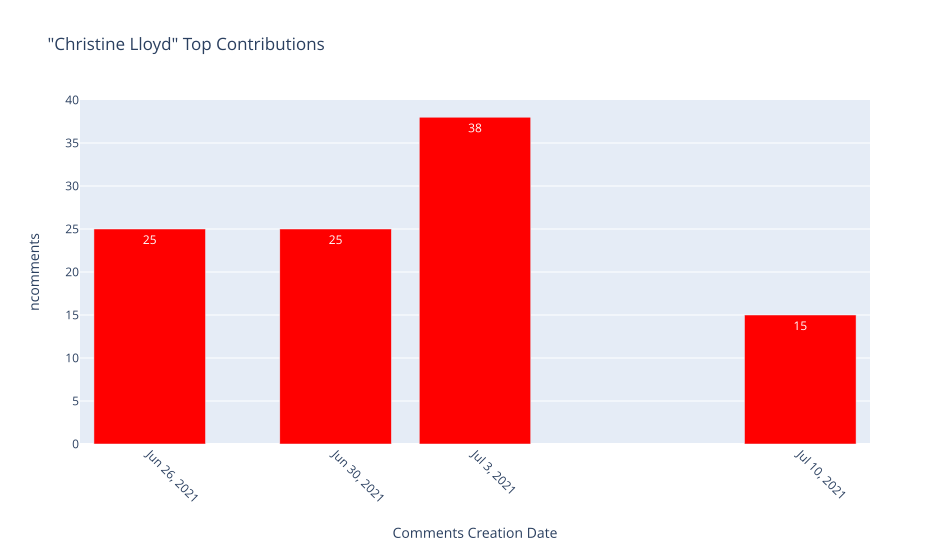

In [181]:
helpers.contr_peaks(df_comments, "Christine Lloyd", n=4, threshold=0)

In [182]:
df_hate.query(" username == 'Christine Lloyd' ").text.value_counts().head()

@kim orris well done! their shampoos have been slated as very poor quality by leading hair salons i read this some time back and my hairdresser refuses to use their hair products i will never use any of their products ever again or any of their companies ever! they truly have insulted us all over the world by standing by an evil abuser!!    1
@james she is a known self confessed abuser and liar who set out to ruin an innocent mans life nobody should support anything this disgusting woman is in                                                                                                                                                                                              1
@garreon lefay or he was manipulated by the turd as well this is what toxic narcissists are so good at!! obviously not a very professional doctor at all                                                                                                                                                              

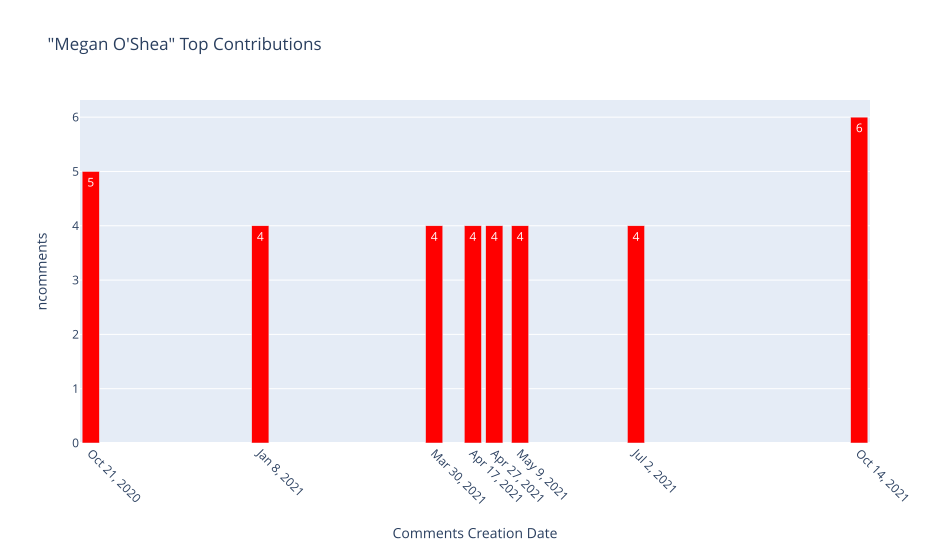

In [183]:
helpers.contr_peaks(df_comments, "Megan O'Shea", n=8, threshold=0)

In [184]:
user = "Megan O'Shea"
df_hate.query(" username == @user ").text.value_counts().head()

i really hope they get her for perjury she deserves to go to jail                                              3
i really hope they get ah for perjury she deserves to go to jail                                               2
i really hope johnnydepp gets his appeal so he can get his justice that he deserves                            1
because amber is big liar and johnny is amazing and telling the truth standing up for deserves this win        1
i really hope ah goes to jail because of all she done especially to johnny depp he never deserved this ever    1
Name: text, dtype: int64

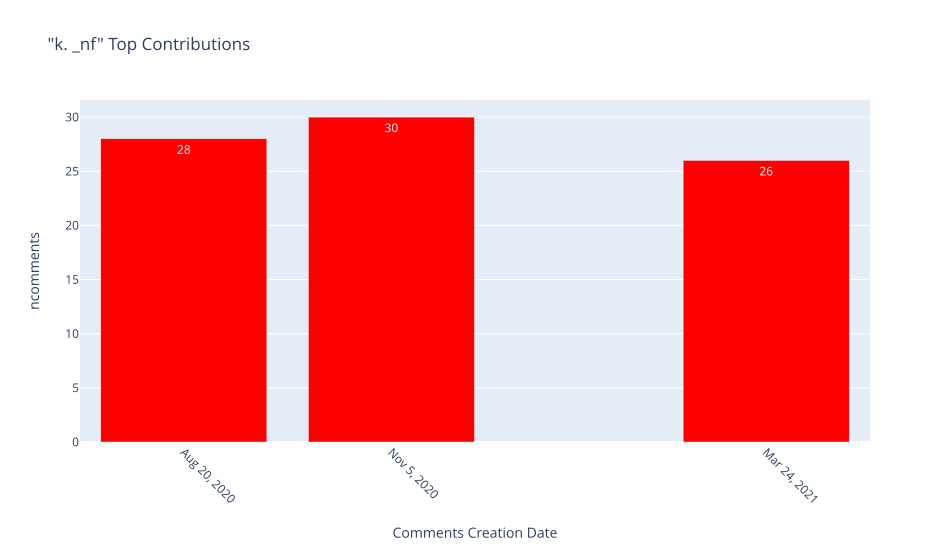

In [185]:
helpers.contr_peaks(df_comments, "k. _nf", n=3, threshold=0)

In [186]:
df_hate.query(" username == 'k. _nf' ").text.value_counts().head()

psycho jezebel girl #justiceforjohnnyًں™ڈ pray                                                                              11
their counselor confirmed amberت»s a narcissistic sociopath                                                                  9
she is going down in history as the craziest psycho and delusional woman                                                     9
psycho jezebel demon possessed amber pray for johnnys justice                                                                7
*amber is mental and creepy* schools should study her: sociopathy psychopathy narcissism borderline personality disorder     6
Name: text, dtype: int64

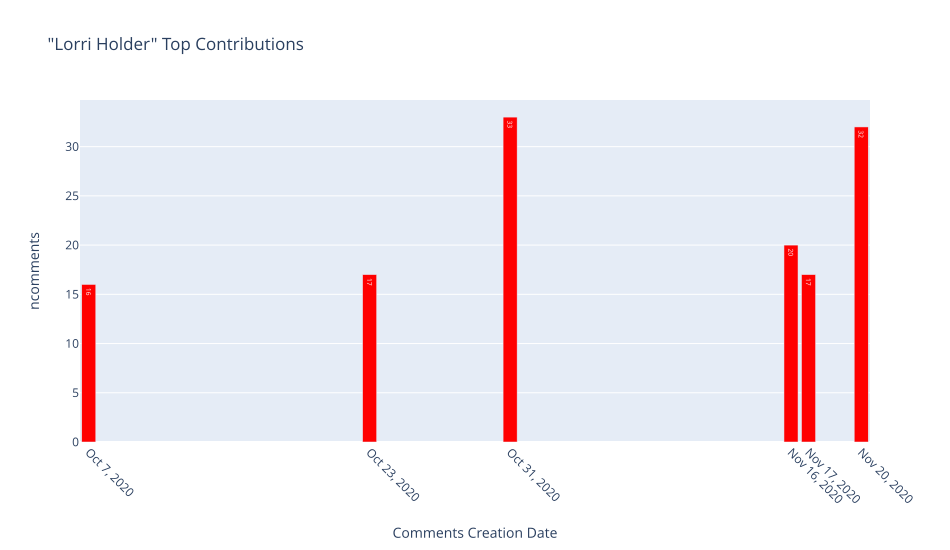

In [187]:
helpers.contr_peaks(df_comments, "Lorri Holder", n=6, threshold=0)

In [188]:
df_hate.query(" username == 'Lorri Holder' ").text.value_counts().head()

#justiceforjohnnydepp #fireamberheard                                                                                                                              5
lies lies and more lies                                                                                                                                            3
she lies about everything                                                                                                                                          2
so many lies how many does she get away with come on justice has to come out now she is done!                                                                      1
even in the tmz tape he is very mad and beats up the kitchen so from someone who has been around abuse she sure doesn't look scared of him at all in that tape!    1
Name: text, dtype: int64

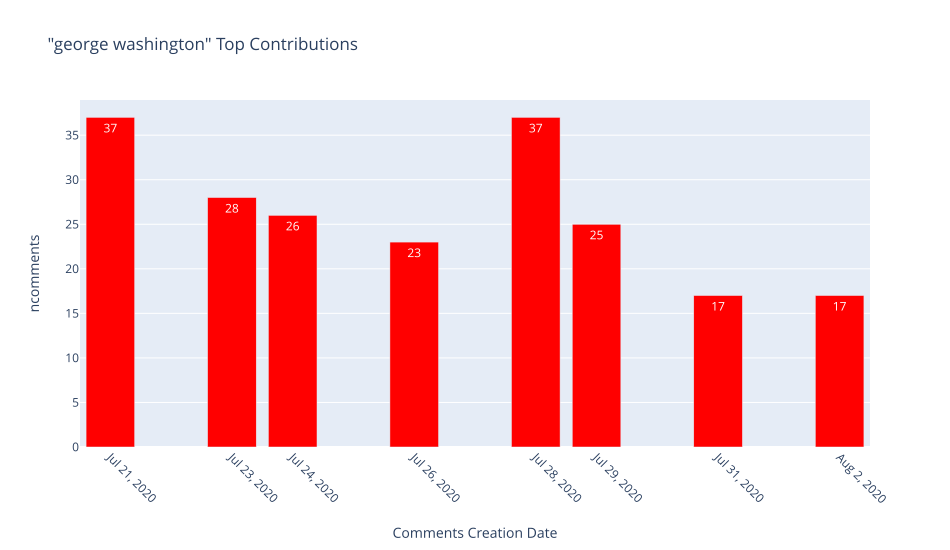

In [189]:
helpers.contr_peaks(df_comments, "george washington", n=8, threshold=0)

In [190]:
df_hate.query(" username == 'george washington' ").text.value_counts().head()

seeing through lies and delusions; amber heard's deposition detangled! https://wwwyoutubecom/watch?v=0sndq4ccmkm                                                                                                                                                                                                                                                                                                                                        8
details on amber heard's domestic abuse arrest revealed https://wwwyoutubecom/watch?v=81mnraxlbee as many of you might know by now amber heard has a reported history of domestic violence including a time when she was arrested for allegedly assaulting her ex wife tasya van ree at seattle tacoma international airport in 2009 now the details of the incident are finally getting attention in the media                                         7
even funnier she said i'd rather not be in courtwell thing is amber and her team have requested to the judge for her

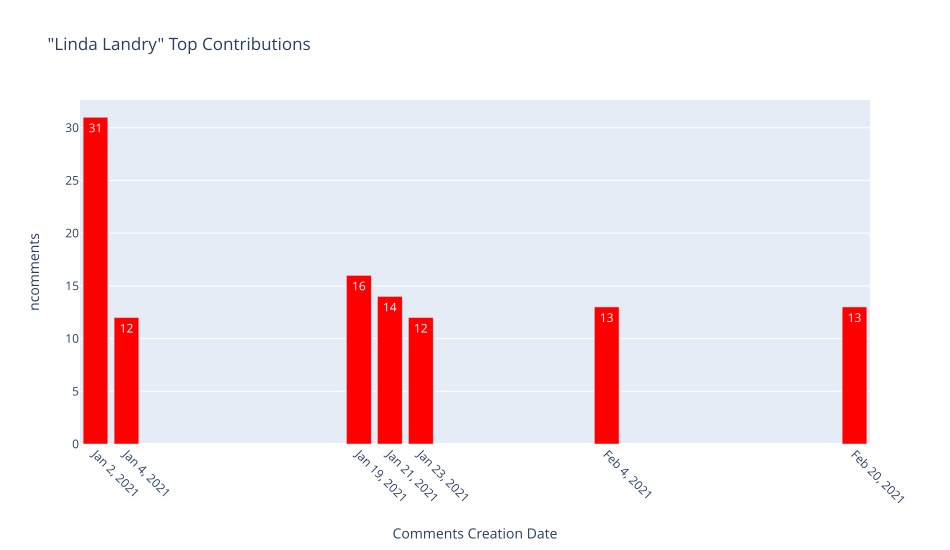

In [191]:
helpers.contr_peaks(df_comments, "Linda Landry", n=7, threshold=0)

In [192]:
df_hate.query(" username == 'Linda Landry' ").text.value_counts().head()

fire the proven abuser or millions will boycott the movie                                                                                                                                                                                        1
fire amber heard the public hates her                                                                                                                                                                                                            1
he's an ungrateful grifter johnny supported him for years and now he's supporting ah's lies i wonder if ah gave him some of the 7 million in her divorce settlement that she never donated to charity maybe he was the charity she donated to    1
she is disgusting she is an abuser and nobody wants to hear her speak about anything least of all human rights                                                                                                                                   1
her transactivism how could 

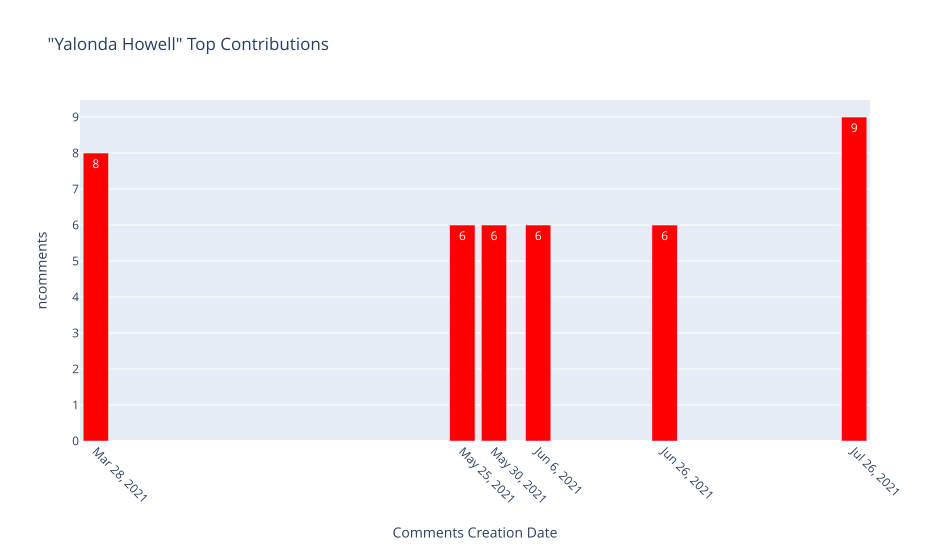

In [193]:
helpers.contr_peaks(df_comments, "Yalonda Howell", n=6, threshold=0)

In [194]:
df_hate.query(" username == 'Yalonda Howell' ").text.value_counts().head()

that's crazy                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

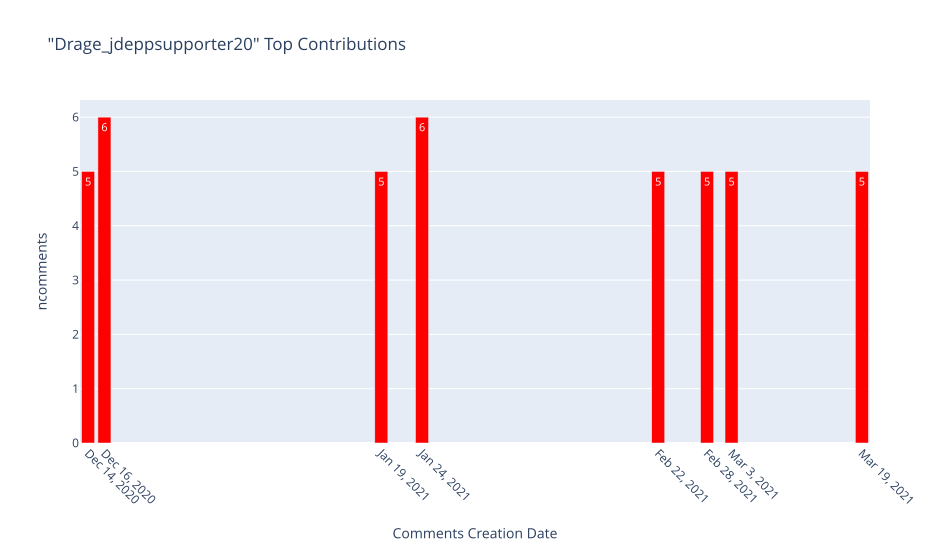

In [195]:
helpers.contr_peaks(df_comments, "Drage_jdeppsupporter20", n=8, threshold=0)

In [196]:
df_hate.query(" username == 'Drage_jdeppsupporter20' ").text.value_counts().head()

crazy b_ _ _ _ thats a new low                                                                    1
come back to australia ah stay in our jails you broke the law you abused johnny jail jail jail    1
he looked so sad unhappy he never deserved the way she treated him                                1
johnny deserves support and respect                                                               1
saw that on our news yeah justice for jdyes that guy cracked the shits lol                        1
Name: text, dtype: int64

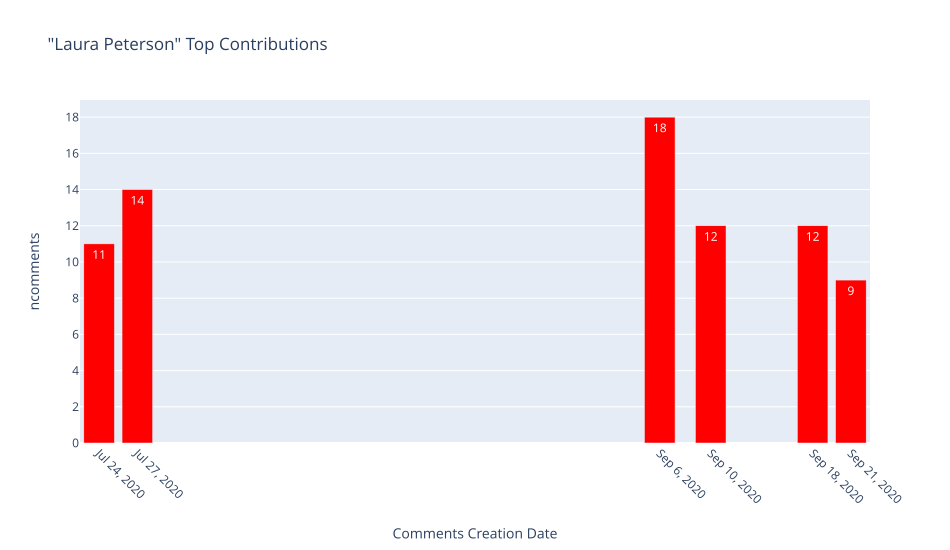

In [197]:
helpers.contr_peaks(df_comments, "Laura Peterson", n=6, threshold=0)

In [198]:
df_hate.query(" username == 'Laura Peterson' ").text.value_counts().head()

he deserves so much better than her hopefully he is able to heal from the trauma caused by this experience the studios need to give him back his roles and she needs to apologize to him publicly for destroying him                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               1
ver

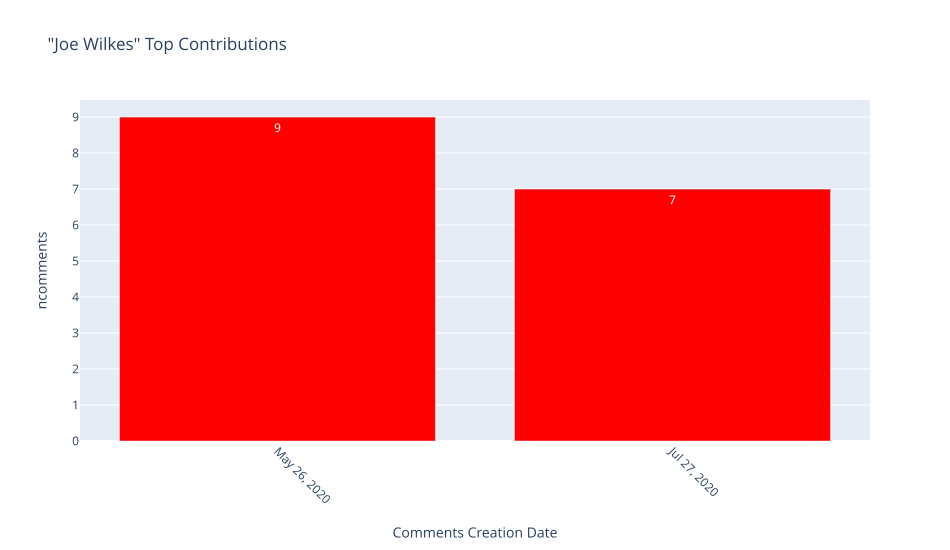

In [199]:
helpers.contr_peaks(df_comments, "Joe Wilkes", n=2, threshold=0)

In [200]:
df_hate.query(" username == 'Joe Wilkes' ").text.value_counts().head()

the media is beyond stupid they post anything she says by now you would think no one would believe the little girl crying wolf i'm glad she is finally been forced to prove something she hasn't proved a single thing except she can act like a victim even though she is not acting like a dv victim at all she needs to read up on what real victims are like                             1
getting closer by the day to a total scamber melt down i can't wait to see it                                                                                                                                                                                                                                                                                                                1
good amber can't get out of it by using any of those excuses she blatantly lies about everything                                                                                                                                          

<br>

<a id='same'></a>
>## Same Text Same Date
> <ul>
 <li><a href="#threat_comments">Threat Comments</a></li>
 <li><a href="#hate_speech">Hate-Speech Comments</a></li>
 <li><a href="#same"><b>Same Text Same Date</b></a></li>
 <li><a href="#primarly">Primarly Text Investigations</a></li>
 </ul>

In [201]:
df_threat.head(1)

,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
14635,_xjy6EuMPGA,K1N0GaI2K6E78Ypr67LEJjYE4qQ,UgwxSz7tqzqHrDv24Lp4AaABAg,i'm a small town girl and at my school you kne...,Zukosgirl251,UCJ4AvN0j6a6EY6cpBNJ864A,0.0,2010-01-14 03:57:49+00:00,2010-01-14 03:57:49+00:00,0.0,NaN,comment,none,none,none,2010,2010-01-14,Jan,14,3


In [202]:
# print('\nThe Amplifications in the counts and number of likes on #justiceforjohnnydepp is quite obvious!!')
df_same = df_threat.groupby(["text", "date"]).agg({'comment_id':'count', 'nreplies':'sum', 'nlikes':'sum'}).reset_index()
df_same.rename(columns={'comment_id': 'ncomments'}, inplace=True) 
df_same.sort_values(["ncomments", 'date'], ascending=[False, True]).head(60)


,text,date,ncomments,nreplies,nlikes
38692,shes using the child to avoid jail and get sup...,2021-07-06,28,0.0,14.0
44536,this stupid crazy woman should get to jail!!! ...,2021-10-17,17,2.0,17.0
42894,they have proof that she was the one being vio...,2021-09-09,16,5.0,21.0
43356,this case is going to be exemple for all men w...,2020-11-15,15,0.0,9.0
31316,one pays for one's decisions he got what he de...,2021-10-31,12,0.0,3.0
40274,thanks must be given to the sun for ensuring t...,2020-08-15,11,3.0,5.0
14302,hope his team will be loyal until the end as r...,2020-11-15,11,0.0,2.0
40286,thanks to the sun for ensuring the entire worl...,2020-08-15,10,0.0,3.0
42893,they have proof that she was the one being vio...,2021-09-09,10,3.0,11.0
11665,give johnny depp what he 100% deserves jack sp...,2020-12-14,9,4.0,2.0


In [203]:
df_same.text.value_counts().head(20)

she should be in jail                   47
she needs to go to jail                 35
i hope she goes to jail                 31
put her in jail                         27
she deserves it                         24
she should go to jail                   23
hope she goes to jail                   16
jail                                    16
she deserves jail time                  15
i hope she gets what she deserves       15
they deserve each other                 14
she should be in prison                 14
she needs to be in jail                 14
johnny deserves justice                 13
he deserves better                      13
go to hell                              13
#justice for johnny prison for heard    12
amber heard should be in jail           11
burn in hell                            10
she belongs in jail                     10
Name: text, dtype: int64

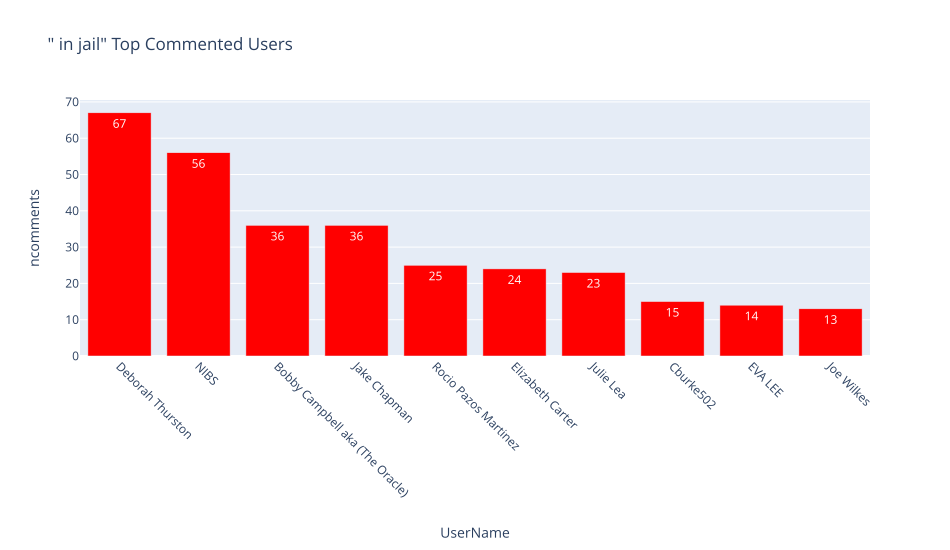

In [204]:
# importlib.reload(helpers)
helpers.users_all_peaks(df_comments, ' in jail', n=10, threshold=0)

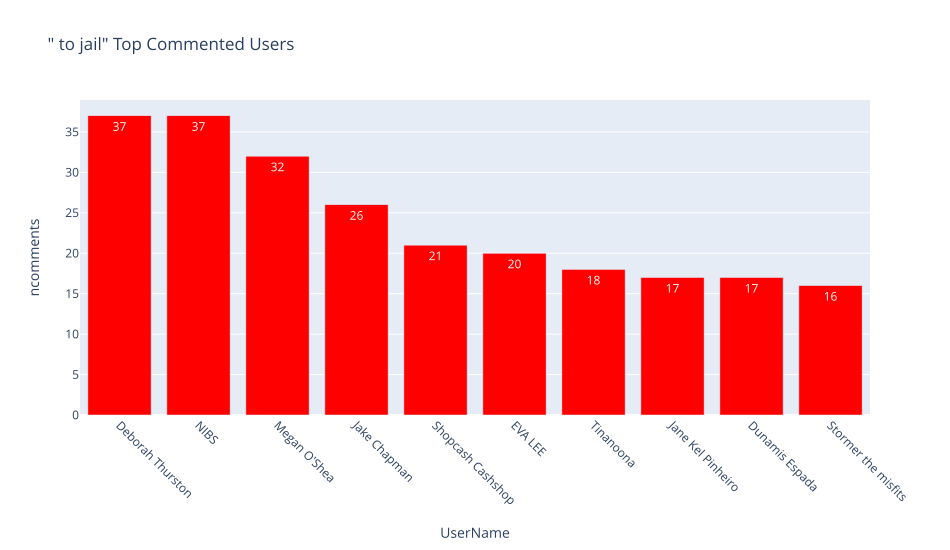

In [205]:
helpers.users_all_peaks(df_comments, ' to jail', n=10, threshold=0)

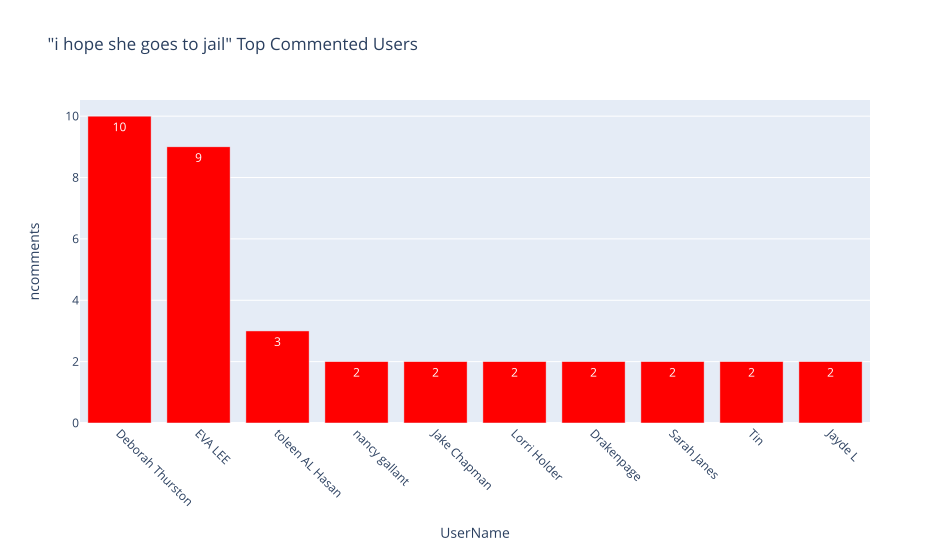

In [206]:
helpers.users_all_peaks(df_comments, 'i hope she goes to jail', n=10, threshold=0)

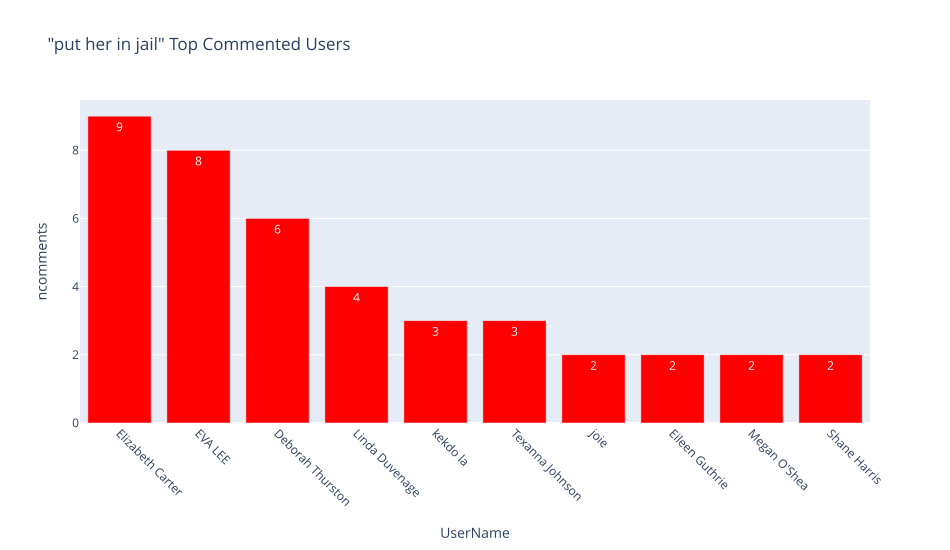

In [207]:
helpers.users_all_peaks(df_comments, 'put her in jail', n=10, threshold=0)

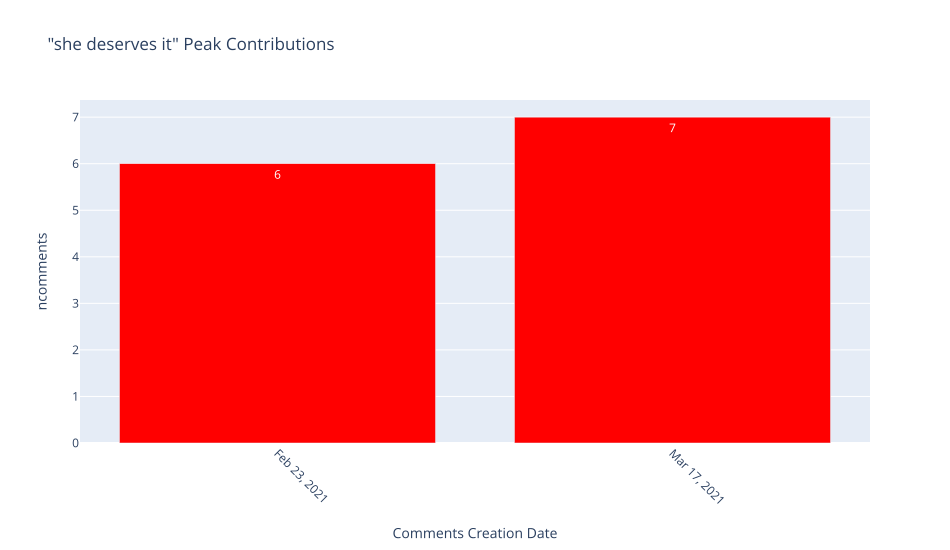

In [208]:
helpers.text_all_peaks(df_comments, 'she deserves it', n=2, threshold=0)

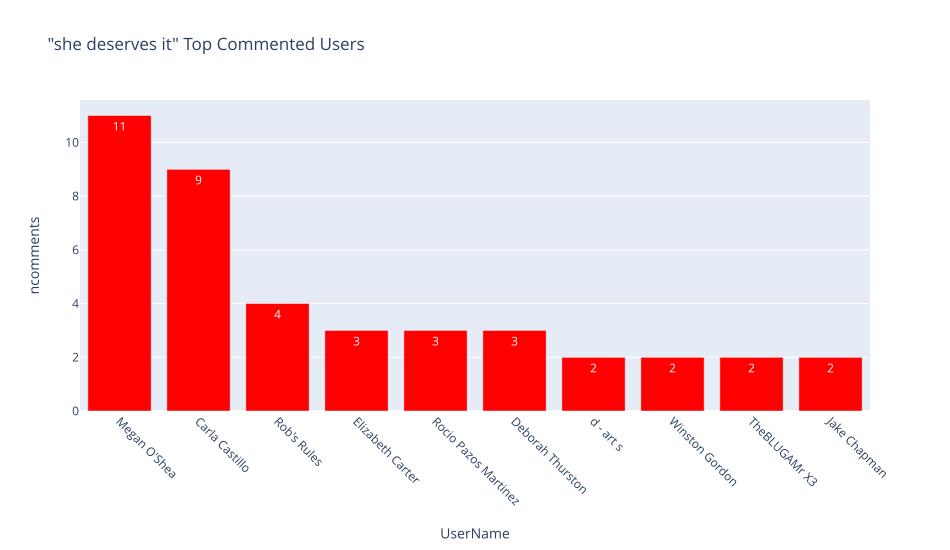

In [209]:
helpers.users_all_peaks(df_comments, 'she deserves it', n=10, threshold=0)

### Text Contains "jail" --> 17962

In [210]:
df_all_jail = df_threat[df_threat.text.str.contains('jail')]
print(f'{df_all_jail.shape[0]} contributions, on {df_all_jail.video_id.nunique()} Videos, made by {df_all_jail.username.nunique()} Users')
df_all_jail.head(2)


17962 contributions, on 2113 Videos, made by 12977 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
14635,_xjy6EuMPGA,K1N0GaI2K6E78Ypr67LEJjYE4qQ,UgwxSz7tqzqHrDv24Lp4AaABAg,i'm a small town girl and at my school you kne...,Zukosgirl251,UCJ4AvN0j6a6EY6cpBNJ864A,0.0,2010-01-14 03:57:49+00:00,2010-01-14 03:57:49+00:00,0.0,NaN,comment,none,none,none,2010,2010-01-14,Jan,14,3
14606,_xjy6EuMPGA,2nuxmyXSEz38jm4nHvMhHRjCRtM,UgzN6JCgUO9DPSY-g7V4AaABAg,i'm from a small town and everyone in my city ...,Zukosgirl251,UCJ4AvN0j6a6EY6cpBNJ864A,0.0,2010-04-15 03:26:22+00:00,2010-04-15 03:26:22+00:00,0.0,NaN,comment,none,none,none,2010,2010-04-15,Apr,15,3


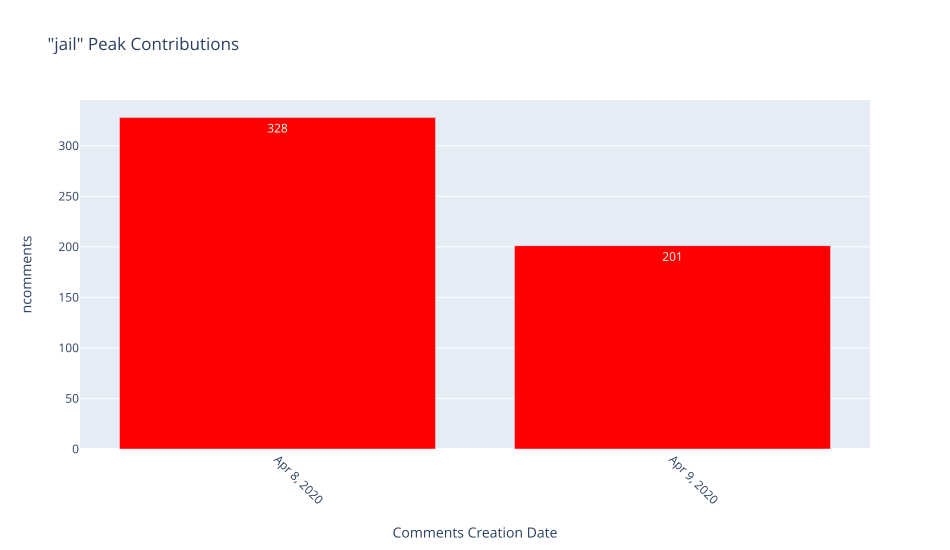

In [211]:
helpers.text_all_peaks(df_comments, 'jail', n=2, threshold=0)

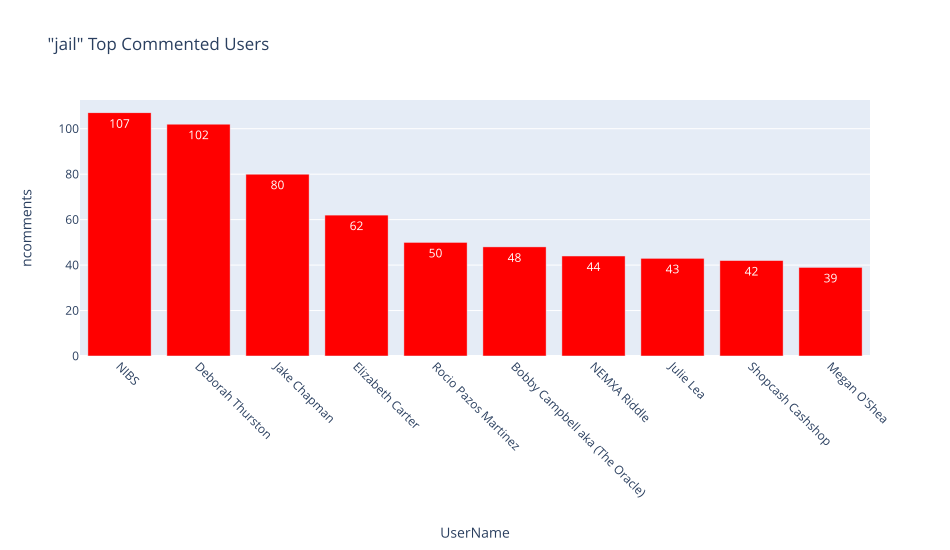

In [212]:
helpers.users_all_peaks(df_comments, 'jail', n=10, threshold=0)

In [213]:
df_all_hell = df_threat[df_threat.text.str.contains('go to hell')]
print(f'{df_all_hell.shape[0]} contributions, on {df_all_hell.video_id.nunique()} Videos, made by {df_all_hell.username.nunique()} Users')
df_all_hell.head()


474 contributions, on 248 Videos, made by 430 Users


,video_id,comment_etag,comment_id,text,username,author_ch_id,nlikes,p_dtime,u_dtime,nreplies,moderation_status,comment_reply,parent_id,author_ch_url,author_profile_image,year,date,month,dayofmonth,hour
13952,jouaan70m4c,eS-3ng3MzVlted4qG-iwcknAxfs,UgwwHInnhi42jZa74qp4AaABAg,i wanna see dat !!! i wanna see day !!gives n...,mintgumdropz1,UCqwPbHag14nV33OiZwUJJrw,1.0,2011-02-21 16:00:32+00:00,2011-02-21 16:00:32+00:00,0.0,NaN,comment,none,none,none,2011,2011-02-21,Feb,21,16
14366,ZCbTICNAwxM,P3U5YIUbPtRjcHTeOwOcqxZUUaU,UgzTxpfl932bj11xreF4AaABAg,@x14screamersis context context context 1 cor ...,shoeman26,UCGzMM0XZOfSBRhEaoEpAK0w,0.0,2011-03-08 05:05:10+00:00,2011-03-08 05:05:10+00:00,0.0,NaN,comment,none,none,none,2011,2011-03-08,Mar,8,5
12085,iGS8Vhe2kn4,n0GeDLzgNfeOWZedKmw-bchQrGU,UgyrNYQQnFQBj6STEO54AaABAg,@guitargal595 then why do they waste time with...,Justin Robles,UCSCToR7YMfBNLjnmGVRTn5w,0.0,2011-10-01 03:11:36+00:00,2011-10-01 03:11:36+00:00,0.0,NaN,comment,none,none,none,2011,2011-10-01,Oct,1,3
9524,ytIfSuy_mOA,PDk63Tm6v57jAulpPnhX8JlZntc,UgwRKqlxzLHyQIWEEVl4AaABAg,you can still do something very useful with fo...,concious caution,UCoQhes_Ug46prpzHwE4otdA,0.0,2012-10-26 07:43:14+00:00,2012-10-26 07:43:14+00:00,0.0,NaN,comment,none,none,none,2012,2012-10-26,Oct,26,7
10582,rB7ONnfIjaI,5K52zqa4lUhpwKDJsCxSKqItlrY,UgwntPyFh7gvfN5A3pN4AaABAg,fucking douchbag she is beautiful the way she ...,Rhiannon Rose Malfroid,UCiH8h2QPerstoDWsVD0-OVg,0.0,2012-11-25 04:20:32+00:00,2012-11-25 04:20:32+00:00,0.0,NaN,comment,none,none,none,2012,2012-11-25,Nov,25,4


In [214]:
df_all_hell.text.value_counts().head(60)

go to hell                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

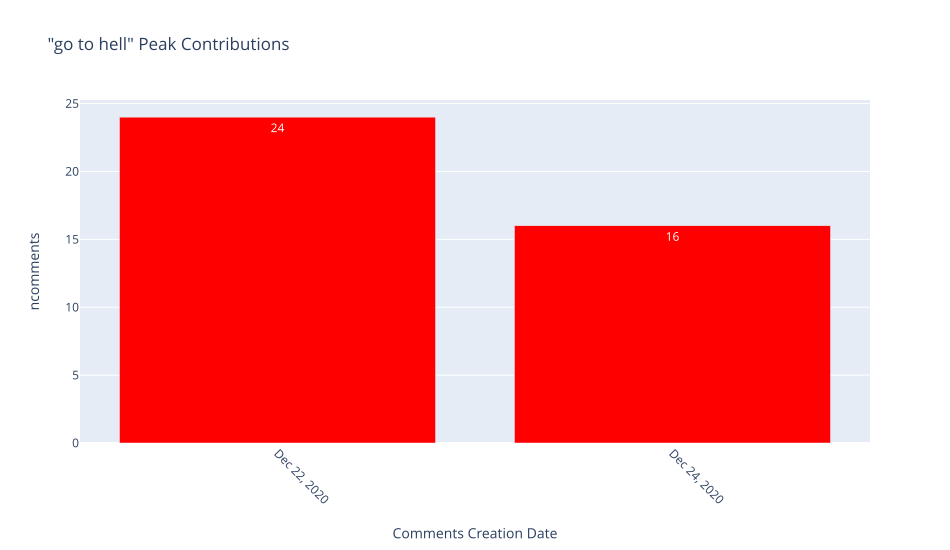

In [215]:
helpers.text_all_peaks(df_threat, 'go to hell', n=2, threshold=0)

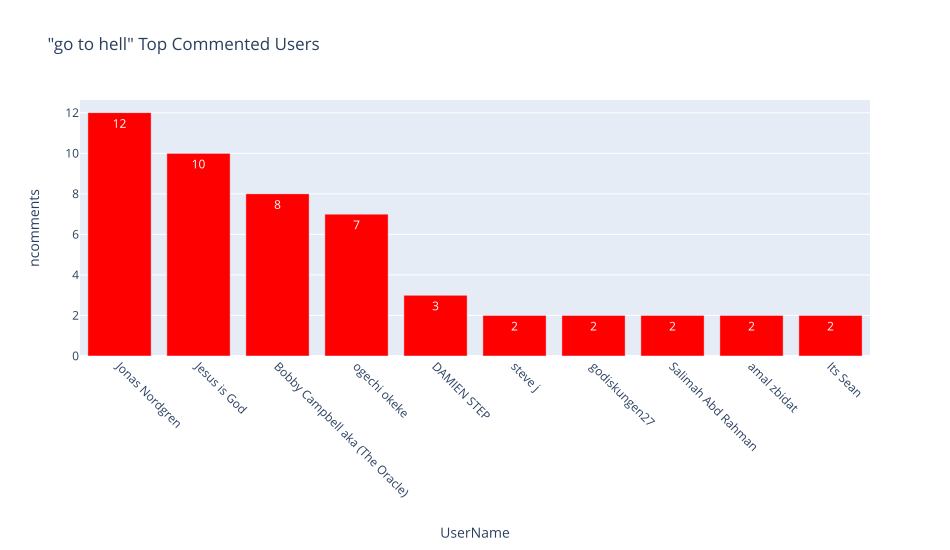

In [216]:
helpers.users_all_peaks(df_threat, 'go to hell', n=10, threshold=0)

<a id='primarly'></a>
> ## Primarly Text Investigations
> <ul>
 <li><a href="#threat_comments">Threat Comments</a></li>
 <li><a href="#hate_speech">Hate-Speech Comments</a></li>
 <li><a href="#same">Same Text Same Date</a></li>
 <li><a href="#primarly"><b>Primarly Text Investigations</b></a></li>
 </ul>

## NOTE: "These areas are extracted from the text to help in extracting the keywords to be used in the analysis"

- @bella mel no he yelled kys fuck you amber
- kill heard off in aquaman her death would certainly be a popular gif on twitter
- the best thing would be to kill heard's mera character in the most humiliating way possible in the film zucker bros style
- one lie how totally change his life mental torturephysical violencecost lot of moneyloose prestige that earned from years struggleloose his best movie jacks sparrownearly loose finger etc if someone kill her still it is not provide real justice to him #boycuttamber #justiceforjohnnydeep
- terrible person she should just kill her self
- amber lied children died!
- i gave this a like instantly i love the song and respect him i hope all the bullies in the world go die in hell! well at least i hope they don't go to heaven ever #respect 
- the 27k who liked can literally go die in a fire with heard 
- if you disliked this go die in a hole
- amber should never been born that witch thinks she can take johnny down then she is really insane that dirty witch needs to just go die somewhere!!! 
- best song ever! not suprised this song brought alot of hating bullies! go die negative people  
<br> 
<br>  
- death to fascists (amber heard included)
- never!!! death to the slandering tabloid media!!! expose the scums!!!
- death to mera!!!
- death to all narcissistic psychopaths she is a real psycho just take a look at her empty sight god bless johnny depp 
- yes! social death to anybody not supporting johnny
- professional death to a turd
- yes i use to like her too now she is death to me
- death to femnazis
- i know im not the only that wishes death to those people on those amber alerts man f that baby! stop sending me messages!
- she is a walking nightmare for domestic violence!! she is going to cause police & courts not to believe them & that could result in massive injuries &/or death to a real victim!!
- amber heard is laughing at victims of domestic violence we won't watch anything she is in the stand is one of my favorite stephen king stories she has ruined it she will be the kiss of death to everything she touches #justiceforjohnnydepp
- amber turd heard belongs to the same place as harvey weinstein and larry nasaar anyone who can get away with adultery mutilation falsification of rape emotional and sexual abuse and possibly attempted murder for 3 fucking years scot free while blaming it on the victim is extremely dangerous to the society i mean she already has a history of physically abusing her ex gf in the past and got thrown into jail and she cleverly used her mother's death to gain sympathy points as well as the feminist propoganda to gain followers she also possibly has elon musk in a vice by falsification of sexual assault 
- death to the media
- johnny depp should fight to the death to clear his name screw amber
- has anyone seen that black mirror episode where there are the robot bees and the #deathto yeah well i would gladly say #deathto amber heard even if it means i would die the same way   
- yeah he is so unlucky he no longer gets beaten up by a psychotic bitch
- she was the reason i wanted to kill the half population of world like her don't blame me

In [217]:
df_amber = df_comments[df_comments.text.str.contains('amber')]

In [218]:
# # KYS is an internet acronym standing for “kill yourself
# threat_text = {' death', ' death ', 'burn', 'burninhell', 'burn in hell', 'kys', ' go kys', ' raped', 'get raped', 
#                'go die', 'diecunt', 'go to hell', 'gotohell', 'beaten', 'beaten up', 'deserves it', 'kill amber',
#                'kill her', 'deathtoamber', 'death to amber', 'to death amber', 'she’s trying to kill him',
#                'kill yourself', ' deserves', 'ambich'}

In [219]:
threat_text = {' go die', 'die cunt', 'kill heard', 'kill her', 'kill amber', 'kys fuck you amber', 'deathto', 
               'death to fascists', 'death to a turd', 'death to mera', 'death to all narcissistic', ' hell',
               'death to anybody not supporting johnny', 'death to femnazis', 'kiss of death', 'burn', 
               'deserve', 'death amber', 'go kill yourselves', 'kill all the people who disliked'}

In [220]:
df_amber[df_amber.text.str.contains('is criminal')].text.value_counts().head(60)

how do you ever come back in life after being exposed and inflicted upon by someone like amber heard? i can only sincerely hope pray and wish for johnny depp that he is able to prove beyond any doubt what amber heard is and what she set out to do which is destroy him from the inside out it is criminal but oh so very difficult for anyone to prove what a genuinely horrible position to be in to be at the hands of someone so cruel twisted and mentally ill and have their attention and thereby be inflicted upon all because you fell in love with someone who turns out to be completely different to what you thought you knew about them thereby the grace of god goes i i really hope he can come back from this as the world misses out on the talent and pleasure that johnny depp brought to so many of us and really that fades into insignificance when you think how johnny depp must feel as a result of what he has been through at the hands of someone like amber heard i admit i feel so very very sorry he

In [221]:
df_amber[df_amber.text.str.contains('is criminal')].text.value_counts().head(60)

how do you ever come back in life after being exposed and inflicted upon by someone like amber heard? i can only sincerely hope pray and wish for johnny depp that he is able to prove beyond any doubt what amber heard is and what she set out to do which is destroy him from the inside out it is criminal but oh so very difficult for anyone to prove what a genuinely horrible position to be in to be at the hands of someone so cruel twisted and mentally ill and have their attention and thereby be inflicted upon all because you fell in love with someone who turns out to be completely different to what you thought you knew about them thereby the grace of god goes i i really hope he can come back from this as the world misses out on the talent and pleasure that johnny depp brought to so many of us and really that fades into insignificance when you think how johnny depp must feel as a result of what he has been through at the hands of someone like amber heard i admit i feel so very very sorry he

In [222]:
df_amber[df_amber.text.str.contains('trial')].text.value_counts().head(60)

johnny depp stood no chance in the uk defamation trial against the sun from the beginning justice nicol was a lawyer championing for freedom of press for the times which is owned by murdock who employees his son the judge's son works with defendant dan wootton this combined with other connections between the judge and amber heard set johnny depp up to fail from the beginning that's why                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [223]:
df_amber[df_amber.text.str.contains('murder')].text.value_counts().head(60)

business insider johnny depp reportedly drank heavily and was constantly late on the new 'pirates' movie set jason guerrasio may 10 2017 10:04 am facebook icon the letter f email icon an envelope it indicates the ability to send an email link icon an image of a chain link it symobilizes a website link url twitter icon a stylized bird with an open mouth tweeting linkedin icon the word in fliboard icon a stylized letter f more icon three evenly spaced dots forming an ellipsis: close icon two crossed lines that form an 'x' it indicates a way to close an interaction or dismiss a notification johnny depp's unorthodox behavior has helped make him one of the biggest movie stars in the world but it also appears to be a serious risk to his career often balancing outlandish roles ” as gonzo journalist hunter s thompson in fear and loathing in las vegasin his numerous tim burton movies ” with being the face of a giant blockbuster franchise in disney's pirates of the caribbeandepp has been seen as

- amber heard well pay for her crimes if she wants assault she well get it

In [224]:
df_amber[df_amber.text.str.contains('crime')].text.value_counts().head(60)

i heard russian women r gold diggers but amber is unique! like those bugs on pigeons that stick like hell& suck up the prey until it finds a better one she even plants evidence against the victim to get more or stick more! so desperate! i don't like drunk junkies like dep but this is ridiculous then she goes to elon musk and after a little acquaintance he offers her full security?! i mean knowing someone for a short time unless u know elon knows russian & his tesla has great ties with putin?! something strange is going on men should beware women like herall end up in deep mess elon & many celebs rich powerful famous g7g20royalsetcall over the world!put our lives in danger cyber stalking us on wifi hidden cams since 2015 invited by trump & obama supporting a russian iranian drug dealer trafficking gang junkie father abusive relatives ir offcls(in iran and usa) crimes &abuse against us but never offered us full security! they wasted 5 years of our lives supporting those who have been att

In [225]:
df_comments[df_comments.text.str.contains('heard kidnap')].text.value_counts().head(60)

it takes two people to cheat it's not like amber heard kidnapped depp and forced him to divorce his wife she is a terrible person but he's no angel either mary elizabeth winstead didn't make ewan mcgregor leave his family either that was his choice    1
Name: text, dtype: int64

In [226]:
# df_comments[df_comments.text.str.contains('heardkidnap')].text.value_counts().head(60)

In [227]:
# df_comments[df_comments.text.str.contains('kidnapamber')].text.value_counts().head(60)

In [228]:
# df_comments[df_comments.text.str.contains('kidnap amber')].text.value_counts().head(60)

In [229]:
df_amber[df_amber.text.str.contains('kidnap')].text.value_counts().head(60)

intermittent suicidal nihilism is standard operating procedure anytime an half way capable sociopath wants to manipulate their victim and law enforcement to get whay they want and nothing is off the table in their predatory minds especially when it's a women on contemporary otherwise civilized society i've experienced this personally several times this one chick was literally forcing me into a position to where lethal force was authorized if not a moral imperative and i still refused to play along with her scheme she doesn't deserve such attention for one but much more than that there are so many women that are suffering how could i justify typing up resources that could help any of them in anyway there are rape gangs in north england that somehow above the law and not even charged women are kidnapped and forced into a lifetime of misery with men that buy them and/or her family in many places around the world yeah there's plenty of karen's hurting and even killing men but i have yet to

In [230]:
# df_comments[df_comments.text.str.contains('kidnap')].text.value_counts().head(60)

In [231]:
df_comments[df_comments.text.str.contains('bruises')].text.value_counts().head(60)

i think the real reason elon wants ah and jd to bury the hatchet is because he doesn't want to be exposed for possibly being the one who left bruises on ah since jd was out of town shooting a movie when that happened plus elon already got caught lying about having an affair with her on twitter honestly i think his weird pronouns suck twitter is just a way to deflect and distract from the trial                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [232]:
df_comments[df_comments.text.str.contains('prison')].text.value_counts().head(60)

she should be in prison                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [233]:
df_comments[df_comments.text.str.contains('jail')].text.value_counts().head(60)

she should be in jail                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [234]:
df_comments[df_comments.text.str.contains('deserve')].text.value_counts().head(60)

she deserves it                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [235]:
df_comments[df_comments.text.str.contains('death to ')].text.value_counts().head(60)

this is the teaching of jesus from almost 2000 years ago: truly i tell you; if anyone obeys my teaching he shall never know what it is to die“ (at john 8: 51) “\r \r so we must avoid all religions; even the pope and christianity; because we learn through jesus that religions are all led by the many blind guides and false prophets who continue to mislead us when he alone (in the name of immanuel) is the son of man and the true prophet who was sent by the lord god to be always our one teacher¦\r \r these are the words of the lord god: \r i will raise up for them a prophet like you [moses] from among their fellow israelites and i will put my words in his mouth“ (at deuteronomy 18: 18) “\r \r therefore the lord himself shall give you a sign: a young woman is with child and she will bear a son and will call him immanuel[god is with us] “ (the prophet isaiah 7: 14) “\r \r if you have ears to hear then hear“ (jesus in the name of immanuel the messiah at mark 4: 23) “\r \r god is spirit and th

In [236]:
df_comments[df_comments.text.str.contains('death to ')].text.value_counts()[60:].head(60)

all i want to say is ًں¤¢ًں¤®ًں§ںچâ™€ï¸ڈ nothing they say about the lunatic an her butti wait until she gets a beating of amber the horses look great pity what's on top of them she is an abuser we don't 4get we never will she uses the mother's death to perfection their sending subliminal messages to her fans like look at me i'm not a lunatic honest amber hasn't experienced anything yet so we need to hit back darth i've no sympathy for that abusive bitch she should be punished i know stories are slow but really amber turd heard trying to get the ones who don't care on her side pray for #justiceforjohnnydepp # amberheardsanabuserًں’ڑًں’ڑًں’ڑًںچ€ًں™ڈًں™ڈًں™ڈًں¤¢ًں¤®                                                                                                                                                                                                                                                                                                                                         

In [237]:
df_comments[df_comments.text.str.contains(' go die')].text.value_counts().head(60)

give em his job back ya know there is a thing called the presumption of innocence which basically means your innocent until proven guilty cancel culture can go die in a hole ًں™„                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [238]:
df_comments[df_comments.text.str.contains('die cunt')].text.value_counts().head()

die cunts    1
Name: text, dtype: int64

- burn in hell
- amber heard burn in hell
- burn in hell amber heard 
- burn in hell amber
- let's drown her before we burn her
- i hope amber heard burns in hell
- i hope amber burns in hell
- burn turdy burn
- hate amber
- burn baby burn
- brightburn
- let her burn
- burn the witch

In [239]:
df_comments[df_comments.text.str.contains('burn')].text.value_counts().head(60)

burn in hell                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

- go to hell
- go to hell amber 
- amber can go to hell
- rot in hell
- who the hell is amber heard?
- she is going to hell
- go to hell amber!
- may she rot in hell
- go to hell ember
- amber go to hell
- to hell with her

In [240]:
df_comments[df_comments.text.str.contains(' hell')].text.value_counts().head(60)

boy you are such a lost cause now your name is crossed off how you gonna fix this? you can't even fix yourself it was almost two years that i chose to spend here all alone on new year's thinkin' what the hell? i don't wanna break your thread and needle tryna stitch you but i can't i refuse shouldn't love you but i couldn't help it had a feeling that you never felt it i always knew that you were too damn selfish don't know why i looked the other way i wanted you to change yeah i shouldn't love you but i couldn't help it i always knew that you were too damn selfish i bet you thought you gave me real love but we spent it all in nightclubs all you ever wanna do is lie why you always such a gemini? baby who you tryna run from me or all your problems? you know you will never solve 'em you don't even know yourself i don't wanna break your thread and needle tryna stitch you but i can't i refuse shouldn't love you but i couldn't help it had a feeling that you never felt it i always knew that yo

In [241]:
df_comments[df_comments.text.str.contains('digger')].text.value_counts().head(60)

gold digger                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [242]:
df_comments[df_comments.text.str.contains('ambich')].text.value_counts().head(60)

estoy completamente segura que con ese documental buscan ensuciar y hundir mأ،s de lo que ya lo hundieron del lado de ambich saben tienen las de perder no pudieron hacer que se suspenda el juicioasأ­ que esta es otra artimaأ±a mأ،s para perjudicarlo #justiceforjohnnydepp #johnnydepoisinocent    1
ًں–•ambichًں–•                                                                                                                                                                                                                                                                                          1
russia is with you johnny !! we all hate you ambich and we will ruin your career because you don't deserve anything more #justiceforjohnnydepp !!                                                                                                                                                       1
Name: text, dtype: int64

In [243]:
df_comments[df_comments.text.str.contains('bullies')].text.value_counts().head(60)

the dislikes are the bullies                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [244]:
df_comments[df_comments.text.str.contains('to kill ')].text.value_counts().head(60)

yeah her own brother tried to kill his wife and her sister was so abusive to her daughter that she moved in with her grandparents from her dead dads side because her grandparents on her moms side including her grandfather meghan father look all this up                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [245]:
df_comments[df_comments.text.str.contains('psycho')].text.value_counts().head(60)

she is a psychopath                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [246]:
df_comments[df_comments.text.str.contains('bitch')].text.value_counts().head(60)

bitch                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [247]:
df_comments[df_comments.text.str.contains('beaten up')].text.value_counts().head(60)

you can tell she fake her injured face you simply compare her face to rihanna face after beaten up by chris brown that's what cut is what swollen is and what injured is she is making fun of people thats been abused btw you are so amazing keep making videos regarding this case                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [248]:
df_comments[df_comments.text.str.contains('beaten')].text.value_counts().head(60)

he was beaten and lost 7 million in divorce as well! it's a bad time to be a man                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

In [249]:
df_comments[df_comments.text.str.contains('get raped')].text.value_counts().head(60)

hearing this story really does break my heart hearing about anyone getting abused no matter the gender people need to stop thinking that men cant get abused too and that women cant be the aggressor i personally believe men have the absolute right to defend themselves from anyone that harms them physically emotionally and spiritually its the same thing when men states that they have been raped and no one would believe them because 'oh men cant get raped they like having sex' fucking sick mentality                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [250]:
df_comments[df_comments.text.str.contains(' raped')].text.value_counts().head(60)

johnny depp's history of violence kyra 2 years ago there are some advantages to be a middle aged woman with asperger's syndrome and one of those is that i lived through the 80s as a teen and remember it and what i remember is that johnny depp was known as a bad boy' with a temper' and a substance abuse problem prone to attacking peopleآ  the people who defend him online which now tragically includes a woman i had hitherto had nothing but the utmost respectآ jk rowling seem to have either forgotten or don't know that the accusations of domestic abuse and assault against depp by his ex wife amber heard (which includeآ picturesآ andآ videoآ andآ a restraining order against deppآ andآ a text from his managerآ admitting it andآ documents from other court casesآ involving depp) are just the latest in a line of charges johnny depp is very pretty and (like mel gibson) seems to be very niceآ when he's sober but he's also prone to getting wasted and hitting people who anger him in 1989 depp was 

In [251]:
df_comments[df_comments.text.str.contains('scums')].text.value_counts().head(60)

we gotta ditch every zodiac sign out so we have enough material for scums                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [252]:
# df_comments[df_comments.text.str.contains('kill her')].text.value_counts().head(60)

<a id = 'conclusions'></a>
## Conclusions
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions"><b>Conclusions</b></a></li>
</ul>

<a id = 'end'><a/>
# END OF NOTEBOOK

<br>